In [1]:
from gaia_tools import query
import matplotlib
#matplotlib.use("AGG")
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.table import Table
import pyexcel
from astropy import units as u
from astropy.coordinates import SkyCoord

import sklearn
from sklearn import cluster
from astropy import units as u
from astropy.coordinates import SkyCoord
from matplotlib.patches import Circle
#from matplotlib import patches

%pylab inline

import pywt
from galpy.util import bovy_plot

Created TAP+ (v1.0.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: False
	Port: 80
	SSL Port: 443
Populating the interactive namespace from numpy and matplotlib


[5] :  NGC 288 1.35 0.0225


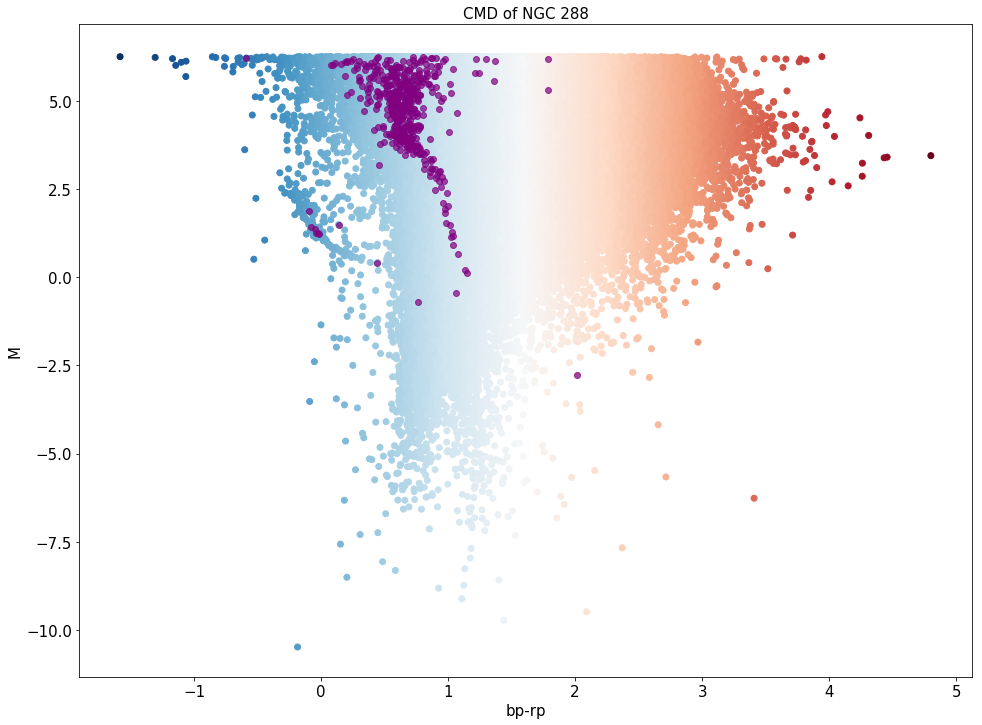

In [2]:
# Plotting core stars CMD on full CMD set (not considering parallax)
# RUN FOR DBSCAN !

#from gaia_tools import query
#import matplotlib
#matplotlib.use("AGG")
#import matplotlib.pyplot as plt
#import numpy as np
#import pandas as pd
#from astropy.table import Table
#import pyexcel
#from astropy import units as u
#from astropy.coordinates import SkyCoord

GlobClust_Log_ra_dec = pd.read_csv('~/GlobClust_ra-dec.csv')
#GlobClust_Log_r_h = GlobClust_Log_ra_dec.loc[:,"r_h"]
#Clust_Edge = GlobClust_Log_r_h
GlobClust_Log_r_c = GlobClust_Log_ra_dec.loc[:,"r_c"]
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[:,"r_t"]

out_logs = ['out_NGC 104_full_4-rt_ra_dec.csv','out_NGC 5694_full_4-rt_ra_dec.csv',\
            'out_NGC 1851_full_4-rt_ra_dec.csv','out_NGC 7492_full_4-rt_ra_dec.csv','out_Pal 5_full_4-rt_ra_dec.csv',\
            'out_NGC 288_full_12-rt_ra_dec.csv']#new file for NGC288
GC_IDs = ['NGC 104', 'NGC 5694', 'NGC 1851', 'NGC 7492', 'Pal 5', 'NGC 288']
Clust_Edge = [GlobClust_Log_r_c[2], GlobClust_Log_r_c[6], GlobClust_Log_r_c[7], GlobClust_Log_r_c[5], GlobClust_Log_r_c[1], GlobClust_Log_r_c[0]] #[0.4, 0.03, 0.1, 0.05, 0.13, 0.2]

d_kpc = [4500, 35000, 45100, 12100, 26300, 8900, 23200, 76500]
d_pc = d_kpc

for i in range(5,6):#len(GC_IDs)): #Should be better
    print([i], ": ", GC_IDs[i], Clust_Edge[i], Clust_Edge[i]/60)
    GlobClust_Log_CMD = pd.read_csv(out_logs[i]) 
    GlobClust_Log_g = GlobClust_Log_CMD.loc[:,"phot_g_mean_mag"]
    GlobClust_Log_rp = GlobClust_Log_CMD.loc[:,"phot_rp_mean_mag"]
    GlobClust_Log_bp = GlobClust_Log_CMD.loc[:,"phot_bp_mean_mag"]
    GlobClust_Log_rpbp = GlobClust_Log_bp - GlobClust_Log_rp
    GlobClust_Log_ra_out = GlobClust_Log_CMD.loc[:,"ra"]
    GlobClust_Log_dec_out = GlobClust_Log_CMD.loc[:,"dec"]
    GlobClust_Log_pmdec_out = GlobClust_Log_CMD.loc[:,"pmdec"]
    GlobClust_Log_pmra_out = GlobClust_Log_CMD.loc[:,"pmra"]
    
    
    #M=m-5(log(d)-1)
    GlobClust_Log_M = GlobClust_Log_g-5*((log10(d_pc[i])) - 1)
    
    indx = (sqrt((np.fabs(GlobClust_Log_ra_out-GlobClust_Log_ra_out.mean())**2+\
                  np.fabs(GlobClust_Log_dec_out-GlobClust_Log_dec_out.mean())**2))<Clust_Edge[i]/60)
    #(np.fabs(GlobClust_Log_ra_out-GlobClust_Log_ra_out.mean())<Clust_Edge[i]/60)*\
    #(np.fabs(GlobClust_Log_dec_out-GlobClust_Log_dec_out.mean())<Clust_Edge[i]/60)  #have used 1.1 & 0.35 for NGC 288
    
    fig=plt.figure(figsize=(16,12))
    plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
    plt.scatter(x=GlobClust_Log_rpbp[indx], y=GlobClust_Log_M[indx], c='purple', alpha=0.7) #core stars
    plt.xlabel('bp-rp', fontsize=15)
    plt.ylabel('M', fontsize=15)
    plt.title('CMD of ' + GC_IDs[i], fontsize=15)
    #cb=plt.colorbar()
    #cb.ax.tick_params(labelsize=15)
    #cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
    plt.gca().tick_params(labelsize=15)
    plt.show()

    #CMD_raw = {'bprp': GlobClust_Log_rpbp, 'M': GlobClust_Log_M, 'ra': GlobClust_Log_ra_out, 'dec': GlobClust_Log_dec_out}
    #CMD_plot = pd.DataFrame(data=CMD_raw)
    #CMD_plot.to_csv('out_CMD_'+ GC_IDs[i] +'_rawplot.csv', index=True, header=True)
    
    #GC_StarsPlot = {'bprp indx': GlobClust_Log_rpbp[indx], 'M indx': GlobClust_Log_M[indx], 'ra': GlobClust_Log_ra_out,\
    #                'dec': GlobClust_Log_dec_out}
    #GC_StarscutPlot = pd.DataFrame(data=GC_StarsPlot)
    #GC_StarscutPlot.to_csv('out_GCStars_'+ GC_IDs[i] +'_cutplot_r_c.csv', index=True, header=True)
    


NameError: name 'ra_ic3' is not defined

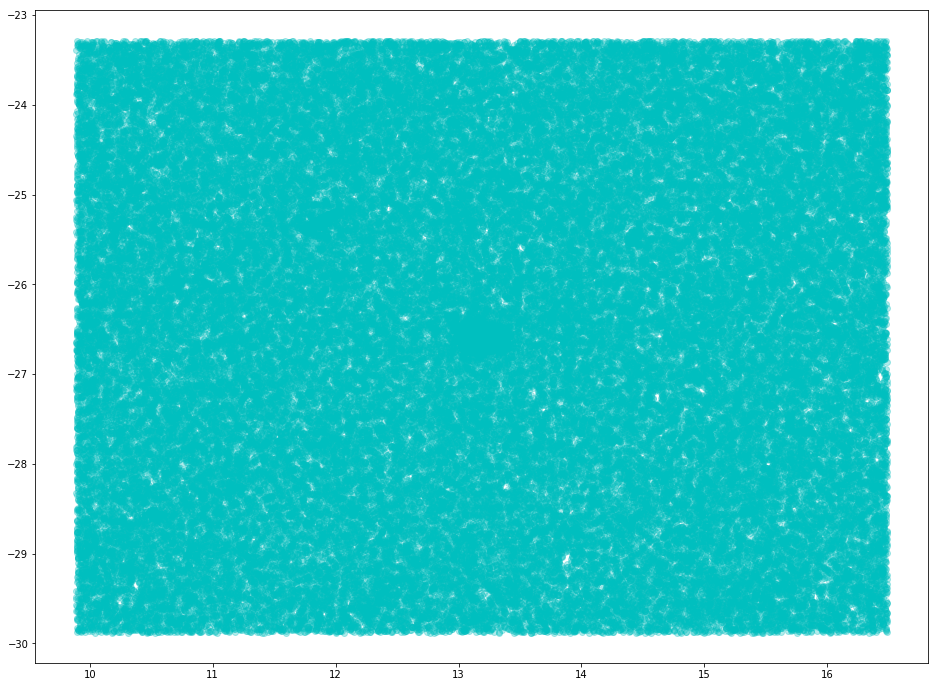

In [3]:
# Full Ra-Dec set overplotted with cleaned data of Cluster Stars  (Run after next 2 cells)

fig=plt.figure(figsize=(16,12))
indx2 = [not i for i in indx]
plt.scatter(x=GlobClust_Log_ra_out, y=GlobClust_Log_dec_out, c='c', alpha=0.3)
#plt.scatter(x=GlobClust_Log_ra_out[indx2], y=GlobClust_Log_dec_out[indx2], c='c', alpha=0.3)
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_ic3, y=dec_ic3, c='purple')#, alpha=0.2)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.show()

In [4]:
# csv-pd set up for DBSCANN

GlobClust_Log_ra_dec = pd.read_csv('~/GlobClust_ra-dec.csv')
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[0:0,"r_t"]
GlobClust_Log_radec = GlobClust_Log_ra_dec.loc[0:0,"RA":"DEC"]
GlobClust_Log_ID = GlobClust_Log_ra_dec.loc[0:0,"ID"]
#GlobClust_Log_dec = GlobClust_Log_ra_dec.loc[:,"dec"]
#GlobClust_Log_RA = GlobClust_Log_ra_dec.loc[0:7,"RA"]
#GlobClust_Log_DEC = GlobClust_Log_ra_dec.loc[0:7,"DEC"]
print(GlobClust_Log_r_t)

GlobClust_Log_2 = pd.read_csv('~/out_NGC 288_full_12-rt_ra_dec.csv')
GlobClust_Log_pmra = GlobClust_Log_2.loc[:,"pmra"]
GlobClust_Log_pmdec = GlobClust_Log_2.loc[:,"pmdec"]
GlobClust_Log_ra = GlobClust_Log_2.loc[:,"ra"]
GlobClust_Log_dec = GlobClust_Log_2.loc[:,"dec"]
GlobClust_Log_pmra = GlobClust_Log_pmra.as_matrix()
GlobClust_Log_pmdec = GlobClust_Log_pmdec.as_matrix()
GlobClust_Log_ra = GlobClust_Log_ra.as_matrix()
GlobClust_Log_dec = GlobClust_Log_dec.as_matrix()

GlobClust_Log_parallax_out = GlobClust_Log_2.loc[:,"parallax"]
GlobClust_Log_parallaxerror_out = GlobClust_Log_2.loc[:,"parallax_error"]
GlobClust_Log_parallaxe_out = GlobClust_Log_2.loc[:,"parallax":"parallax_error"]

0    13.192702
Name: r_t, dtype: float64


In [ ]:
for i in range(0,20):
    # DBSCANN - parallax after scan

    coord_ra_dec_deg=[]
    coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
    print(coord_ra_dec)

    DB_Params =[]
    DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

    DF={'M': GlobClust_Log_M/5, 'rpbp': GlobClust_Log_rpbp/2.5, 'pmra': GlobClust_Log_pmra/20, 'pmdec': GlobClust_Log_pmdec/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

    DB_Params = pd.DataFrame(data=DF)
    DB_Params=DB_Params.dropna()

    print(shape(DB_Params))

    db=sklearn.cluster.DBSCAN(eps=0.1625/4, min_samples=30, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

    print(db.labels_)
    print(shape(db.labels_))

    fig=plt.figure(figsize=(18,12))
    plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

    print('Estimated number of Subgroups: %d' % n_clusters_)

    x_param3=[]
    y_param3=[]

    x_param4=[]
    y_param4=[]

    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)
    
        #NOISE
        #xy = DB_Params[class_member_mask & ~core_samples_mask]
        #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
        #         markeredgecolor='k', markersize=6)
    
        #CLEANED DATA
        xy = DB_Params[class_member_mask & core_samples_mask]
    
        plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=14)
    
        x_param3.append(xy.loc[:, "rpbp"]*2.5)
        y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

    plt.gca().invert_yaxis()
    plt.title('Estimated number of Subgroups: %d' % n_clusters_)
    #cb=plt.colorbar()
    #cb.ax.tick_params(labelsize=15)
    plt.xlabel('bp-rp', fontsize=15)
    plt.ylabel('M', fontsize=15)

    plt.legend()
    plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(94729, 4)
[-1 -1 -1 ..., -1 -1 -1]
(94729,)
Estimated number of Subgroups: 5


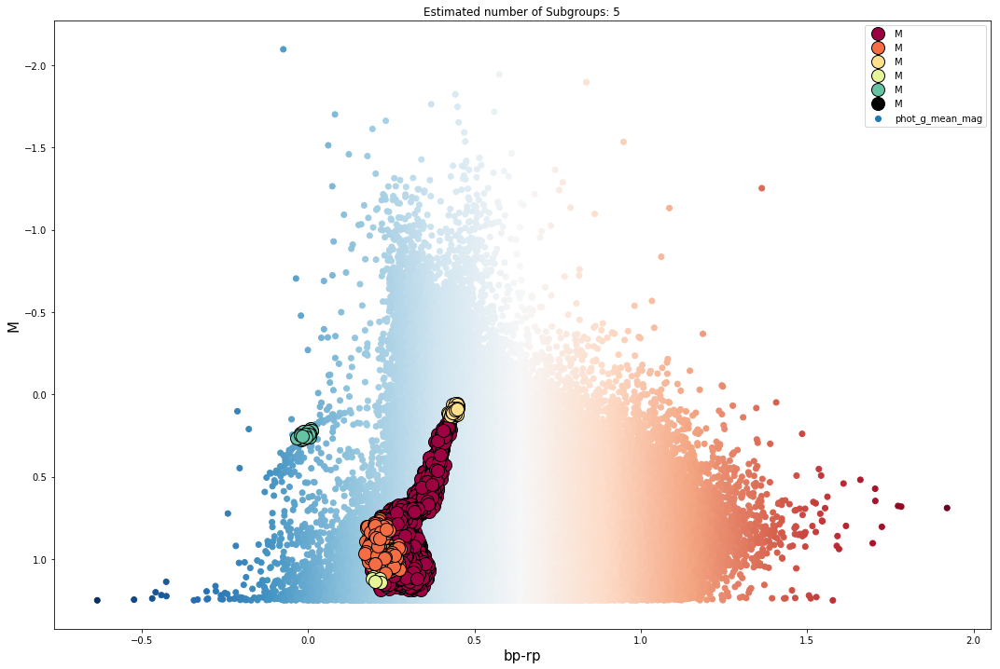

In [5]:
# DBSCANN - parallax after scan

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M/5, 'rpbp': GlobClust_Log_rpbp/2.5, 'pmra': GlobClust_Log_pmra/20, 'pmdec': GlobClust_Log_pmdec/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/4, min_samples=30, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

(6208, 1)
(0, 0)
/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



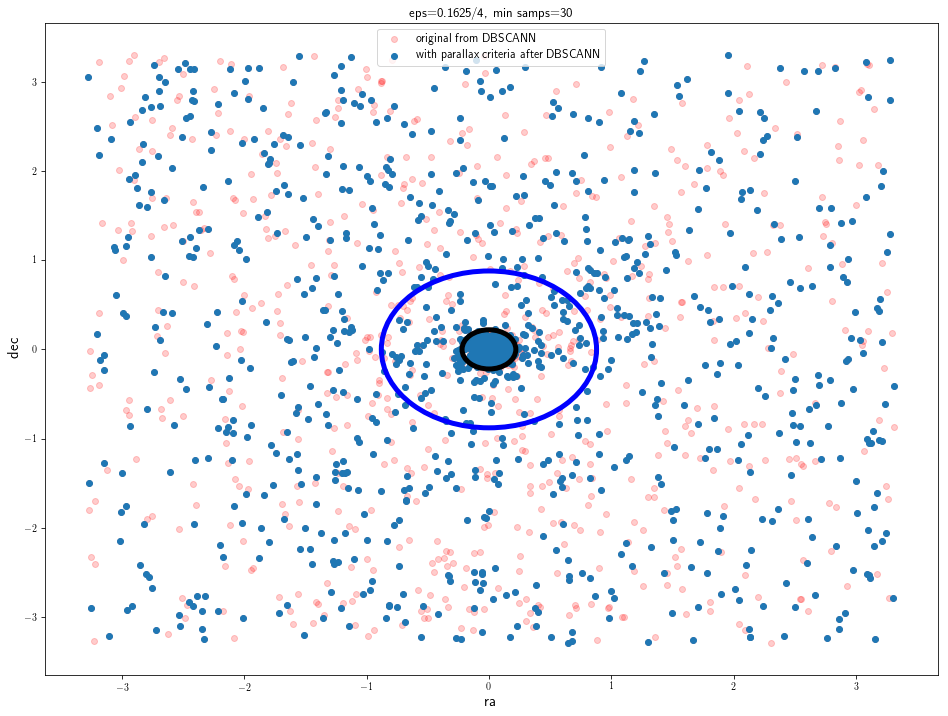

In [46]:
x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
#x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
#y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)

pmra_DB_norm = (pmra_DB-pmra_DB.mean())/(pmra_DB.mean())
pmdec_DB_norm = (pmdec_DB-pmdec_DB.mean())/(pmdec_DB.mean())

GC_parallax = GlobClust_Log_parallax_out.reindex(y_out3.index)
GC_parallaxerror = GlobClust_Log_parallaxerror_out.reindex(y_out3.index)
GC_parallaxe = GlobClust_Log_parallaxe_out.reindex(y_out3.index)

GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out
GC_parallaxover = GlobClust_Log_parallaxover_out.reindex(y_out3.index)

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx=((1/GC_parallax<5.)*(GC_parallaxover<0.10))
parallax_indx=[not i for i in parallax_indx]

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='r', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), label='with parallax criteria after DBSCANN')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/4, min samps=30')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-5.19601955 -4.95564038 -4.88035362 ...,  0.90736292  0.94235007
  0.97168979]
[-12.19261192 -12.01339295 -12.00687681 ...,  -0.23336205   0.12198985
   0.14389686]
[-3.1928472  -3.18025961 -3.13868028 ...,  3.09040783  3.15928254
  3.29956648]
[-6.41943169 -6.26544658 -6.21896116 ...,  6.18415018  6.23048516
  6.59025477]


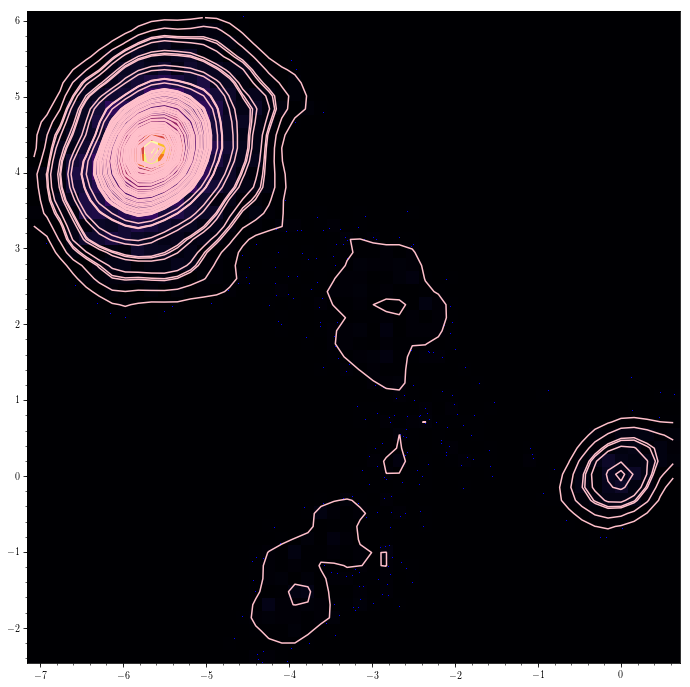

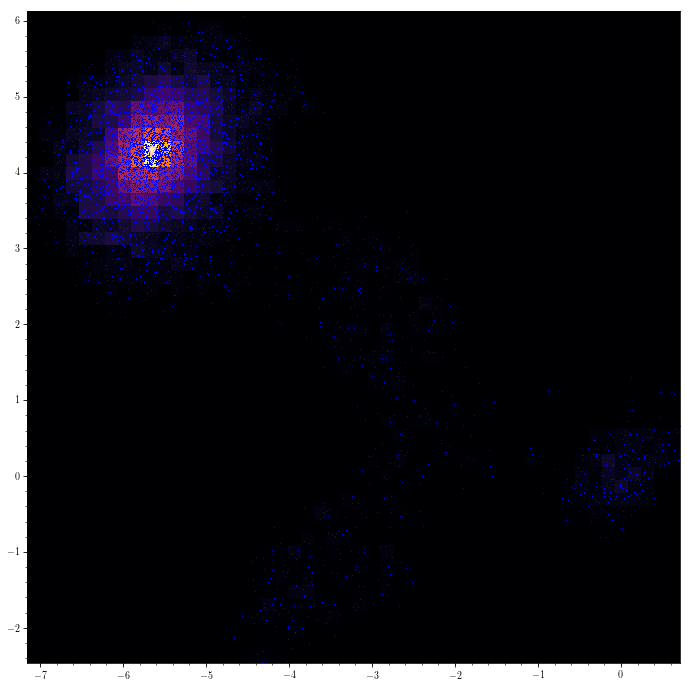

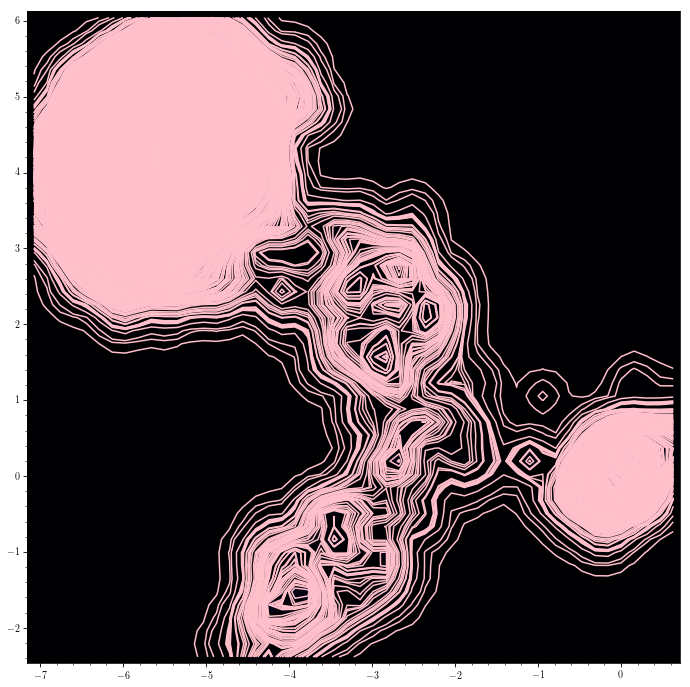

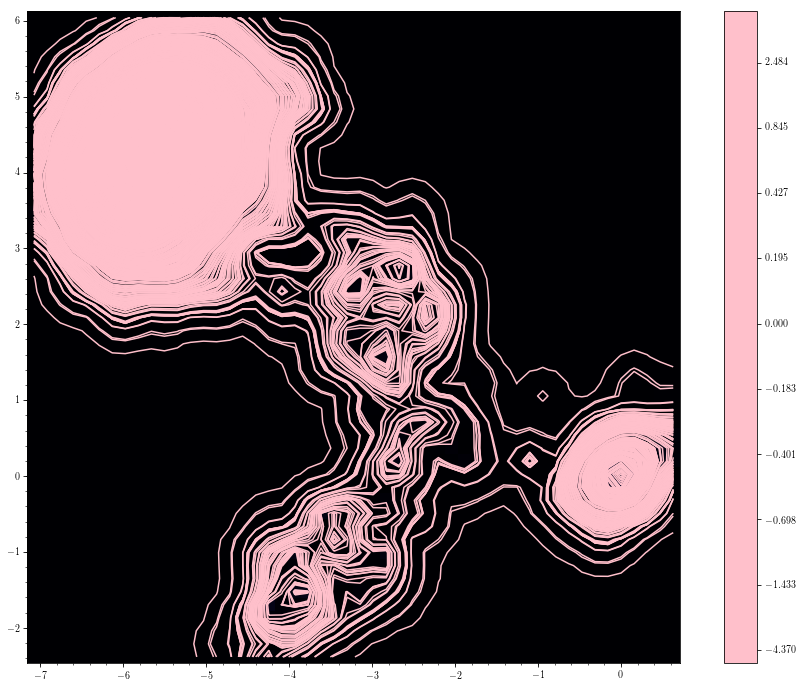

In [47]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

#df=pd.DataFrame(pmra_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmra=df.append(pmra_DB).append(df)

#df=pd.DataFrame(pmdec_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmdec=df.append(pmdec_DB).append(df)

#df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB.join(pmdec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


In [ ]:
#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

[-5.19601955 -4.95564038 -4.88035362 ...,  0.90736292  0.94235007
  0.97168979]
[-12.19261192 -12.01339295 -12.00687681 ...,  -0.23336205   0.12198985
   0.14389686]
[-3.1928472  -3.18025961 -3.13868028 ...,  3.09040783  3.15928254
  3.29956648]
[-6.41943169 -6.26544658 -6.21896116 ...,  6.18415018  6.23048516
  6.59025477]


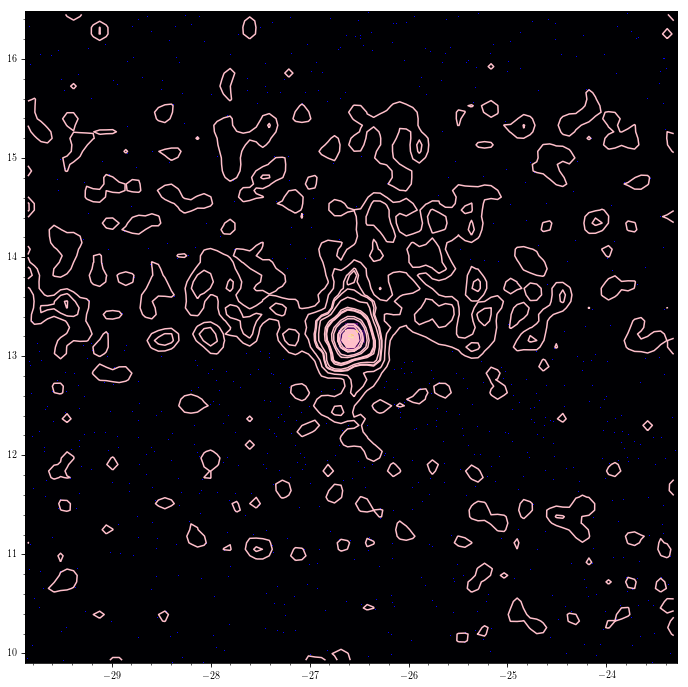

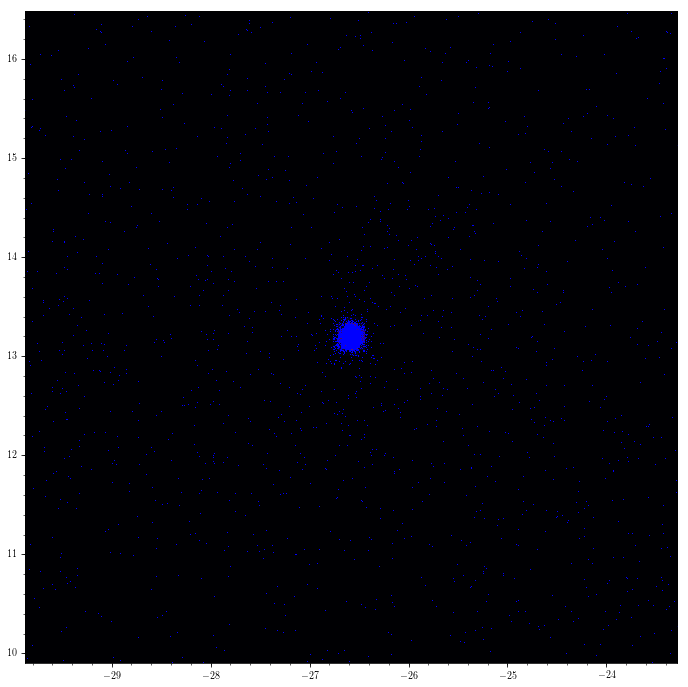

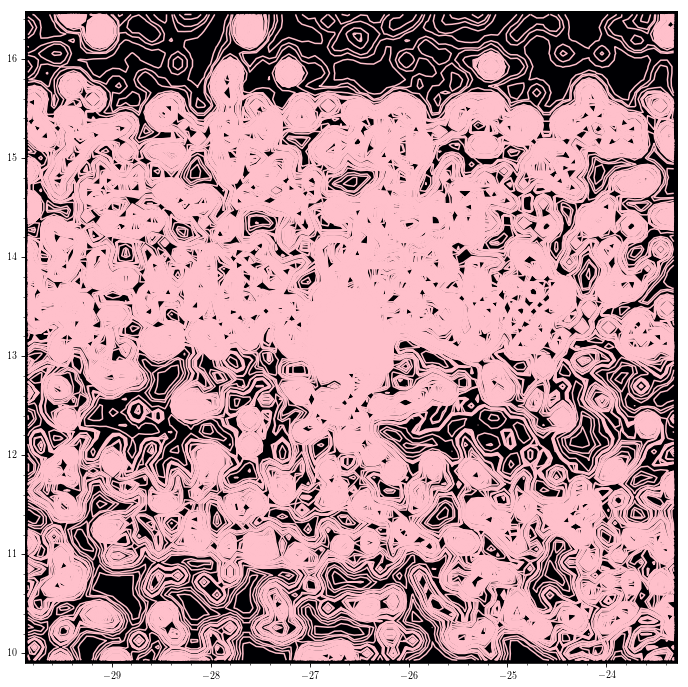

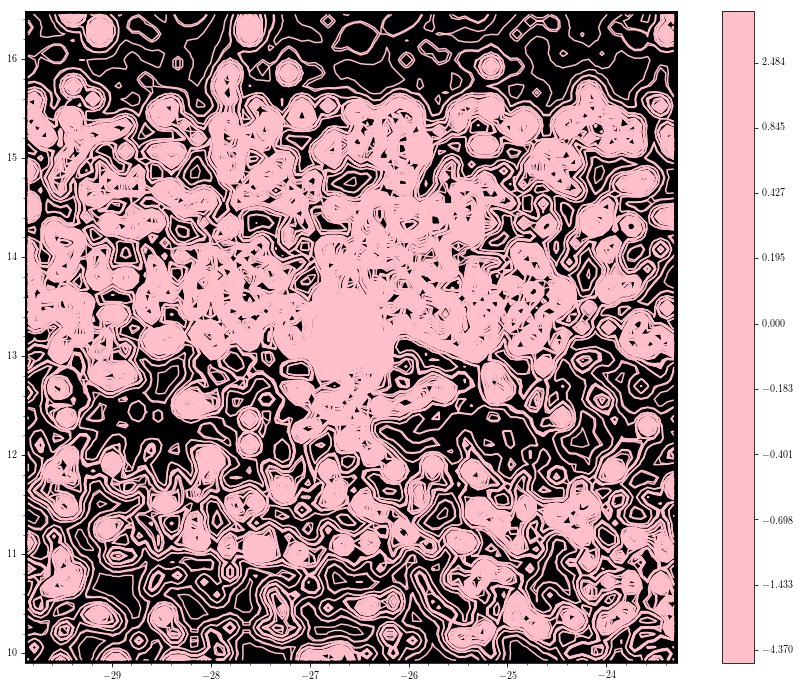

In [8]:
# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB.join(dec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

In [44]:
from scipy import ndimage as ndi
import matplotlib.pyplot as plt
from skimage.feature import peak_local_max
from skimage import data, img_as_float


image_max = ndi.maximum_filter(WT2_aa, size=20, mode='constant')

# Comparison between image_max and im to find the coordinates of local maxima
coordinates = peak_local_max(WT2_aa, min_distance=20)

coordinates

ModuleNotFoundError: No module named 'skimage'

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(59203, 4)
[-1 -1 -1 ...,  0 -1 -1]
(59203,)
Estimated number of Subgroups: 3


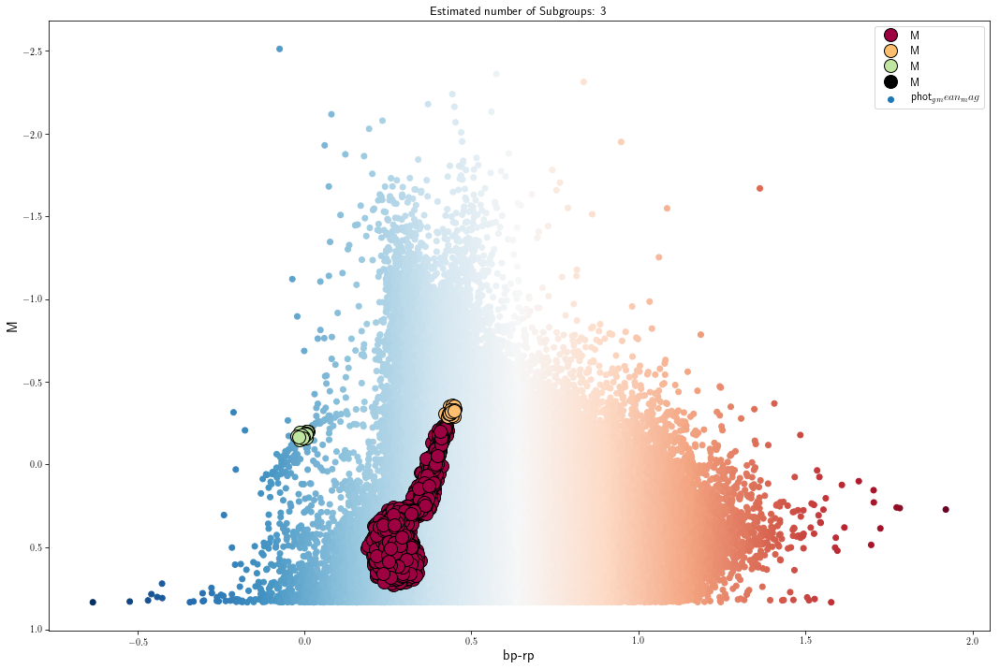

(3068, 1)
(0, 0)


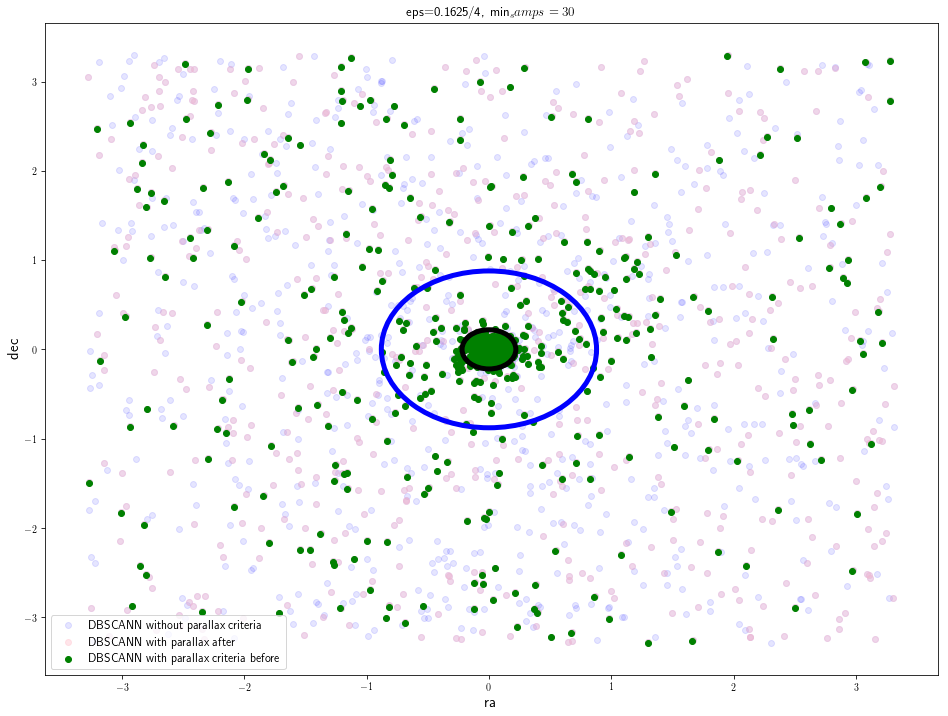

In [9]:
# DBSCANN - parallax before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx2=((1/GlobClust_Log_parallax_out<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx2=[not i for i in parallax_indx2]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M[parallax_indx2]/5, 'rpbp': GlobClust_Log_rpbp[parallax_indx2]/2.5,\
    'pmra': GlobClust_Log_pmra[parallax_indx2]/20, 'pmdec': GlobClust_Log_pmdec[parallax_indx2]/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/4, min_samples=30, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB2 = GC_ra.reindex(x_out3.index)
dec_DB2 = GC_dec.reindex(y_out3.index)
pmra_DB2 = GC_pmra.reindex(x_out3.index)
pmdec_DB2 = GC_pmdec.reindex(y_out3.index)

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='b', alpha=0.1, label='DBSCANN without parallax criteria')
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), c='pink', alpha=0.4, label='DBSCANN with parallax after')
plt.scatter(ra_DB2-ra_DB2.mean(), dec_DB2-dec_DB2.mean(),  c='g', label='DBSCANN with parallax criteria before')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/4, min_samps=30')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

In [141]:
shape(pmra_DB2)

(2185, 1)

[-2.89004758 -2.87086876 -2.81123383 ...,  0.13104808  0.24932964
  0.25176036]
[-11.36036218 -11.31276517 -11.27258347 ...,  -8.81222517  -8.80801997
  -8.76162638]
[-1.56658494 -1.56428115 -1.55130035 ...,  1.48910278  1.54980727
  1.67690628]
[-1.36455695 -1.30412329 -1.18497249 ...,  1.158408    1.20293333
  1.31921612]


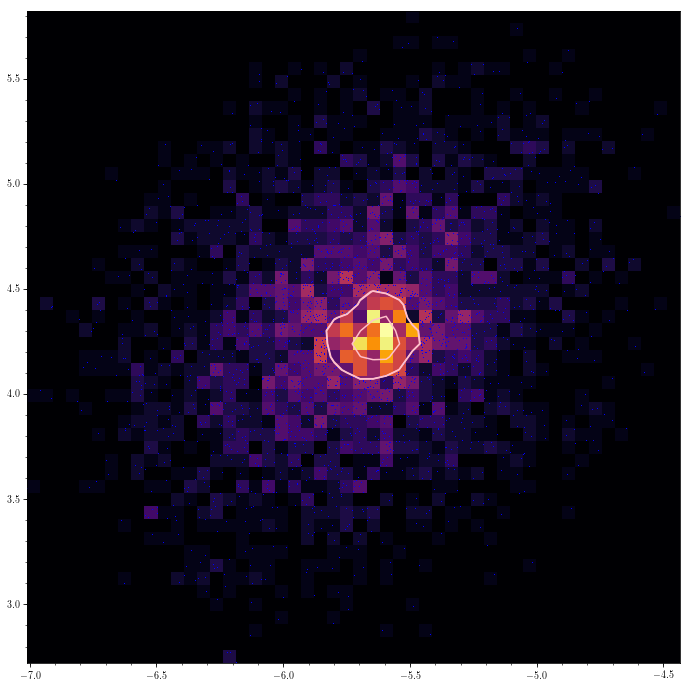

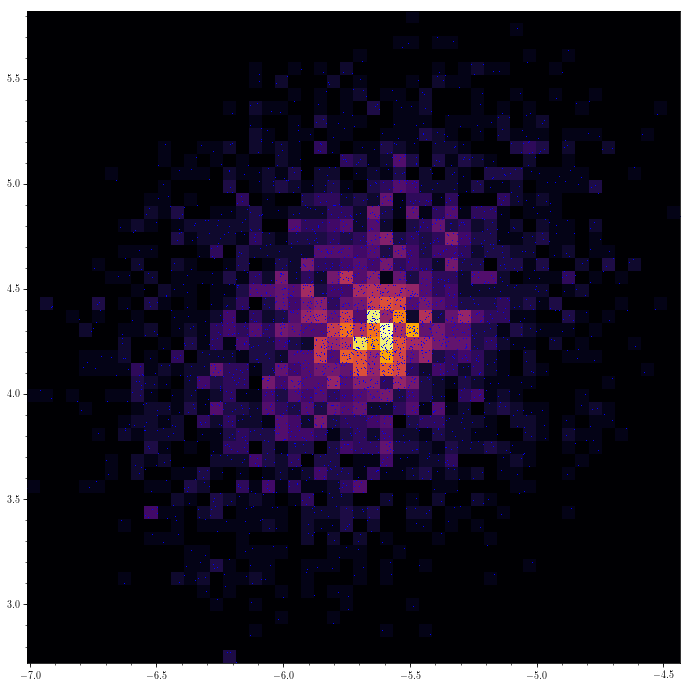

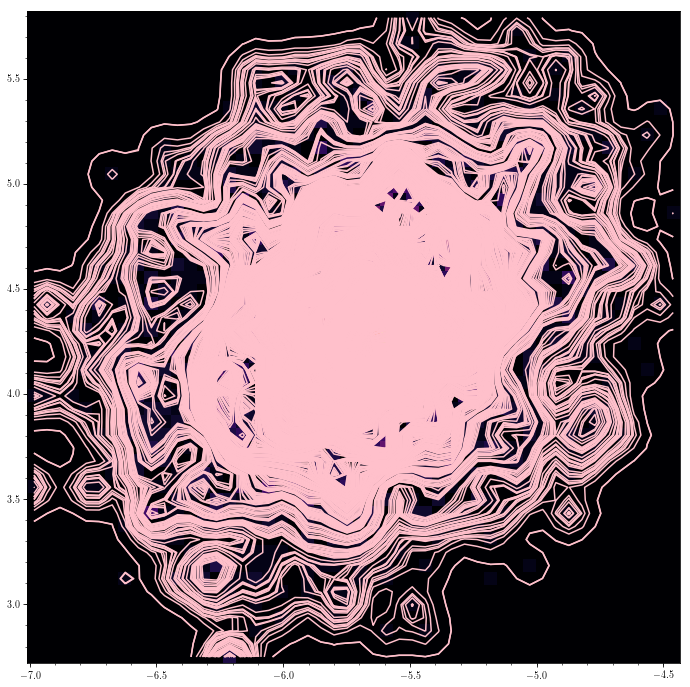

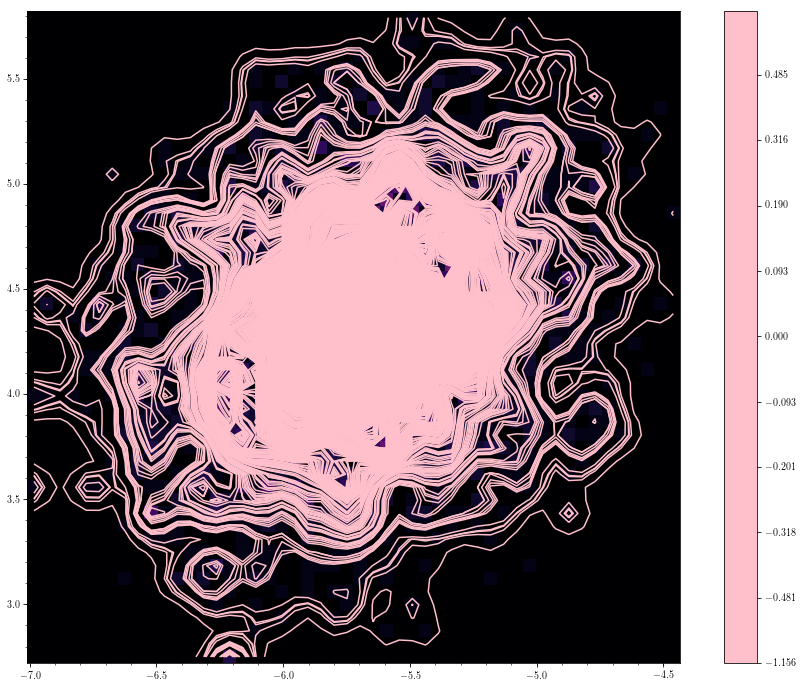

[-2.89004758 -2.87086876 -2.81123383 ...,  0.13104808  0.24932964
  0.25176036]
[-11.36036218 -11.31276517 -11.27258347 ...,  -8.81222517  -8.80801997
  -8.76162638]
[-1.56658494 -1.56428115 -1.55130035 ...,  1.48910278  1.54980727
  1.67690628]
[-1.36455695 -1.30412329 -1.18497249 ...,  1.158408    1.20293333
  1.31921612]


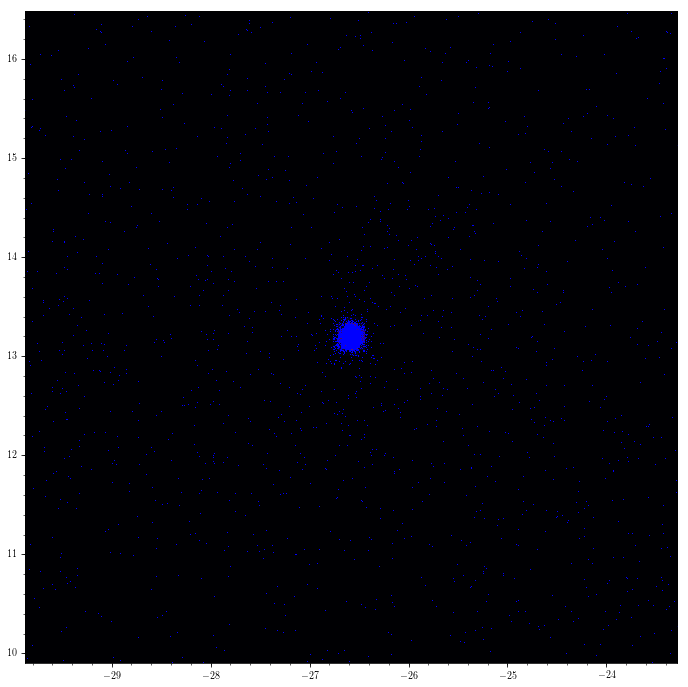

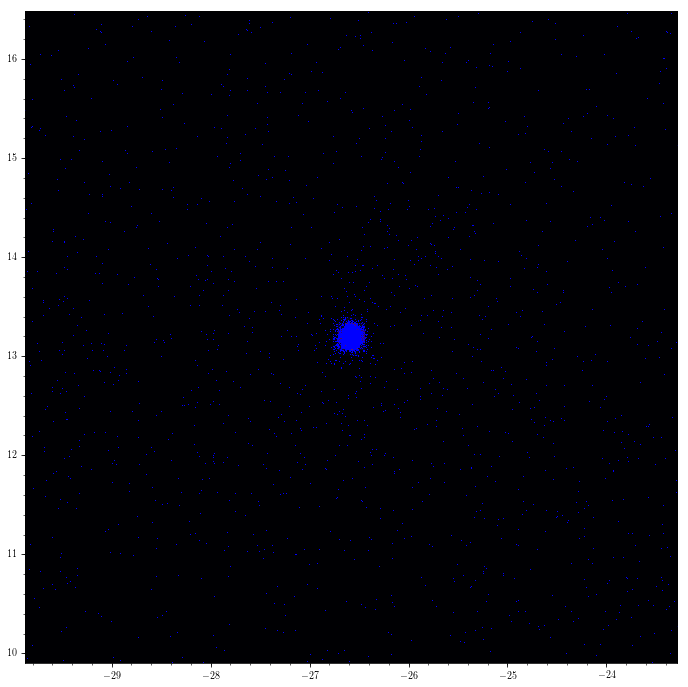

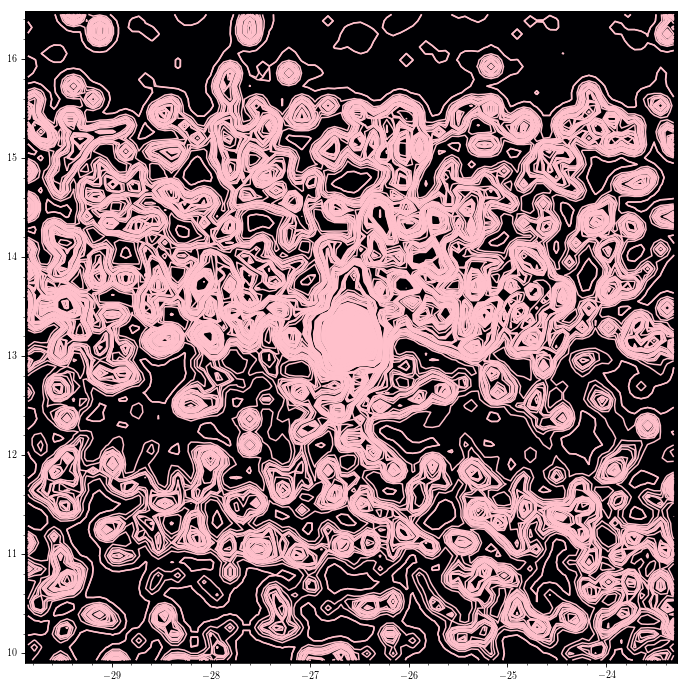

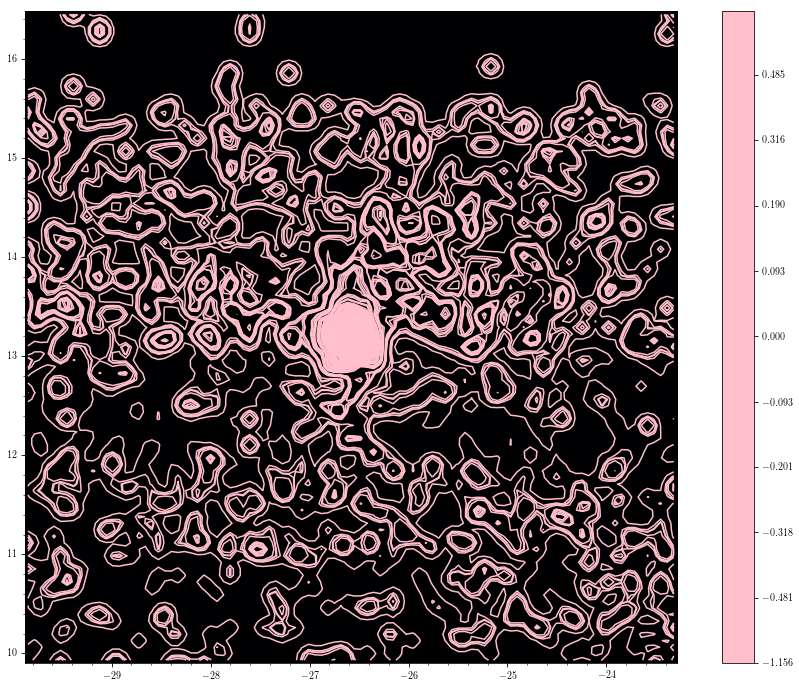

In [10]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

#df=pd.DataFrame(pmra_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmra=df.append(pmra_DB).append(df)

#df=pd.DataFrame(pmdec_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmdec=df.append(pmdec_DB).append(df)

#df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB2.join(pmdec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB.join(dec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(94729, 4)
[-1 -1 -1 ..., -1 -1 -1]
(94729,)
Estimated number of Subgroups: 4


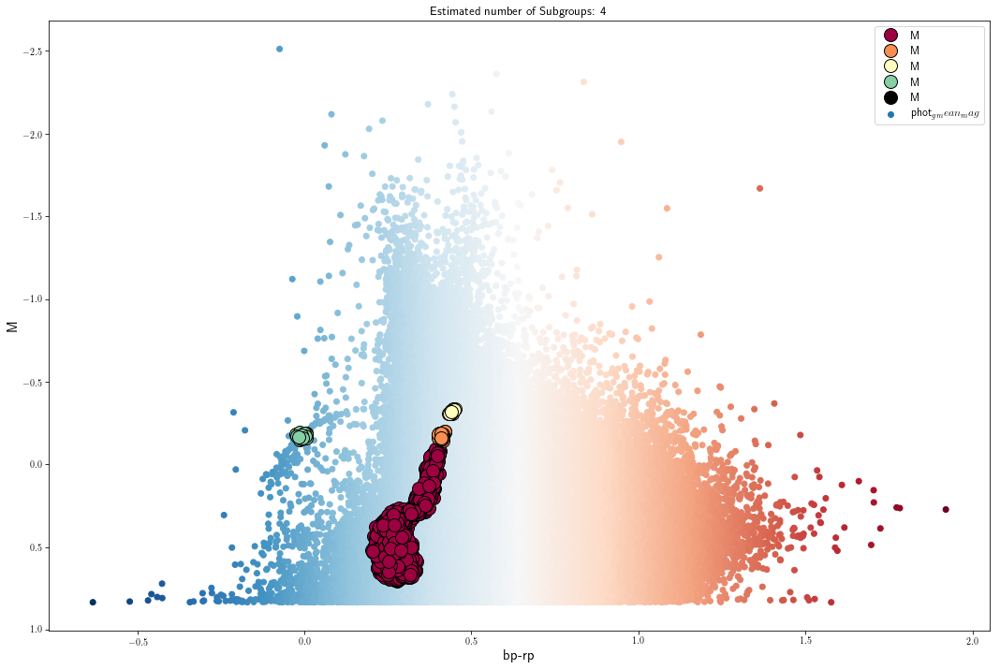

(3633, 1)
(0, 0)
/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



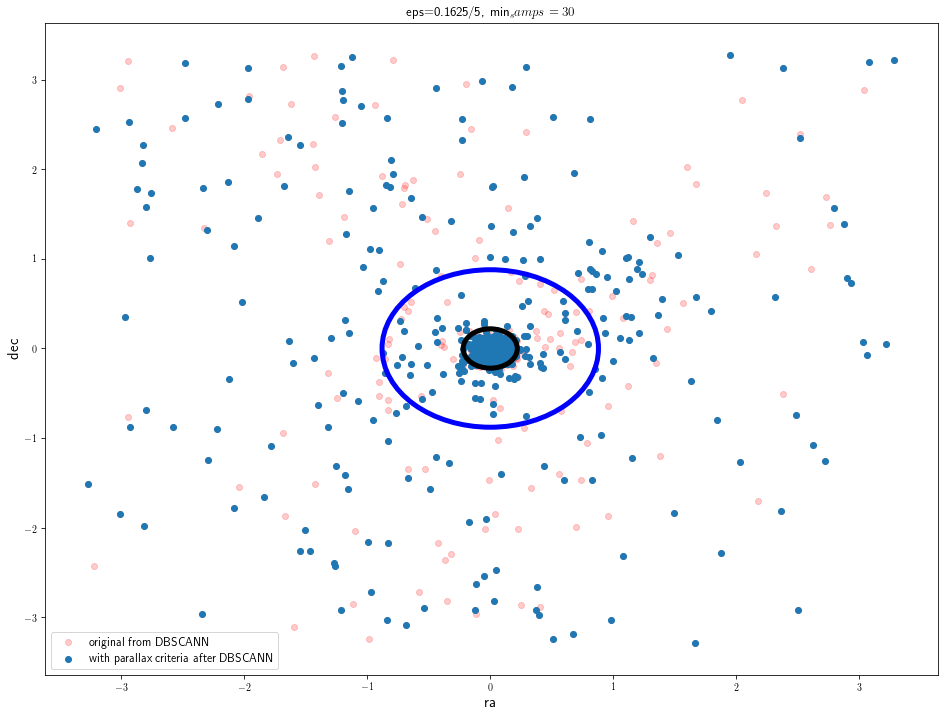

In [11]:
# DBSCANN - parallax after scan

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M/5, 'rpbp': GlobClust_Log_rpbp/2.5, 'pmra': GlobClust_Log_pmra/20, 'pmdec': GlobClust_Log_pmdec/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/5, min_samples=30, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)

GC_parallax = GlobClust_Log_parallax_out.reindex(y_out3.index)
GC_parallaxerror = GlobClust_Log_parallaxerror_out.reindex(y_out3.index)
GC_parallaxe = GlobClust_Log_parallaxe_out.reindex(y_out3.index)

GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out
GC_parallaxover = GlobClust_Log_parallaxover_out.reindex(y_out3.index)

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx=((1/GC_parallax<5.)*(GC_parallaxover<0.10))
parallax_indx=[not i for i in parallax_indx]

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='r', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), label='with parallax criteria after DBSCANN' )
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/5, min_samps=30')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

In [139]:
shape(pmradec)

(3633, 2)

[-2.81040411 -2.73007223 -2.72777402 ...,  0.08742011  0.09411486
  0.29959377]
[-11.10290274 -11.06351768 -11.0523162  ...,  -8.8150369   -8.77473674
  -8.59099444]
[-1.73683518 -1.46215267 -1.45302074 ...,  1.33671347  1.34195042
  1.51333562]
[-1.10208111 -1.07570094 -1.05462086 ...,  1.13535238  1.20566599
  1.22673823]


ValueError: Contour levels must be increasing

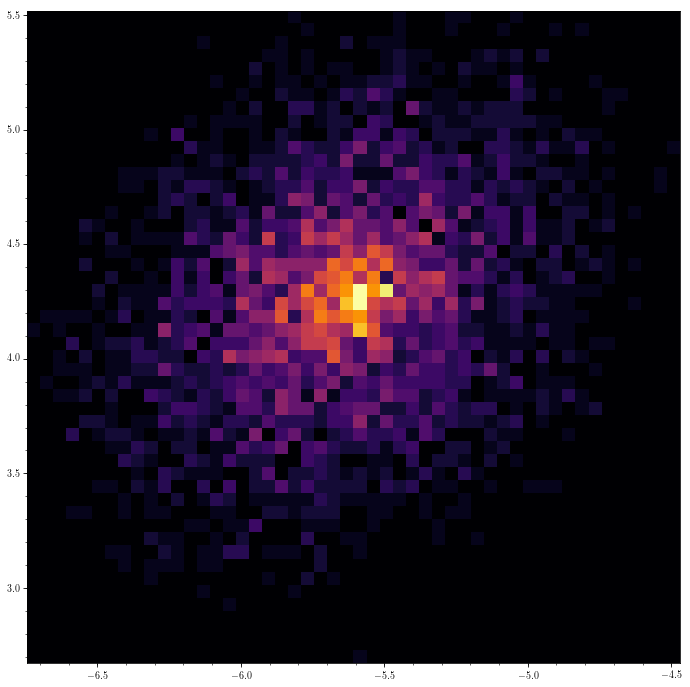

In [14]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

df=pd.DataFrame(pmra_DB.mean()).transpose()
df=pd.concat([df]*231, ignore_index=True)
df_pmra=df.append(pmra_DB).append(df).append(pmra_DB.mean(), ignore_index=True)

df=pd.DataFrame(pmdec_DB.mean()).transpose()
df=pd.concat([df]*231, ignore_index=True)
df_pmdec=df.append(pmdec_DB).append(df).append(pmdec_DB.mean(), ignore_index=True)

df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB.join(pmdec_DB)

WT2 = pywt.swtn(df_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB.join(dec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(59203, 4)
[-1 -1 -1 ..., -1 -1 -1]
(59203,)
Estimated number of Subgroups: 4


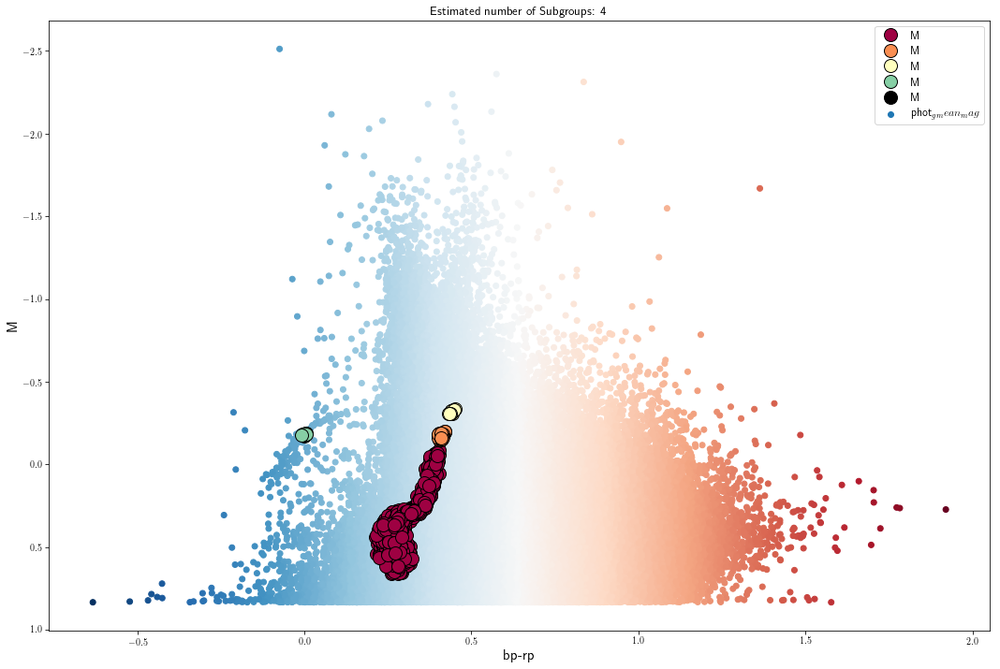

(1908, 1)
(0, 0)


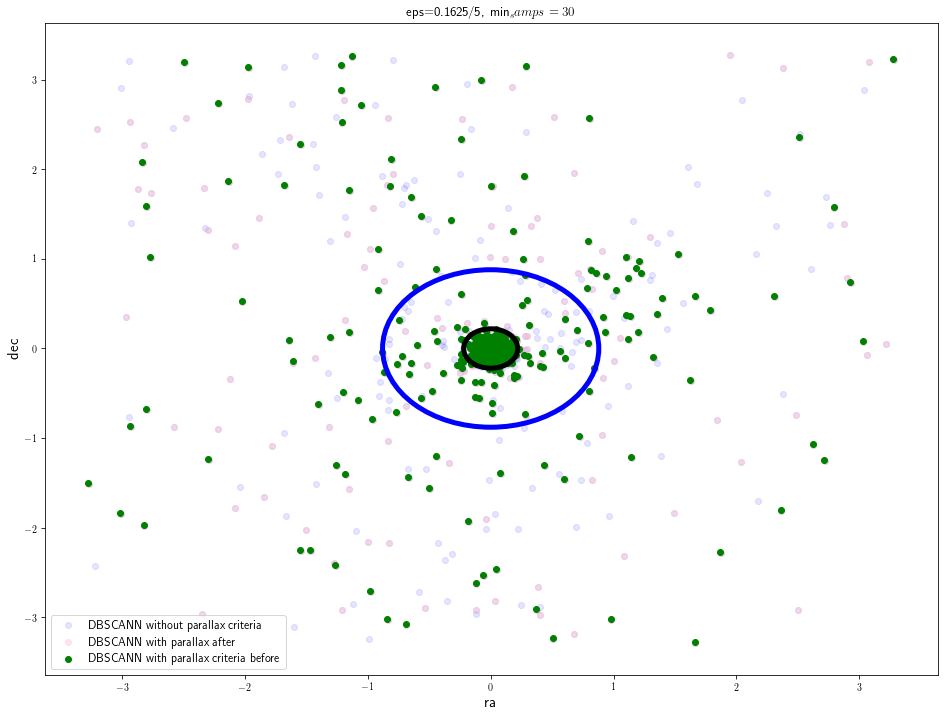

In [15]:
# DBSCANN - prallax before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx2=((1/GlobClust_Log_parallax_out<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx2=[not i for i in parallax_indx2]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M[parallax_indx2]/5, 'rpbp': GlobClust_Log_rpbp[parallax_indx2]/2.5,\
    'pmra': GlobClust_Log_pmra[parallax_indx2]/20, 'pmdec': GlobClust_Log_pmdec[parallax_indx2]/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/5, min_samples=30, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB2 = GC_ra.reindex(x_out3.index)
dec_DB2 = GC_dec.reindex(y_out3.index)
pmra_DB2 = GC_pmra.reindex(x_out3.index)
pmdec_DB2 = GC_pmdec.reindex(y_out3.index)

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='b', alpha=0.1, label='DBSCANN without parallax criteria')
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), c='pink', alpha=0.4, label='DBSCANN with parallax after')
plt.scatter(ra_DB2-ra_DB2.mean(), dec_DB2-dec_DB2.mean(),  c='g', label='DBSCANN with parallax criteria before')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/5, min_samps=30')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-2.66959261 -2.45834876 -2.4550697  ..., -0.27759642 -0.14079113
 -0.05498496]
[-10.9629231  -10.9437911  -10.90378122 ...,  -9.16524645  -9.14462324
  -9.08693356]
[-1.32024234 -1.1438024  -1.07417    ...,  1.16871666  1.20993662
  1.32622906]
[-0.99141554 -0.91492991 -0.88993677 ...,  0.83678763  0.86666621
  0.90217701]


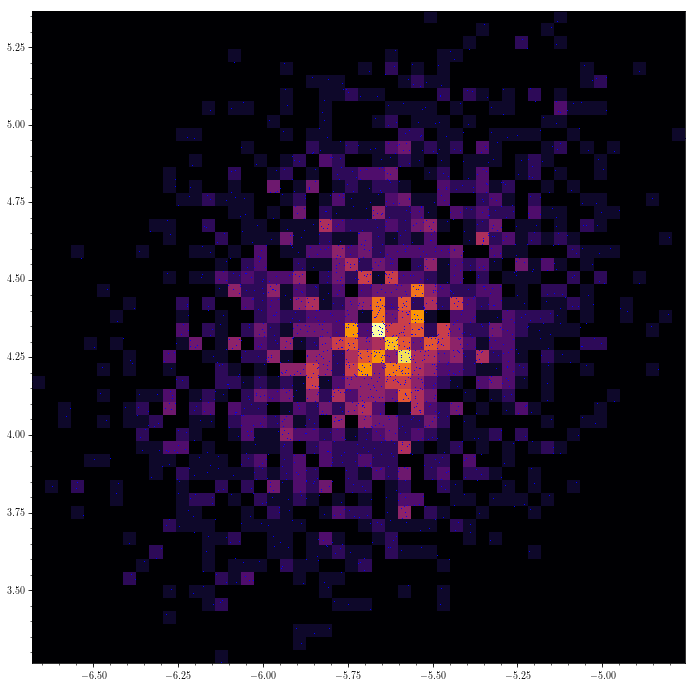

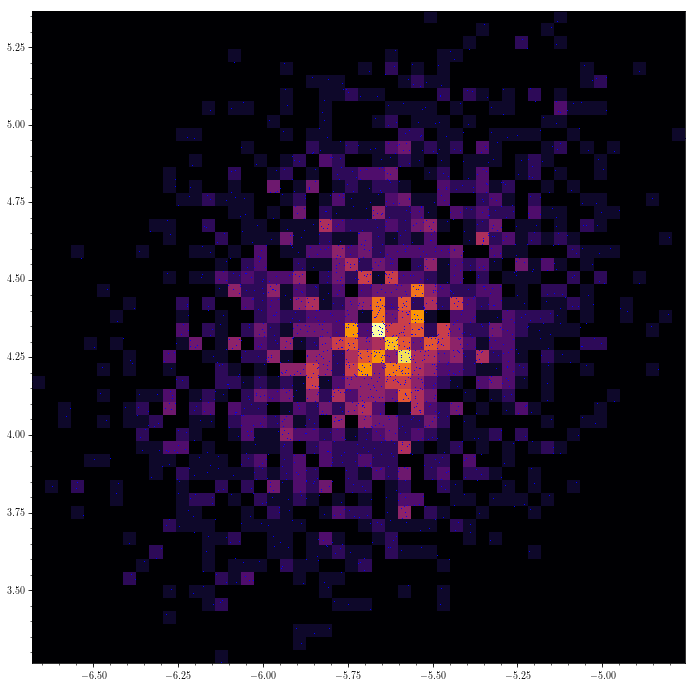

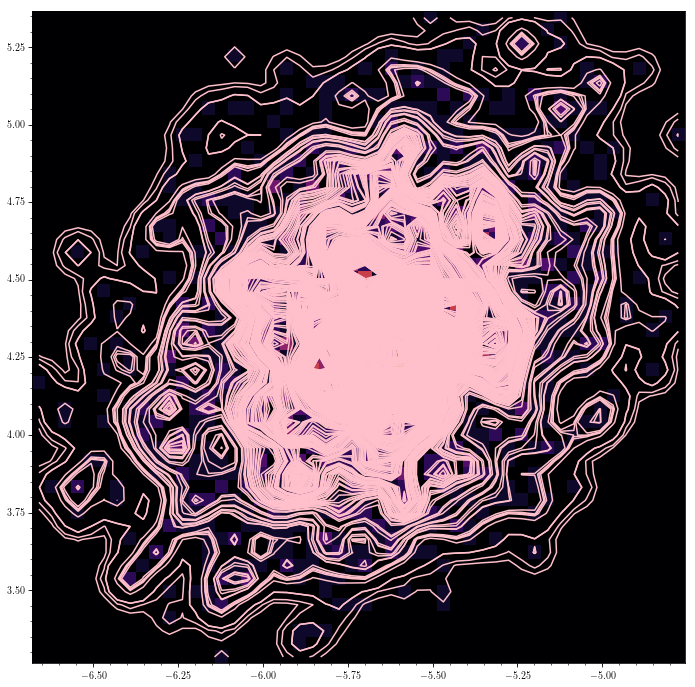

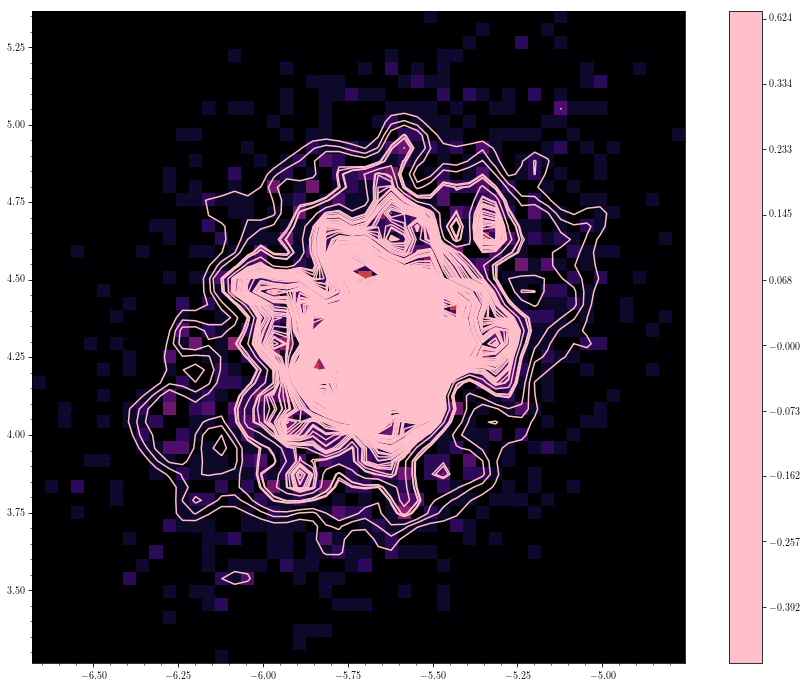

[-2.66959261 -2.45834876 -2.4550697  ..., -0.27759642 -0.14079113
 -0.05498496]
[-10.9629231  -10.9437911  -10.90378122 ...,  -9.16524645  -9.14462324
  -9.08693356]
[-1.32024234 -1.1438024  -1.07417    ...,  1.16871666  1.20993662
  1.32622906]
[-0.99141554 -0.91492991 -0.88993677 ...,  0.83678763  0.86666621
  0.90217701]


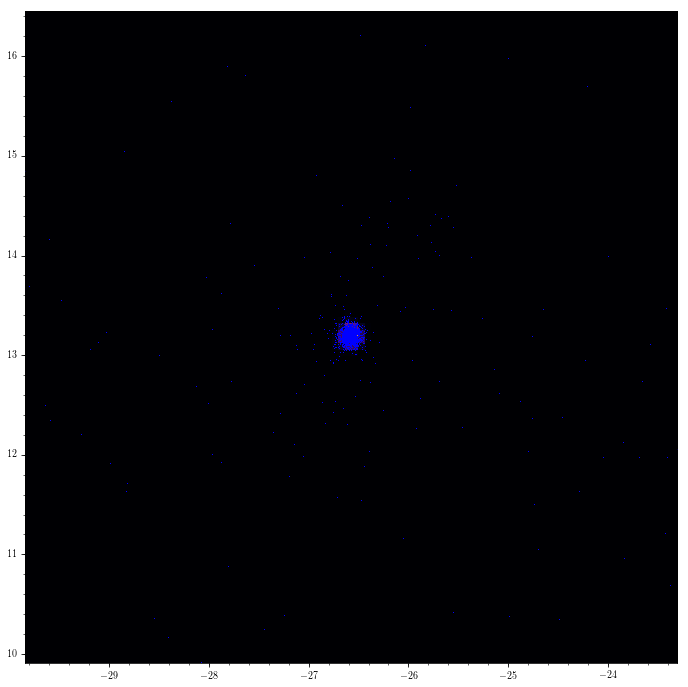

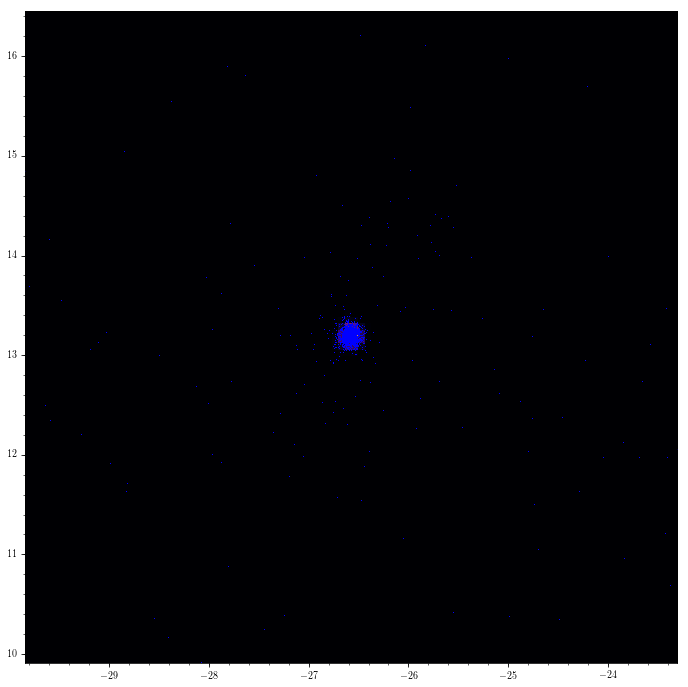

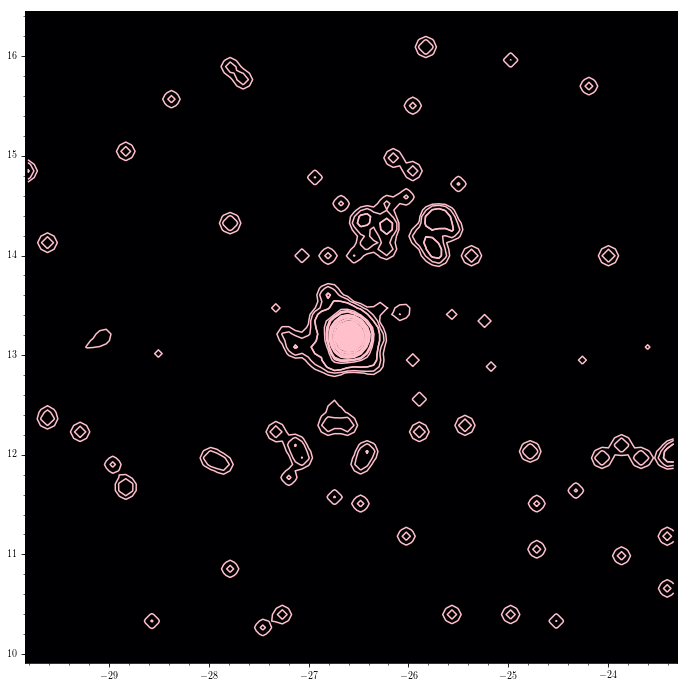

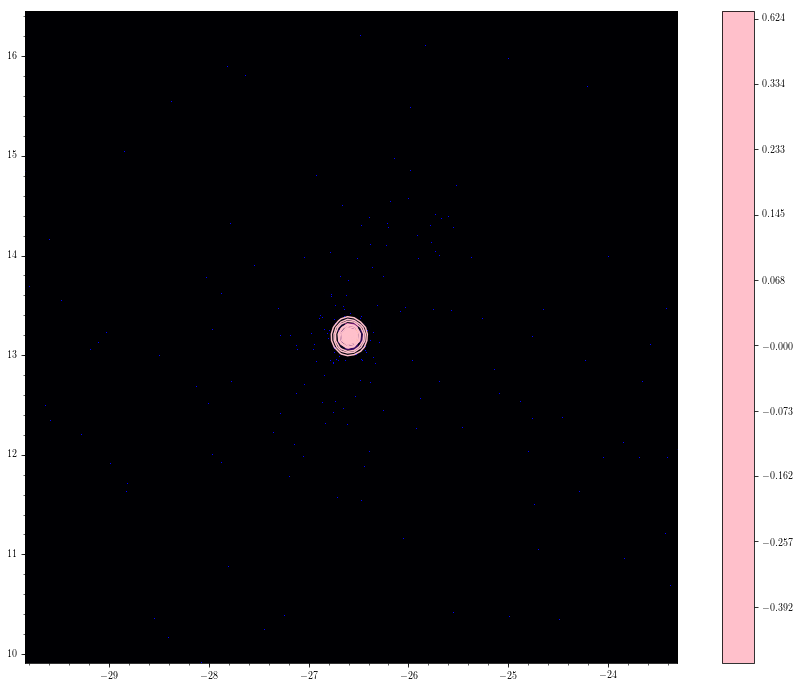

In [16]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

#df=pd.DataFrame(pmra_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmra=df.append(pmra_DB).append(df)

#df=pd.DataFrame(pmdec_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmdec=df.append(pmdec_DB).append(df)

#df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB2.join(pmdec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB2.join(dec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(94729, 4)
[-1 -1 -1 ..., -1 -1 -1]
(94729,)
Estimated number of Subgroups: 8


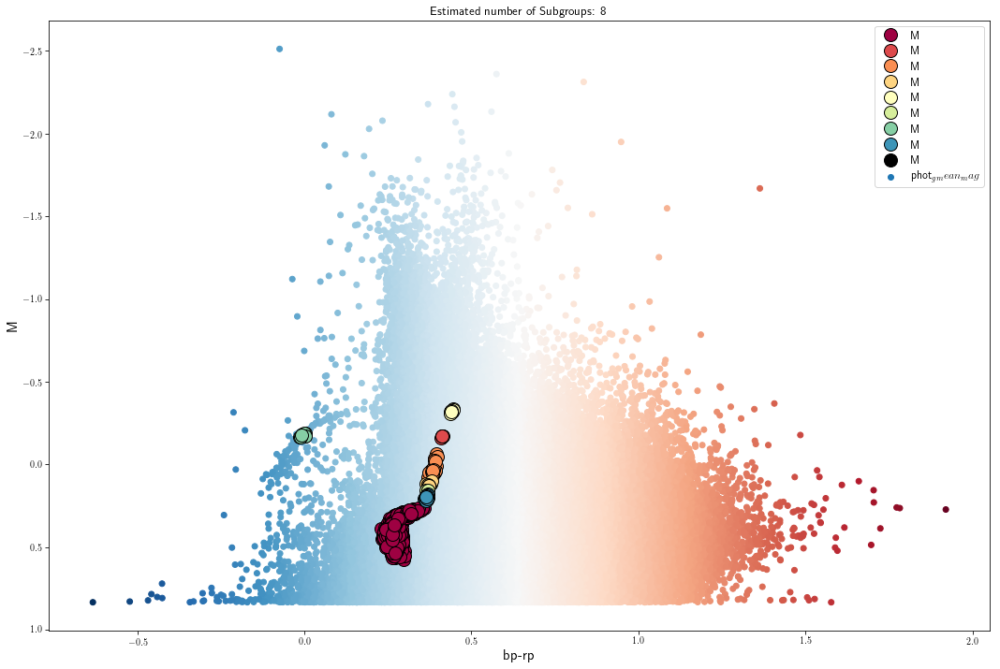

(1040, 1)
(0, 0)
/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



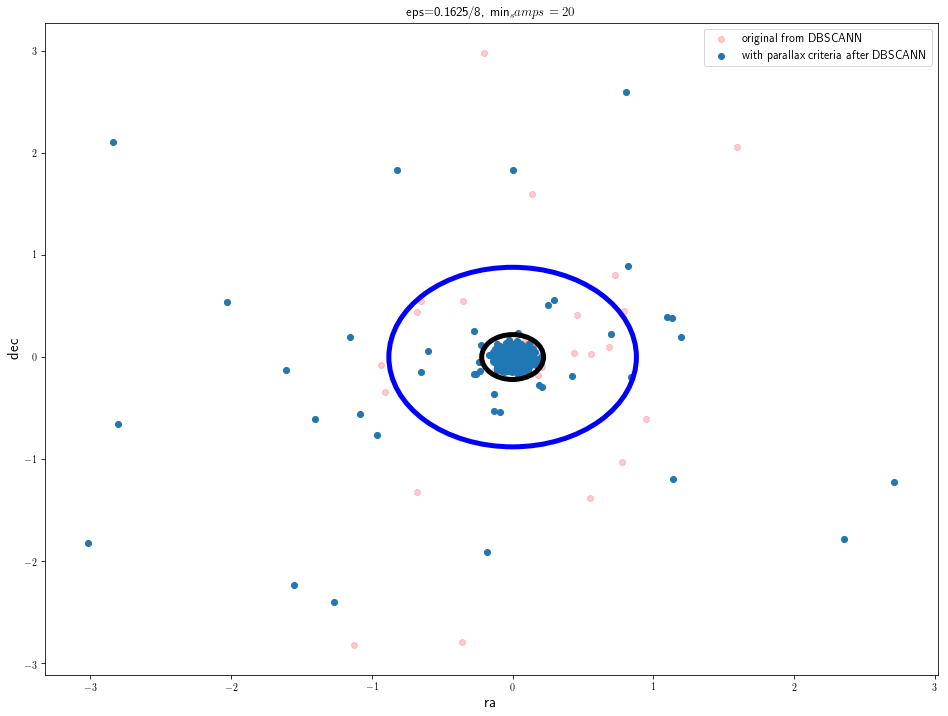

In [17]:
# DBSCANN - parallax after scan

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M/5, 'rpbp': GlobClust_Log_rpbp/2.5, 'pmra': GlobClust_Log_pmra/20, 'pmdec': GlobClust_Log_pmdec/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/8, min_samples=20, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)

GC_parallax = GlobClust_Log_parallax_out.reindex(y_out3.index)
GC_parallaxerror = GlobClust_Log_parallaxerror_out.reindex(y_out3.index)
GC_parallaxe = GlobClust_Log_parallaxe_out.reindex(y_out3.index)

GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out
GC_parallaxover = GlobClust_Log_parallaxover_out.reindex(y_out3.index)

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx=((1/GC_parallax<5.)*(GC_parallaxover<0.10))
parallax_indx=[not i for i in parallax_indx]

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='r', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), label='with parallax criteria after DBSCANN' )
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/8, min_samps=20')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-2.06364771 -2.04005089 -2.03425977 ..., -0.70398724 -0.69500968
 -0.48504977]
[-10.58521696 -10.5181684  -10.49164697 ...,  -9.3565923   -9.30750325
  -9.25816354]
[-0.72692813 -0.71838416 -0.71730552 ...,  0.66864305  0.66907218
  0.77671268]
[-0.60870035 -0.59740922 -0.59629676 ...,  0.64954854  0.65215214
  0.66939528]


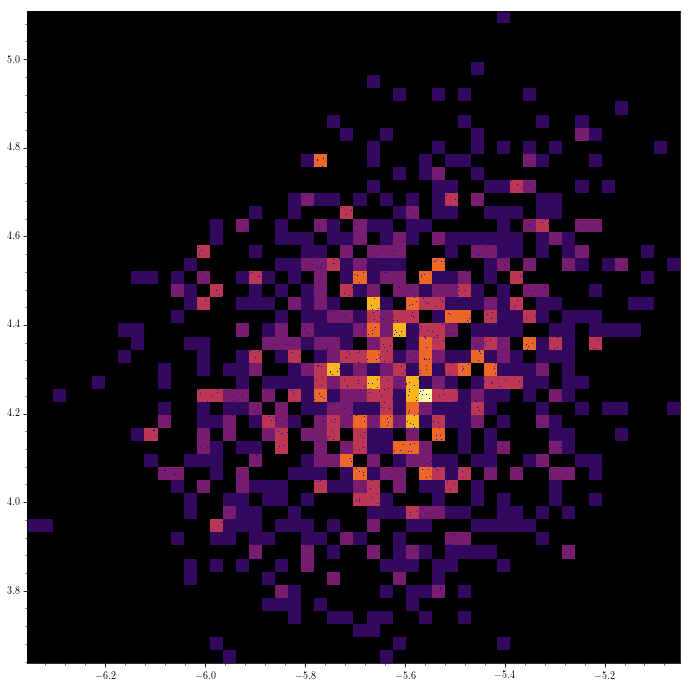

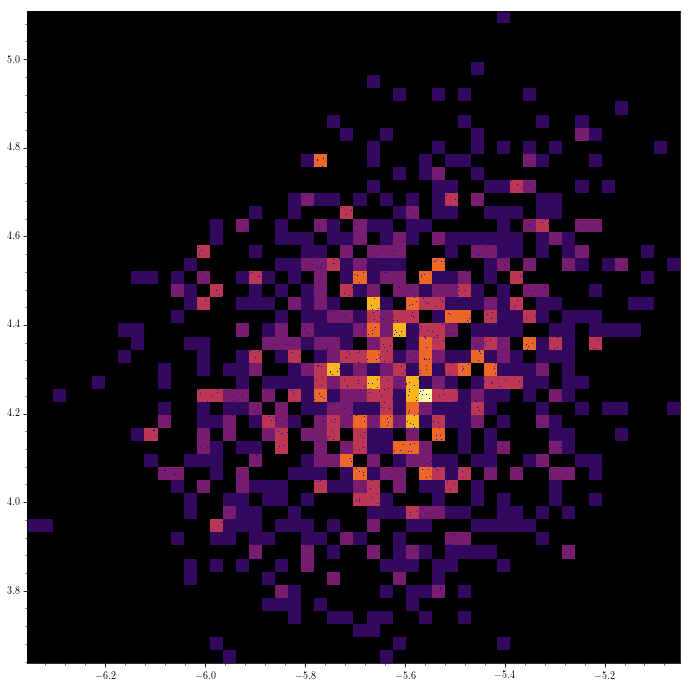

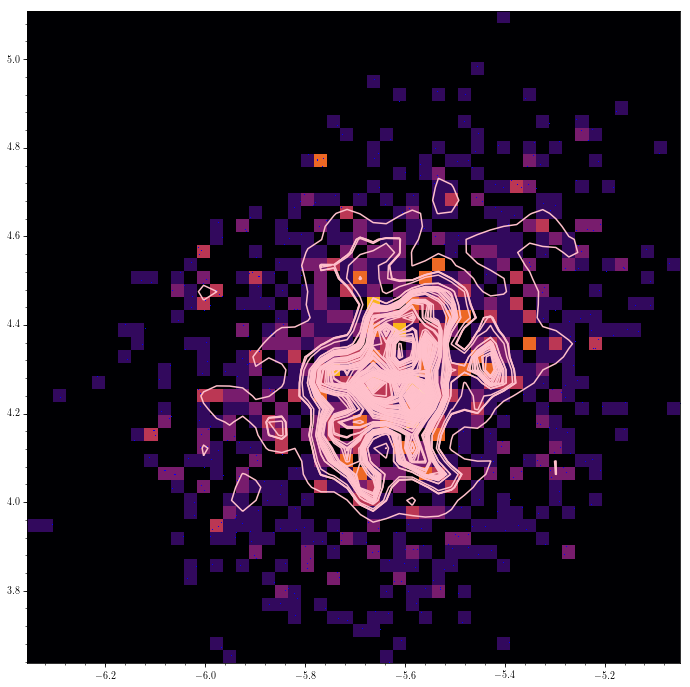

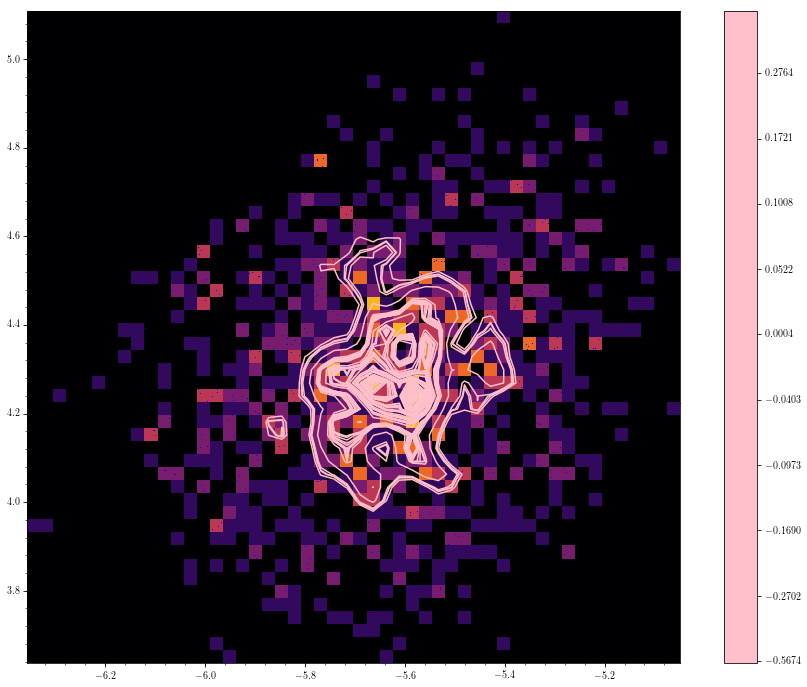

[-2.06364771 -2.04005089 -2.03425977 ..., -0.70398724 -0.69500968
 -0.48504977]
[-10.58521696 -10.5181684  -10.49164697 ...,  -9.3565923   -9.30750325
  -9.25816354]
[-0.72692813 -0.71838416 -0.71730552 ...,  0.66864305  0.66907218
  0.77671268]
[-0.60870035 -0.59740922 -0.59629676 ...,  0.64954854  0.65215214
  0.66939528]


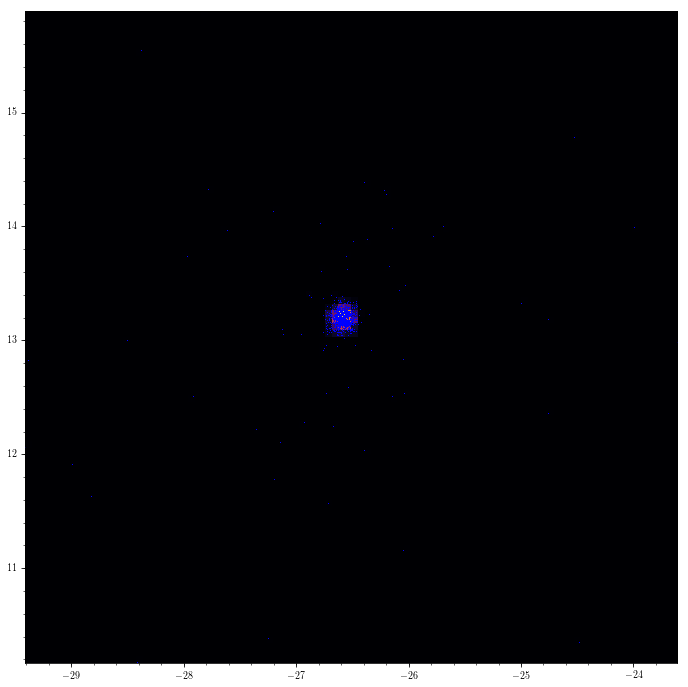

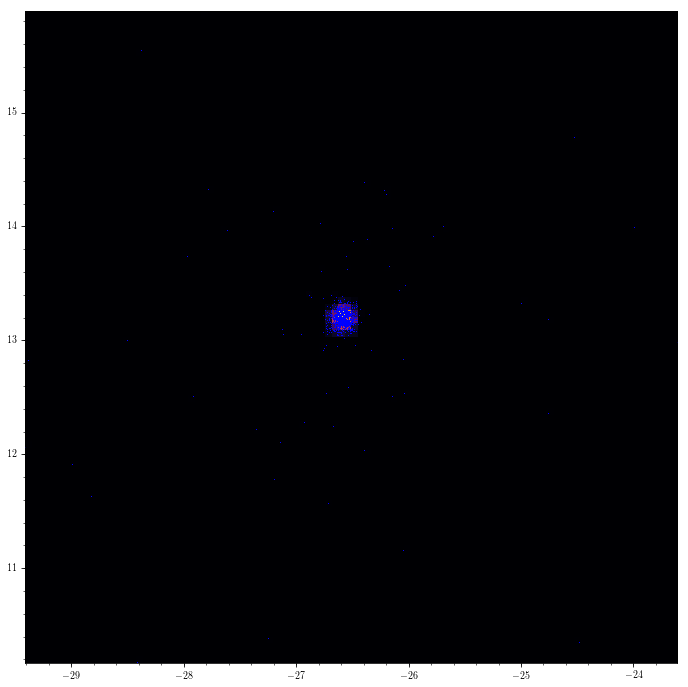

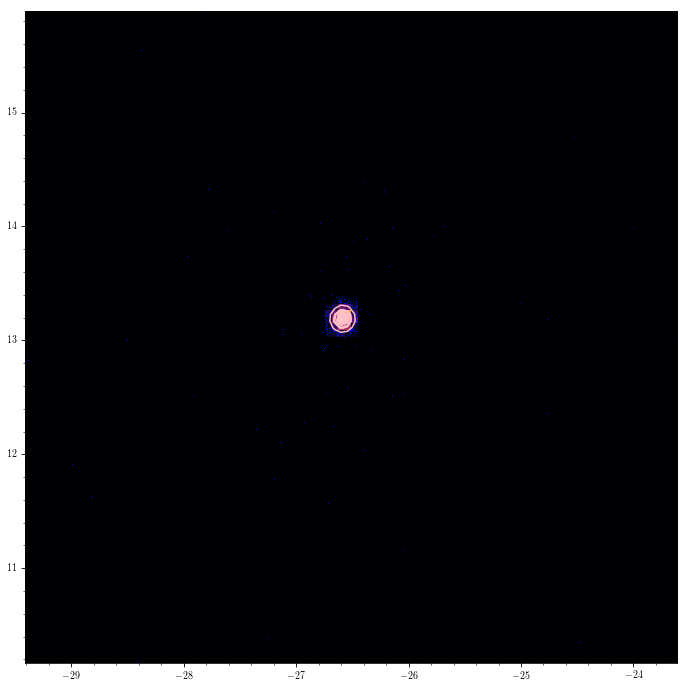

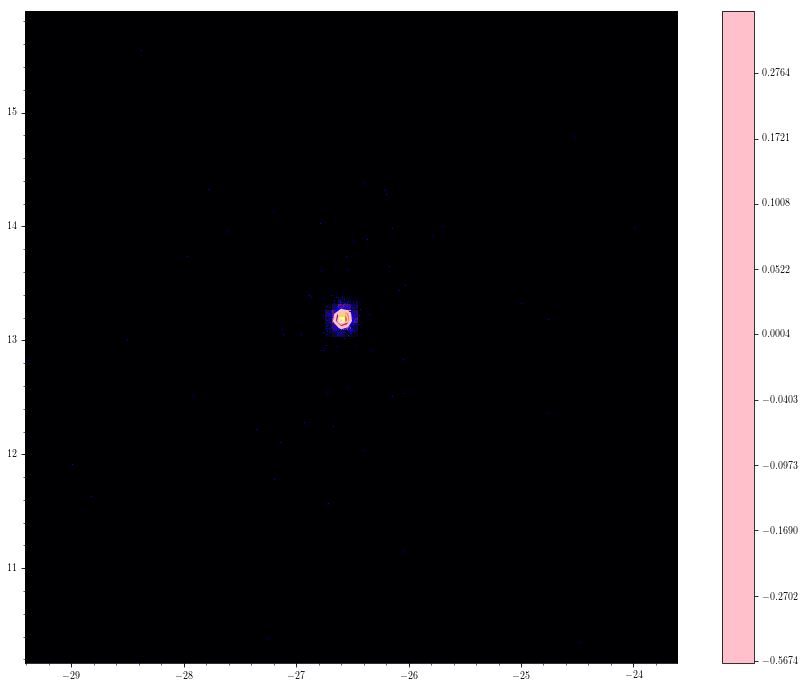

In [18]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

#df=pd.DataFrame(pmra_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmra=df.append(pmra_DB).append(df)

#df=pd.DataFrame(pmdec_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmdec=df.append(pmdec_DB).append(df)

#df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB.join(pmdec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB.join(dec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(59203, 4)
[-1 -1 -1 ..., -1 -1 -1]
(59203,)
Estimated number of Subgroups: 10


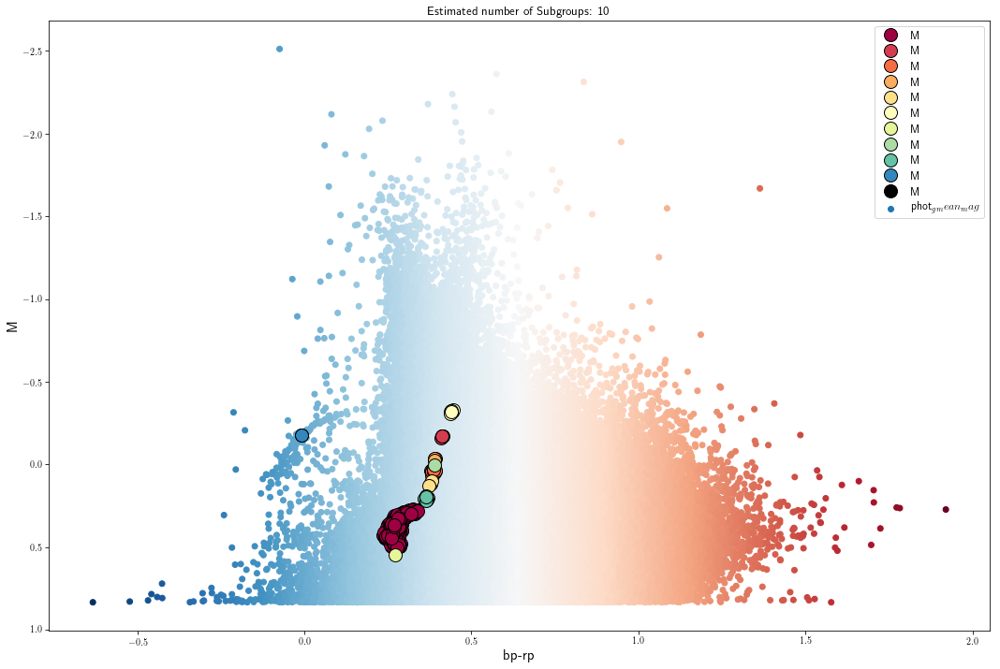

(470, 1)
(0, 0)


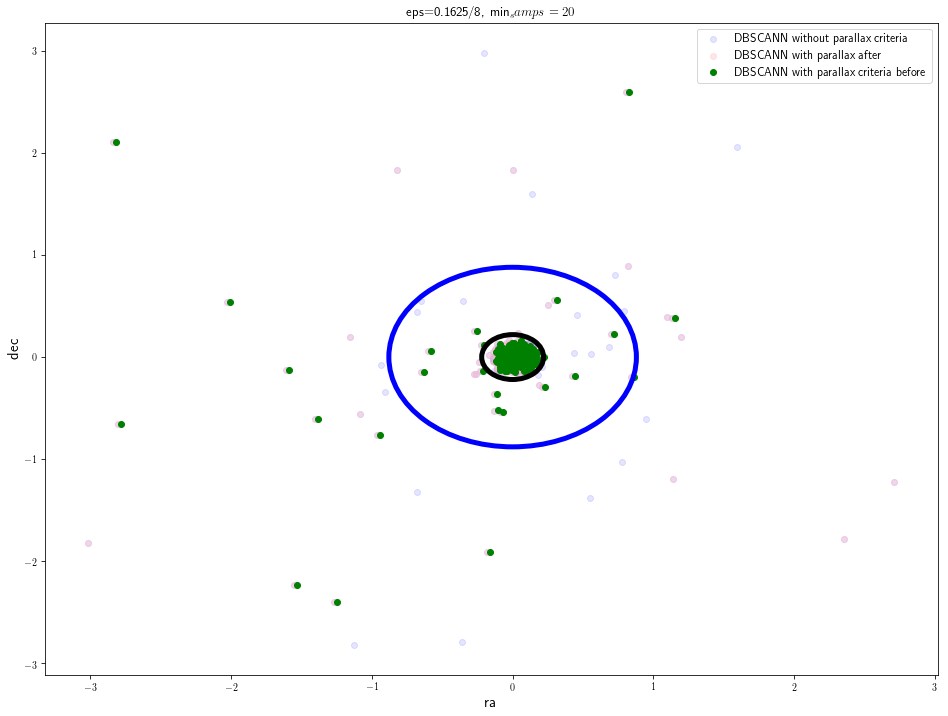

In [19]:
# DBSCANN - parallax before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx2=((1/GlobClust_Log_parallax_out<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx2=[not i for i in parallax_indx2]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M[parallax_indx2]/5, 'rpbp': GlobClust_Log_rpbp[parallax_indx2]/2.5,\
    'pmra': GlobClust_Log_pmra[parallax_indx2]/20, 'pmdec': GlobClust_Log_pmdec[parallax_indx2]/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/8, min_samples=20, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB2 = GC_ra.reindex(x_out3.index)
dec_DB2 = GC_dec.reindex(y_out3.index)
pmra_DB2 = GC_pmra.reindex(x_out3.index)
pmdec_DB2 = GC_pmdec.reindex(y_out3.index)

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='b', alpha=0.1, label='DBSCANN without parallax criteria')
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), c='pink', alpha=0.4, label='DBSCANN with parallax after')
plt.scatter(ra_DB2-ra_DB2.mean(), dec_DB2-dec_DB2.mean(),  c='g', label='DBSCANN with parallax criteria before')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/8, min_samps=20')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

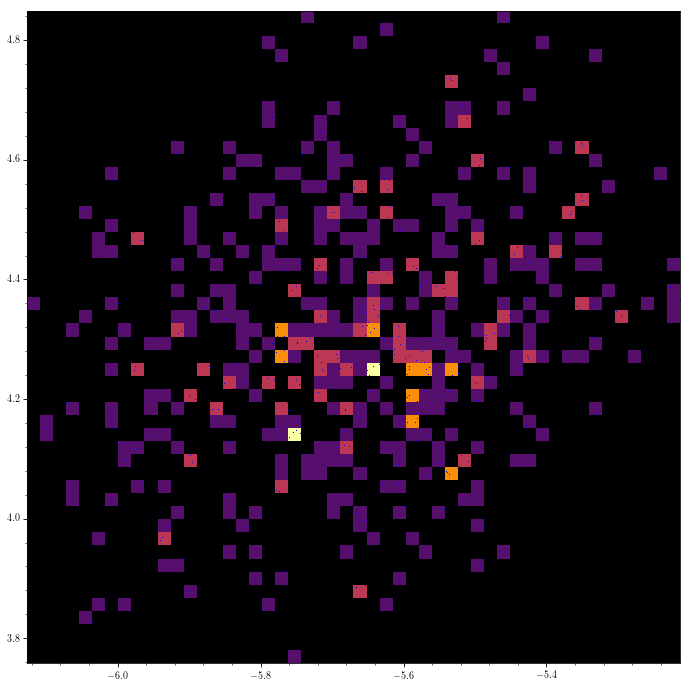

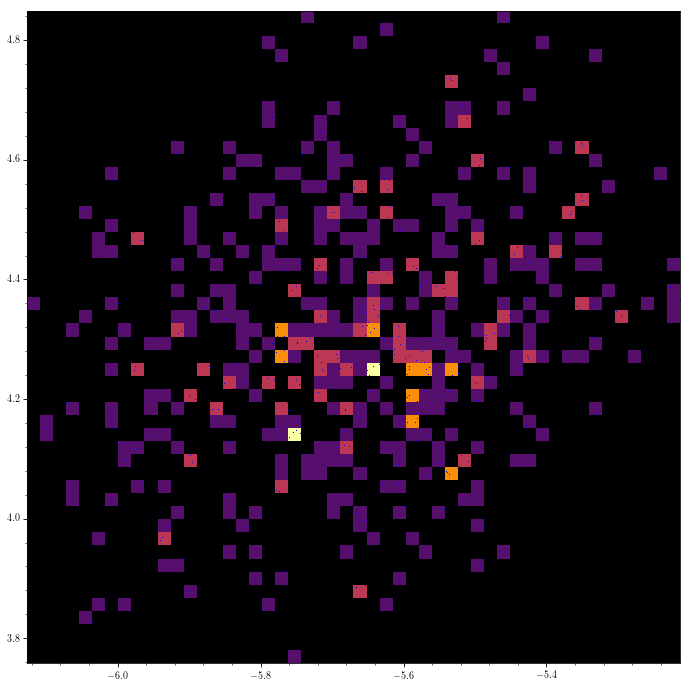

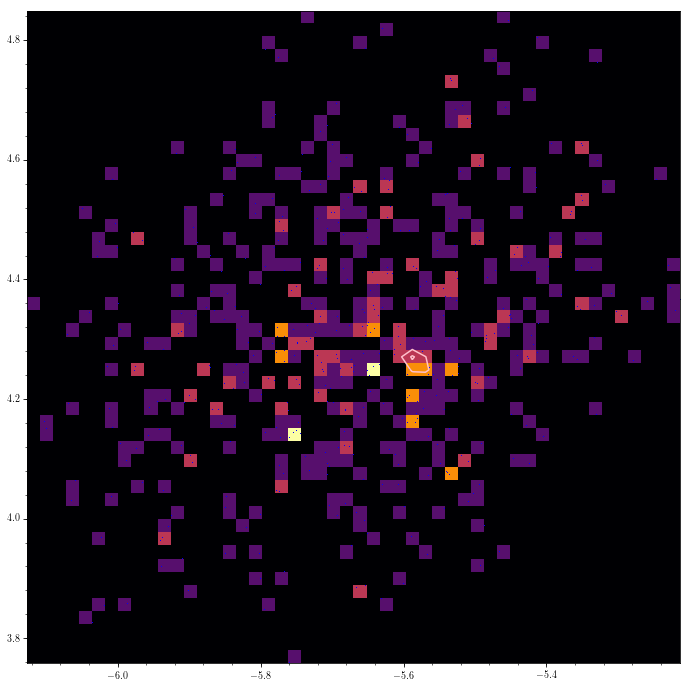

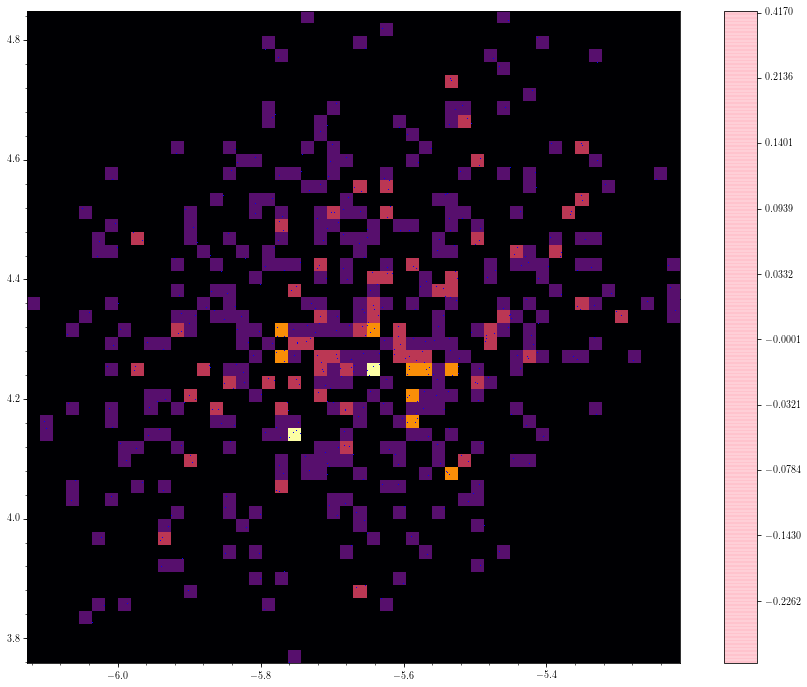

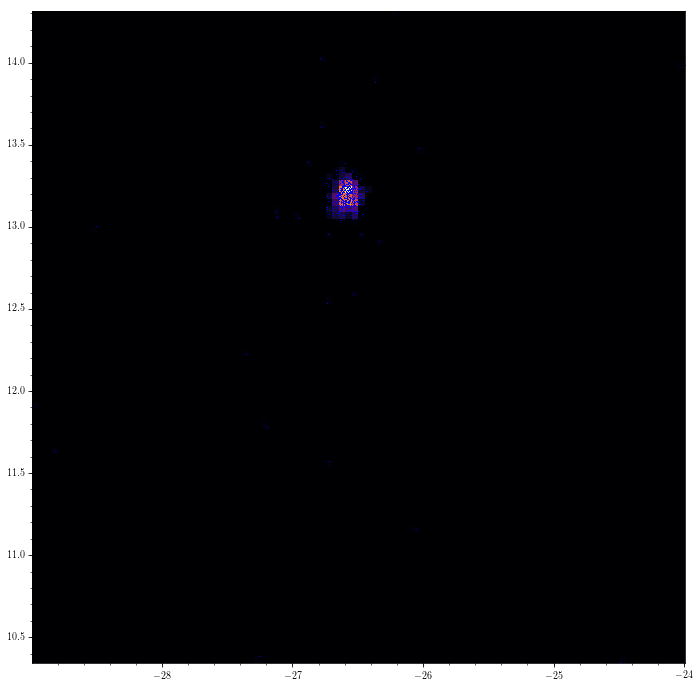

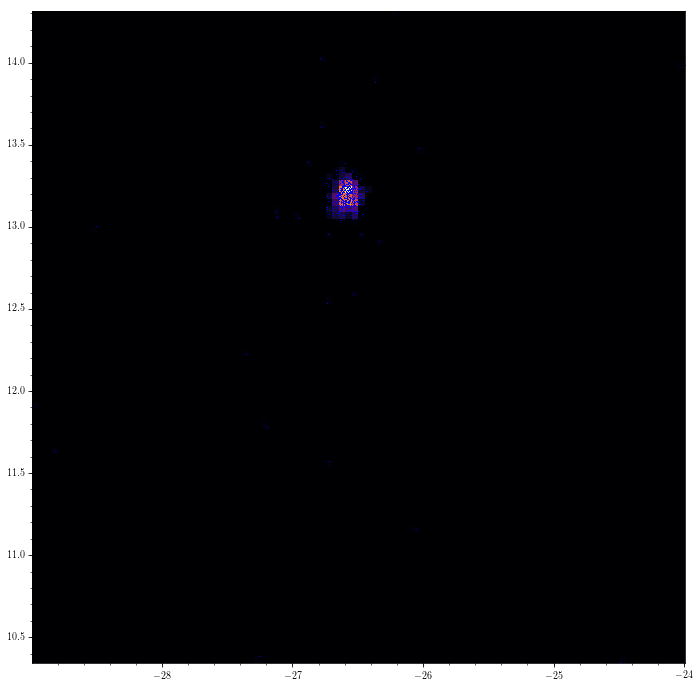

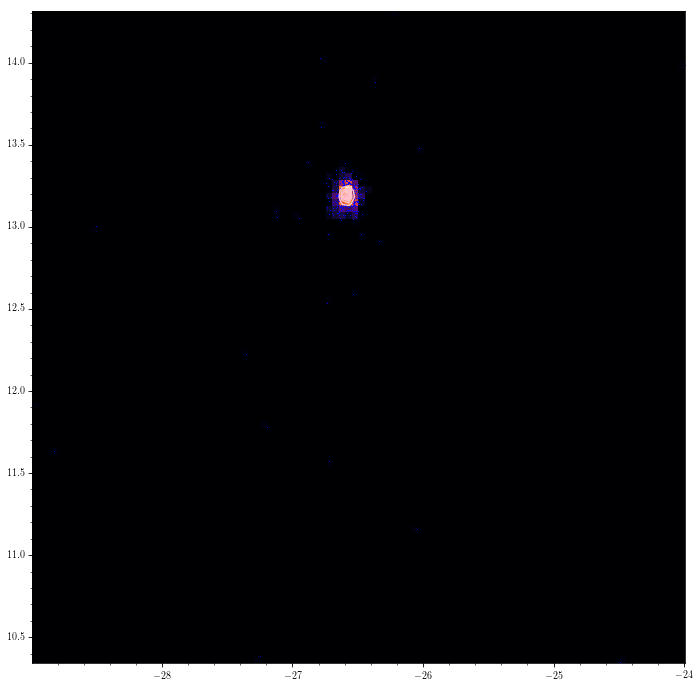

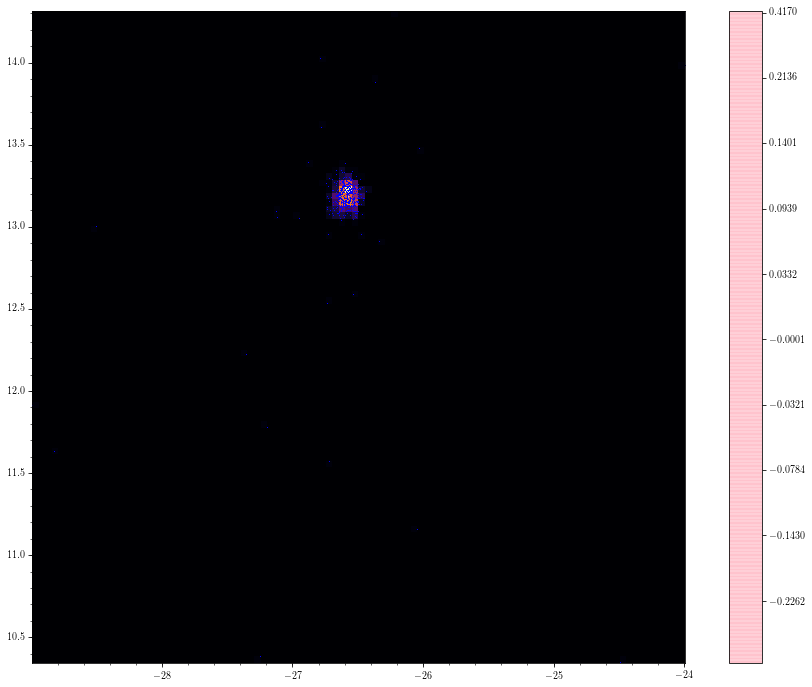

In [20]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

#df=pd.DataFrame(pmra_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmra=df.append(pmra_DB).append(df)

#df=pd.DataFrame(pmdec_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmdec=df.append(pmdec_DB).append(df)

#df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB2.join(pmdec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
#print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
#print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
#print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
#print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB2.join(dec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
#print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
#print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
#print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(94729, 4)
[-1 -1 -1 ..., -1 -1 -1]
(94729,)
Estimated number of Subgroups: 12


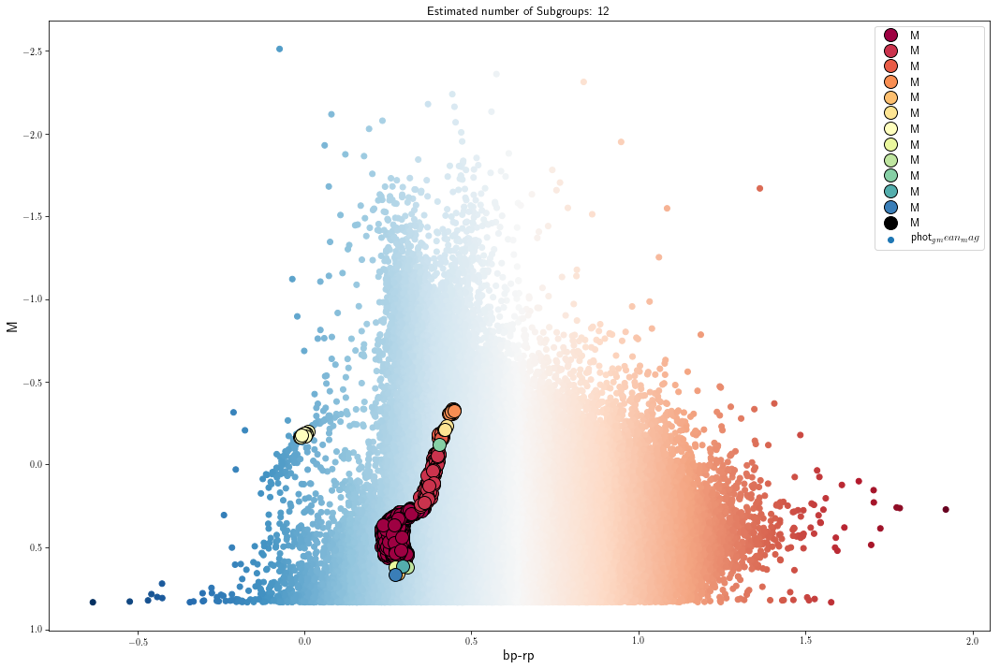

(1586, 1)
(0, 0)
/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



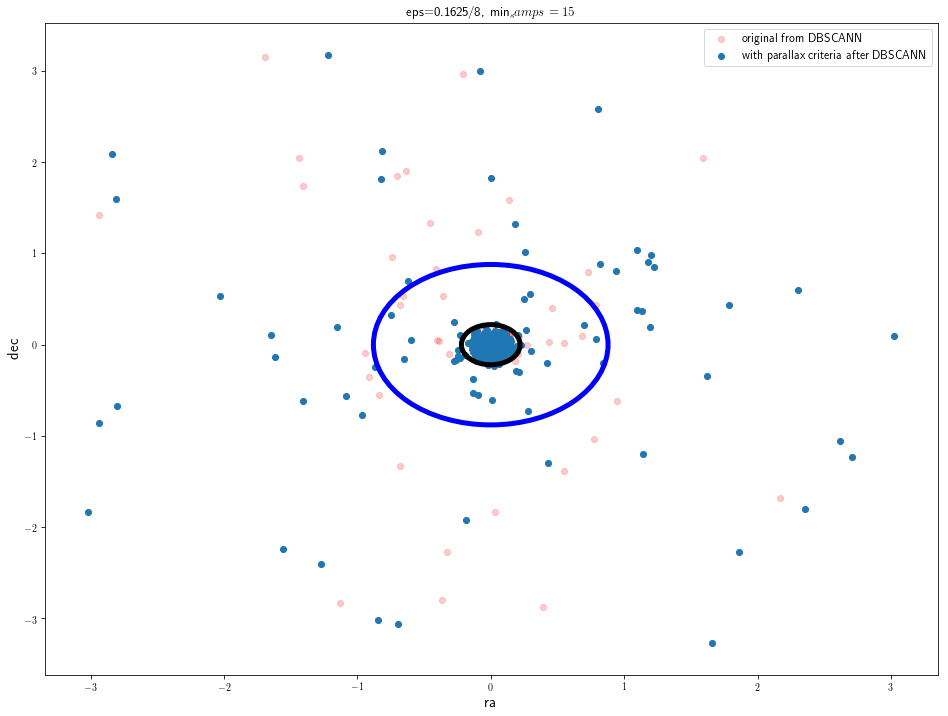

In [21]:
# DBSCANN - parallax after scan

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M/5, 'rpbp': GlobClust_Log_rpbp/2.5, 'pmra': GlobClust_Log_pmra/20, 'pmdec': GlobClust_Log_pmdec/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/8, min_samples=15, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)

GC_parallax = GlobClust_Log_parallax_out.reindex(y_out3.index)
GC_parallaxerror = GlobClust_Log_parallaxerror_out.reindex(y_out3.index)
GC_parallaxe = GlobClust_Log_parallaxe_out.reindex(y_out3.index)

GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out
GC_parallaxover = GlobClust_Log_parallaxover_out.reindex(y_out3.index)

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx=((1/GC_parallax<5.)*(GC_parallaxover<0.10))
parallax_indx=[not i for i in parallax_indx]

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='r', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), label='with parallax criteria after DBSCANN' )
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/8, min_samps=15')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-2.33810496 -2.25330346 -2.24375548 ..., -0.46053834 -0.35543955
 -0.27560896]
[-10.62956268 -10.62426177 -10.61283937 ...,  -9.17024674  -9.12464256
  -9.10909162]
[-0.87494632 -0.83961019 -0.82024043 ...,  0.91055241  0.98812589
  1.11318181]
[-0.79973556 -0.7509352  -0.73629539 ...,  0.72807251  0.72847725
  0.83963983]


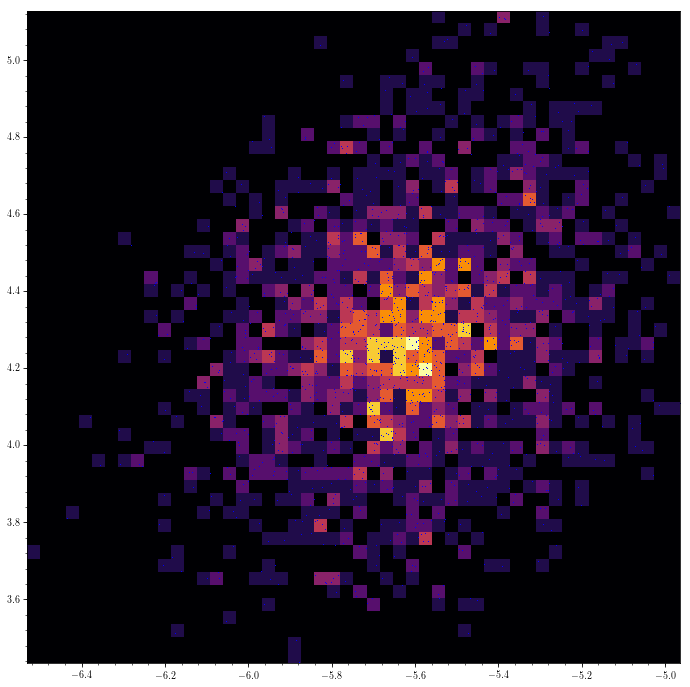

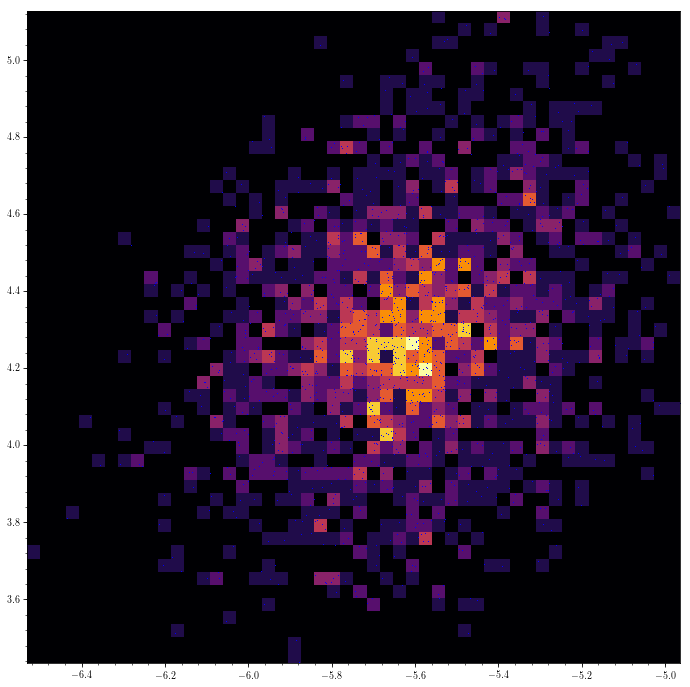

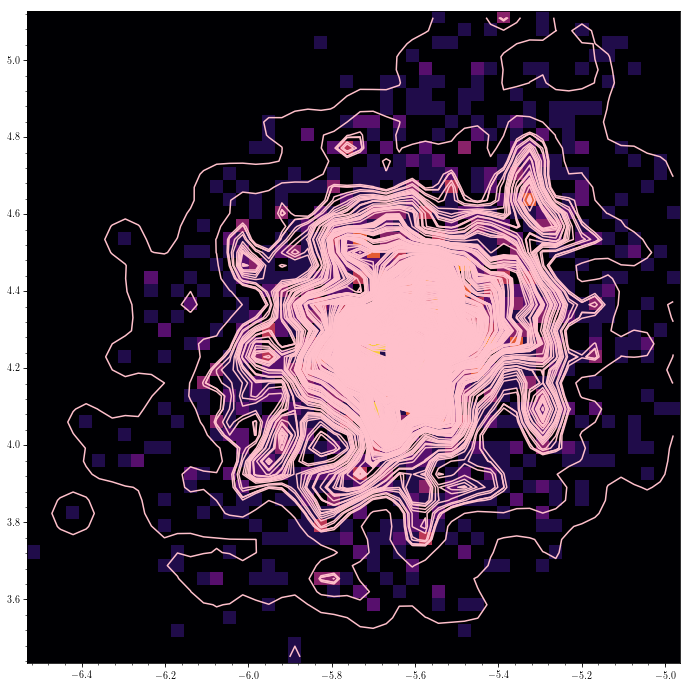

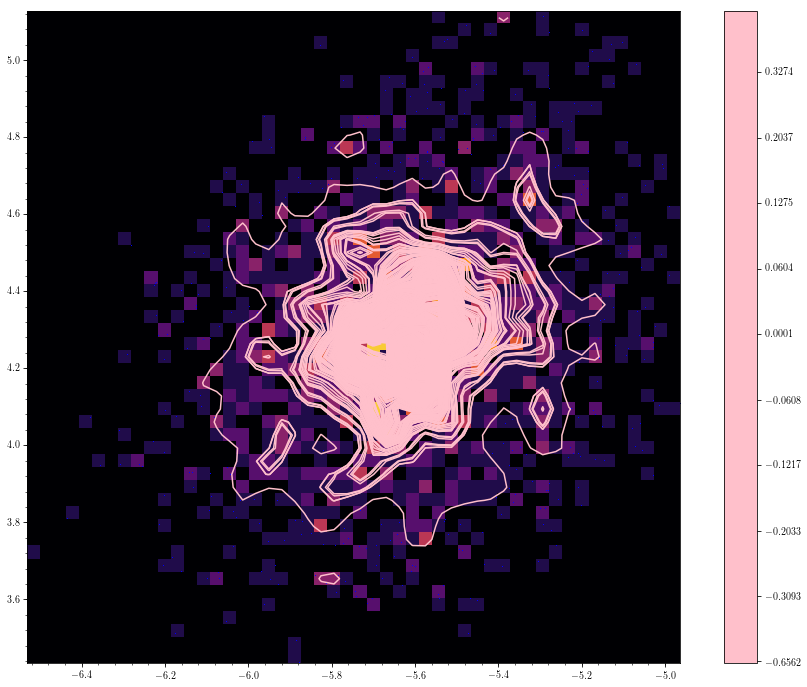

[-2.33810496 -2.25330346 -2.24375548 ..., -0.46053834 -0.35543955
 -0.27560896]
[-10.62956268 -10.62426177 -10.61283937 ...,  -9.17024674  -9.12464256
  -9.10909162]
[-0.87494632 -0.83961019 -0.82024043 ...,  0.91055241  0.98812589
  1.11318181]
[-0.79973556 -0.7509352  -0.73629539 ...,  0.72807251  0.72847725
  0.83963983]


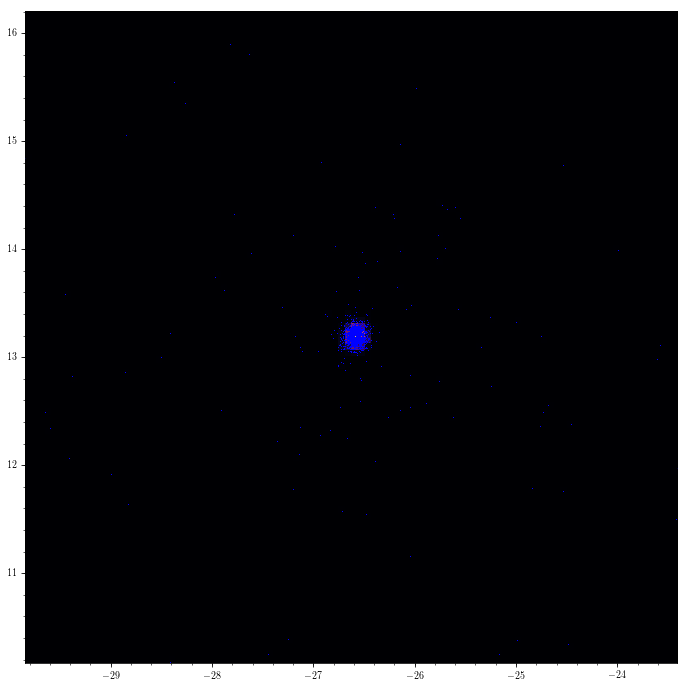

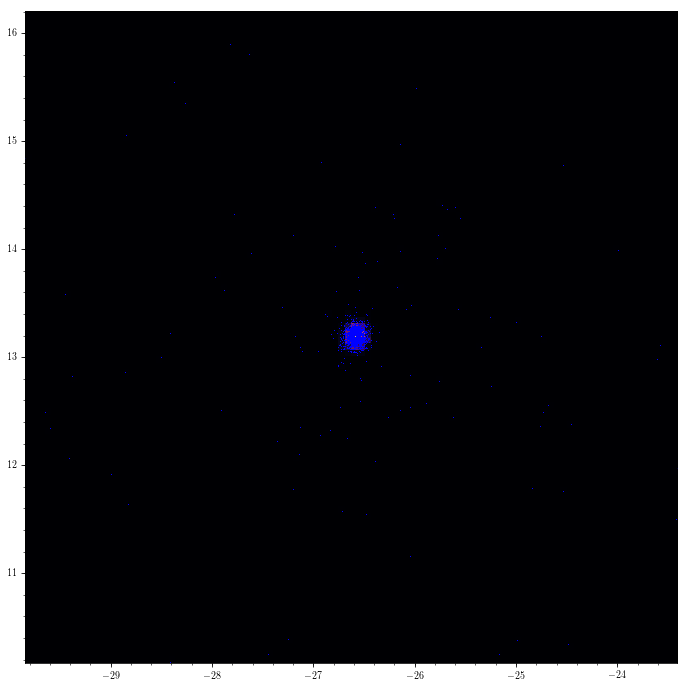

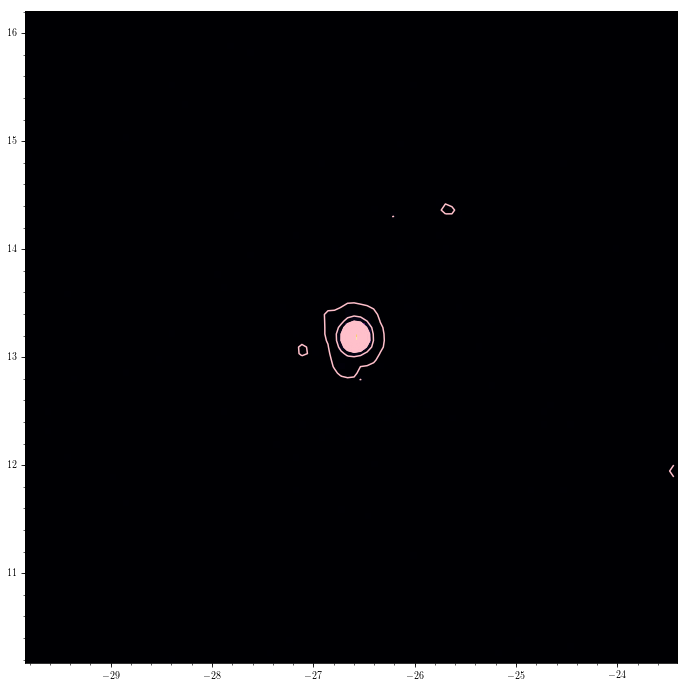

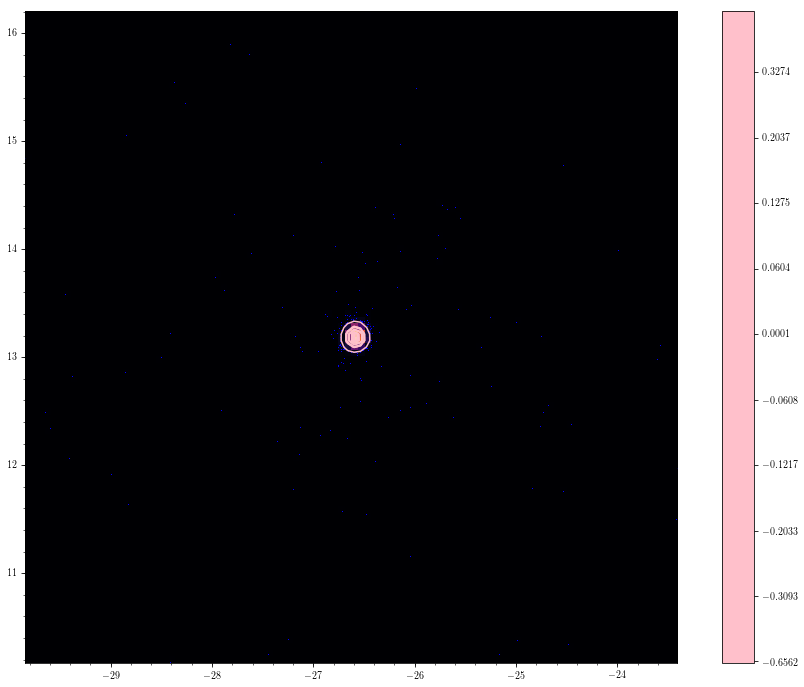

In [22]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

#df=pd.DataFrame(pmra_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmra=df.append(pmra_DB).append(df)

#df=pd.DataFrame(pmdec_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmdec=df.append(pmdec_DB).append(df)

#df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB.join(pmdec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB.join(dec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(59203, 4)
[-1 -1 -1 ..., -1 -1 -1]
(59203,)
Estimated number of Subgroups: 8


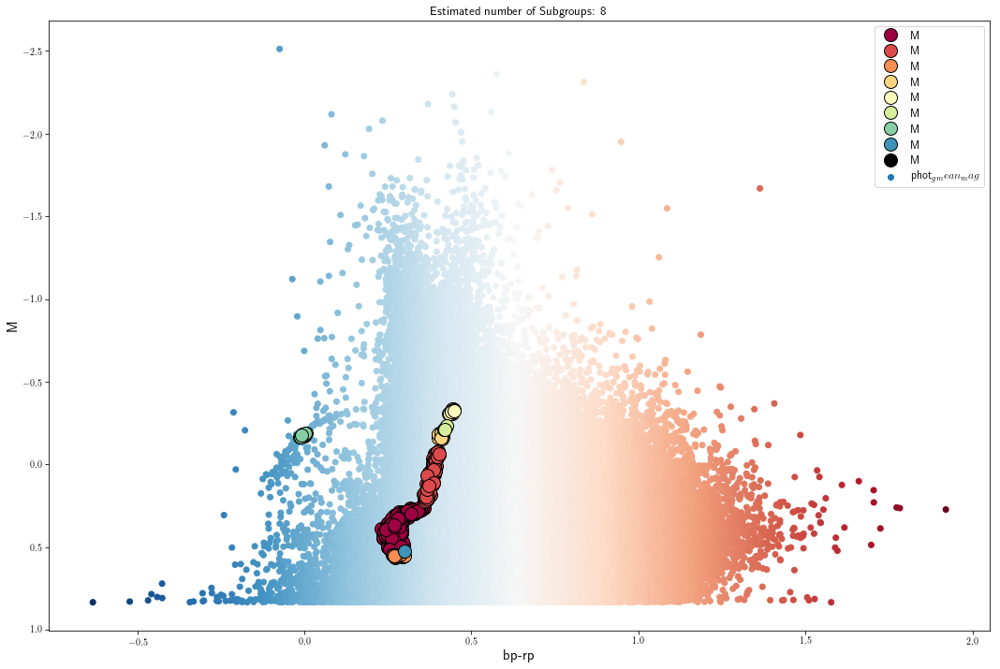

(804, 1)
(0, 0)


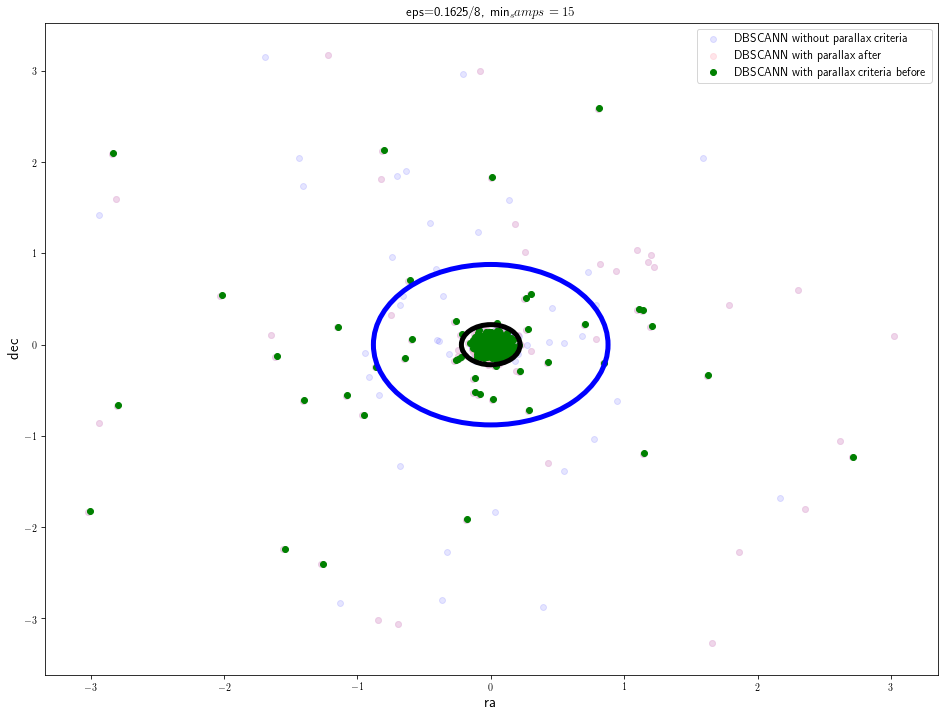

In [23]:
# DBSCANN - before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx2=((1/GlobClust_Log_parallax_out<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx2=[not i for i in parallax_indx2]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M[parallax_indx2]/5, 'rpbp': GlobClust_Log_rpbp[parallax_indx2]/2.5,\
    'pmra': GlobClust_Log_pmra[parallax_indx2]/20, 'pmdec': GlobClust_Log_pmdec[parallax_indx2]/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/8, min_samples=15, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB2 = GC_ra.reindex(x_out3.index)
dec_DB2 = GC_dec.reindex(y_out3.index)
pmra_DB2 = GC_pmra.reindex(x_out3.index)
pmdec_DB2 = GC_pmdec.reindex(y_out3.index)

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='b', alpha=0.1, label='DBSCANN without parallax criteria')
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), c='pink', alpha=0.4, label='DBSCANN with parallax after')
plt.scatter(ra_DB2-ra_DB2.mean(), dec_DB2-dec_DB2.mean(),  c='g', label='DBSCANN with parallax criteria before')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/8, min_samps=15')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

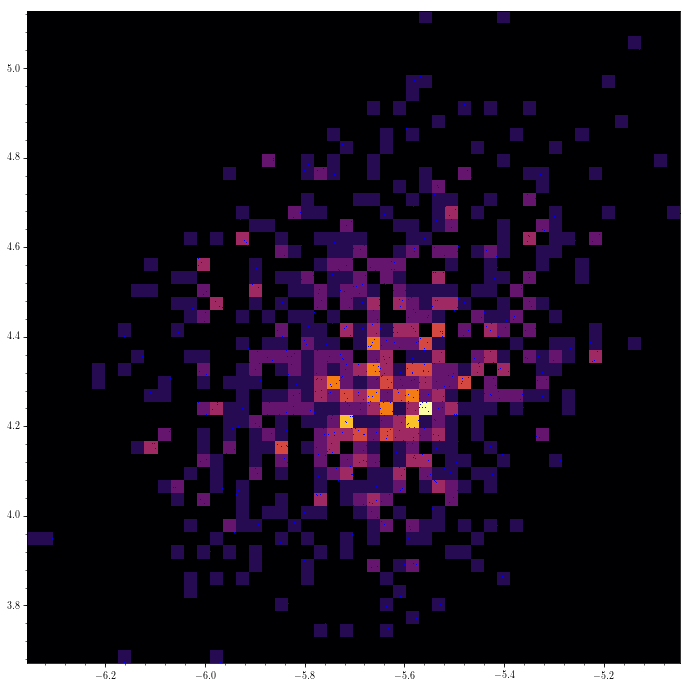

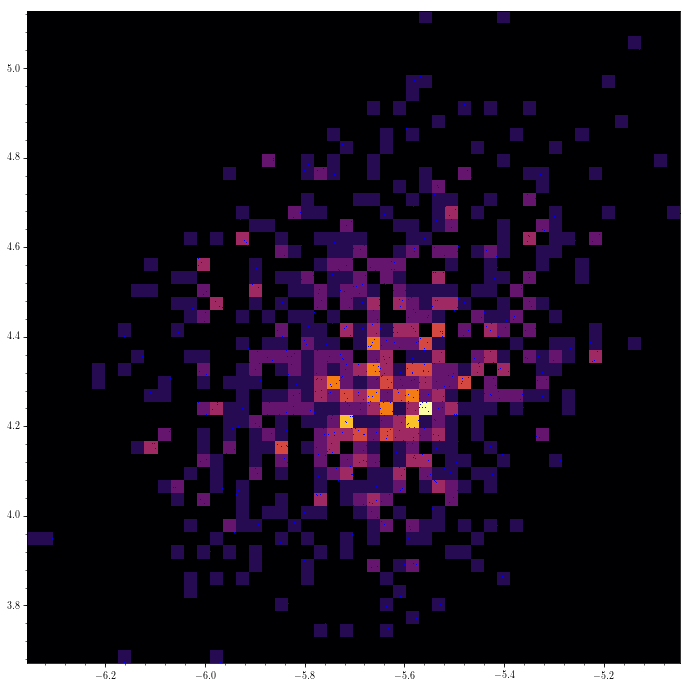

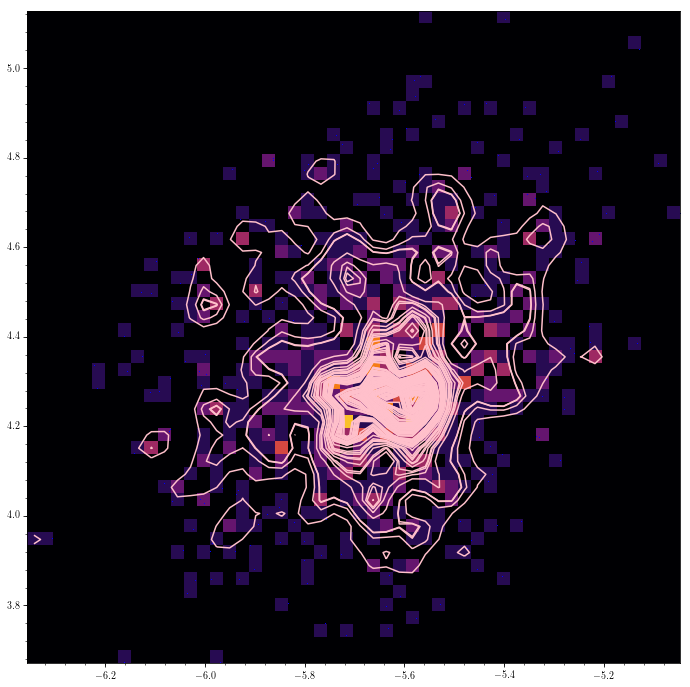

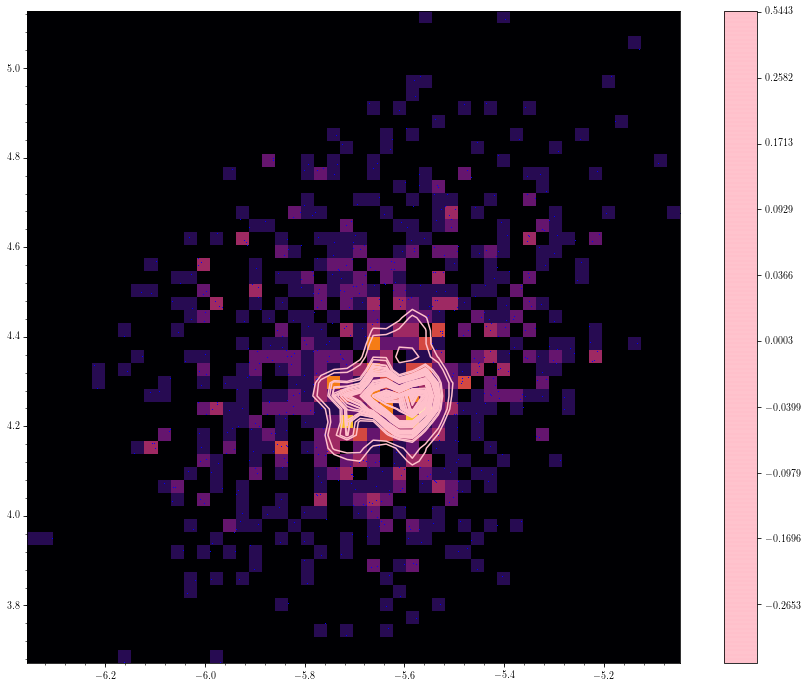

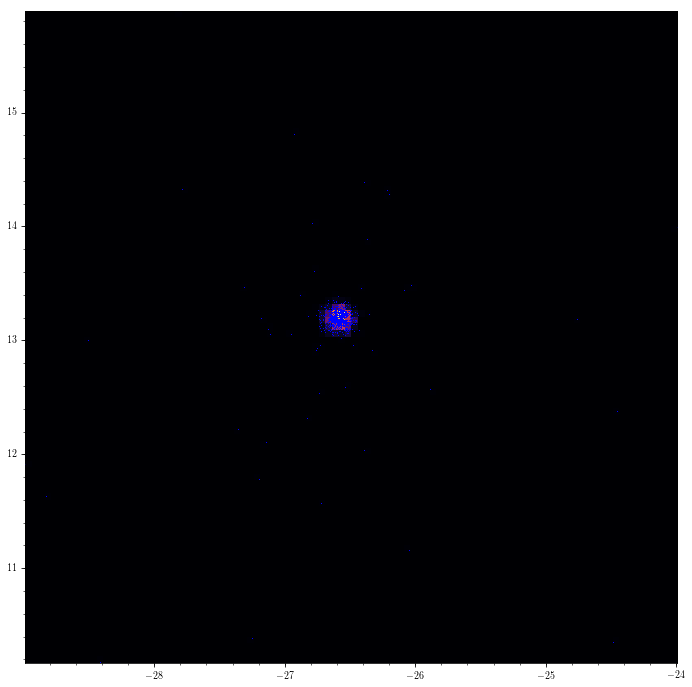

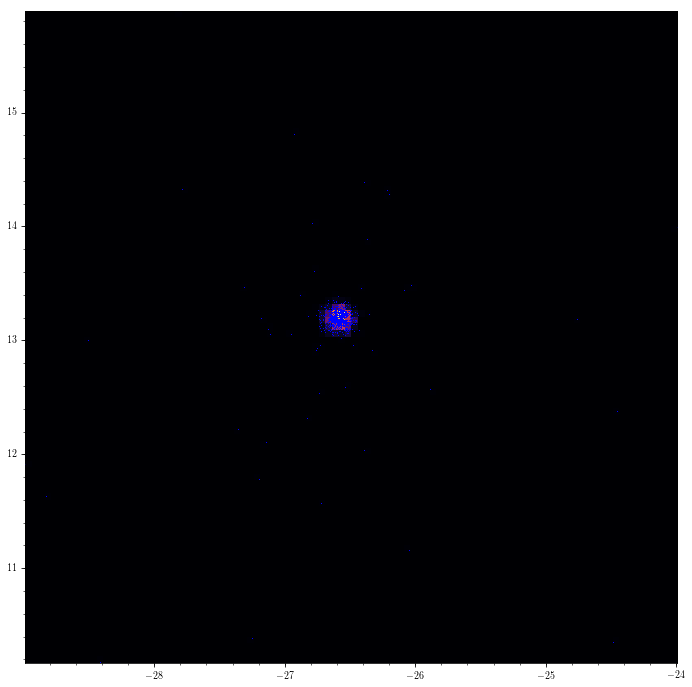

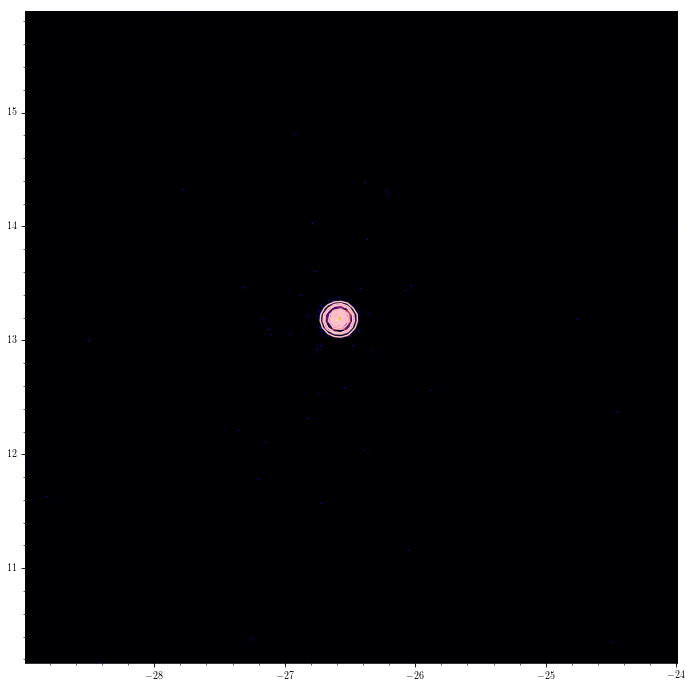

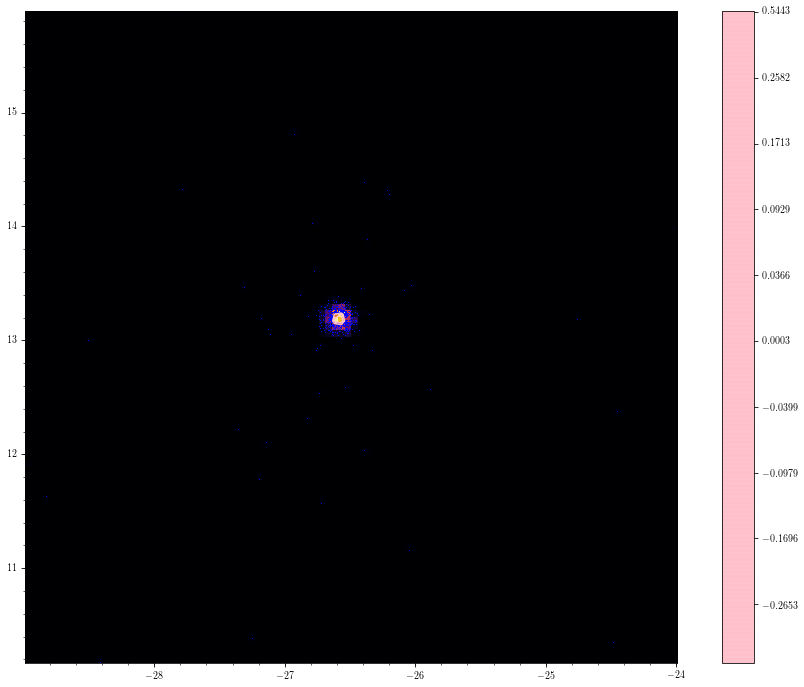

In [24]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

#df=pd.DataFrame(pmra_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmra=df.append(pmra_DB).append(df)

#df=pd.DataFrame(pmdec_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmdec=df.append(pmdec_DB).append(df)

#df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB2.join(pmdec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
#print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
#print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
#print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
#print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB2.join(dec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
#print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
#print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
#print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(94729, 4)
[-1 -1 -1 ..., -1 -1 -1]
(94729,)
Estimated number of Subgroups: 10


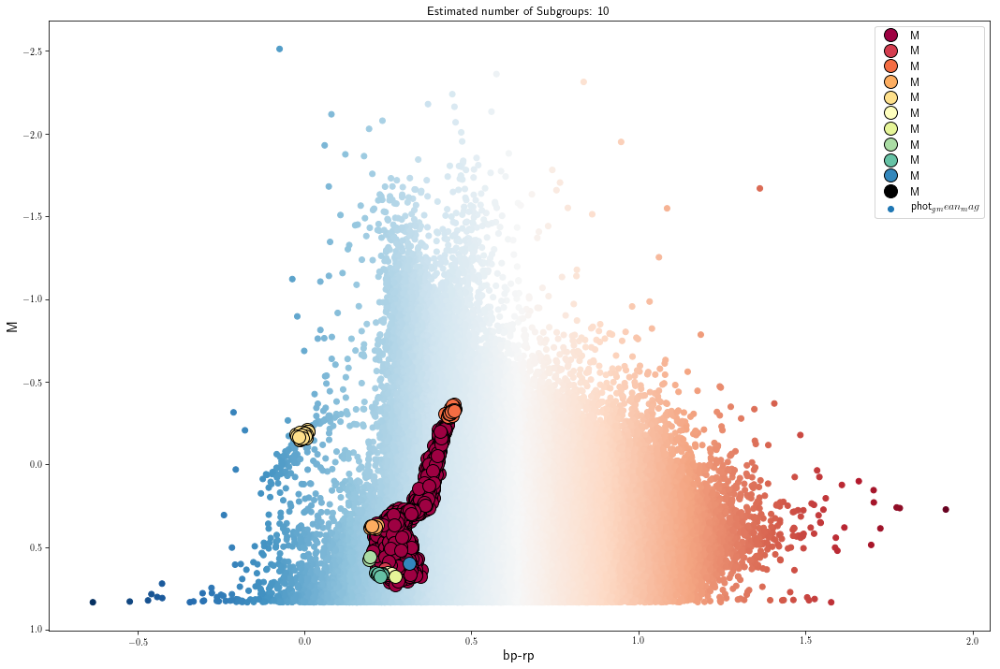

(3736, 1)
(0, 0)
/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



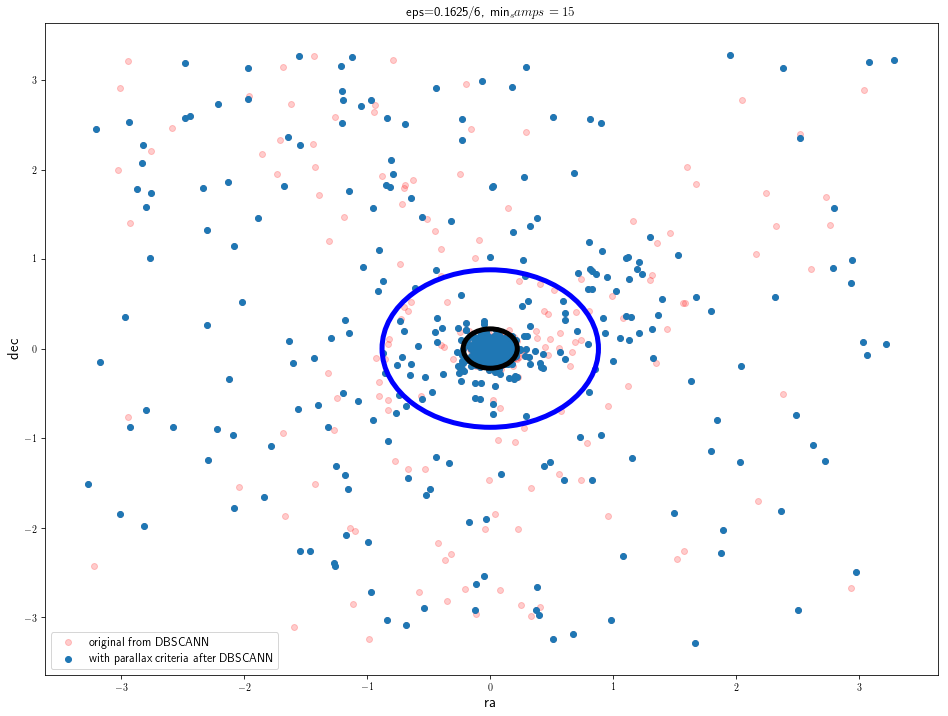

In [25]:
# DBSCANN - parallax after scan

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M/5, 'rpbp': GlobClust_Log_rpbp/2.5, 'pmra': GlobClust_Log_pmra/20, 'pmdec': GlobClust_Log_pmdec/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/6, min_samples=15, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)

GC_parallax = GlobClust_Log_parallax_out.reindex(y_out3.index)
GC_parallaxerror = GlobClust_Log_parallaxerror_out.reindex(y_out3.index)
GC_parallaxe = GlobClust_Log_parallaxe_out.reindex(y_out3.index)

GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out
GC_parallaxover = GlobClust_Log_parallaxover_out.reindex(y_out3.index)

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx=((1/GC_parallax<5.)*(GC_parallaxover<0.10))
parallax_indx=[not i for i in parallax_indx]

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='r', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), label='with parallax criteria after DBSCANN' )
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/6, min_samps=15')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-2.95008144 -2.845647   -2.84325218 ...,  0.2178703   0.29829794
  0.49767496]
[-11.56512025 -11.3876283  -11.36895904 ...,  -4.62886962  -4.51235134
  -4.40700525]
[-1.71380214 -1.46767574 -1.46215267 ...,  1.46040436  1.51333562
  1.60345032]
[-4.76021565 -4.74525485 -4.69736274 ...,  5.15763701  5.35825389
  5.35896009]


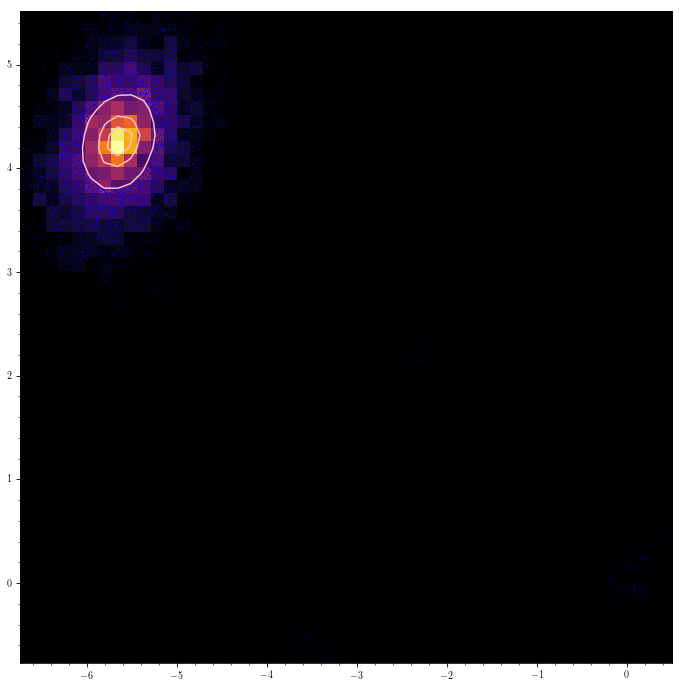

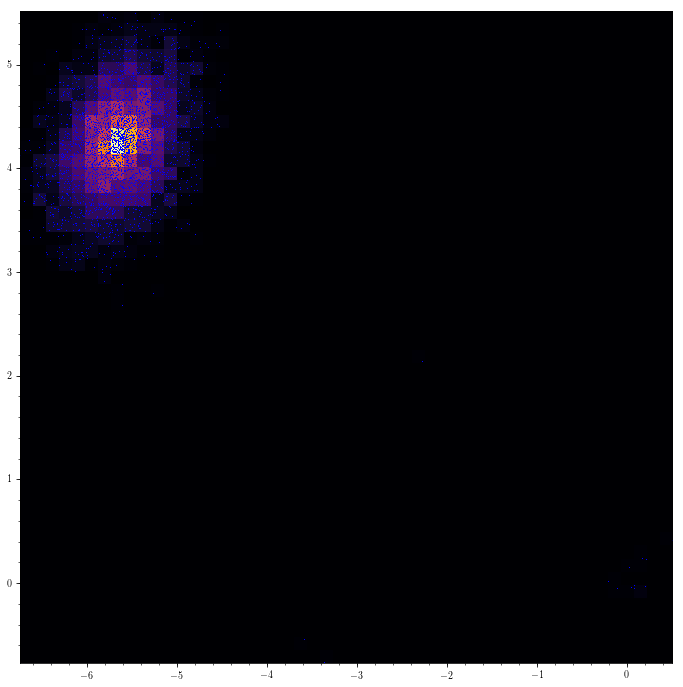

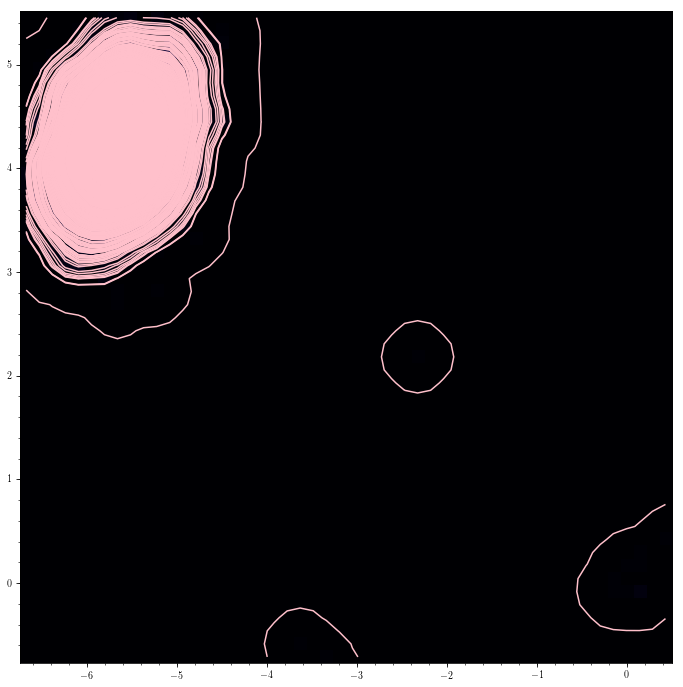

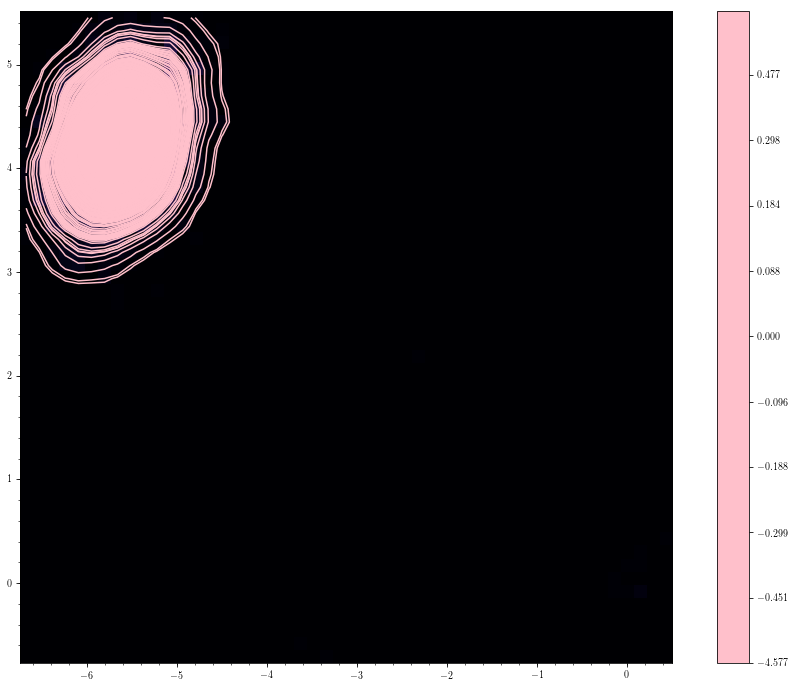

[-2.95008144 -2.845647   -2.84325218 ...,  0.2178703   0.29829794
  0.49767496]
[-11.56512025 -11.3876283  -11.36895904 ...,  -4.62886962  -4.51235134
  -4.40700525]
[-1.71380214 -1.46767574 -1.46215267 ...,  1.46040436  1.51333562
  1.60345032]
[-4.76021565 -4.74525485 -4.69736274 ...,  5.15763701  5.35825389
  5.35896009]


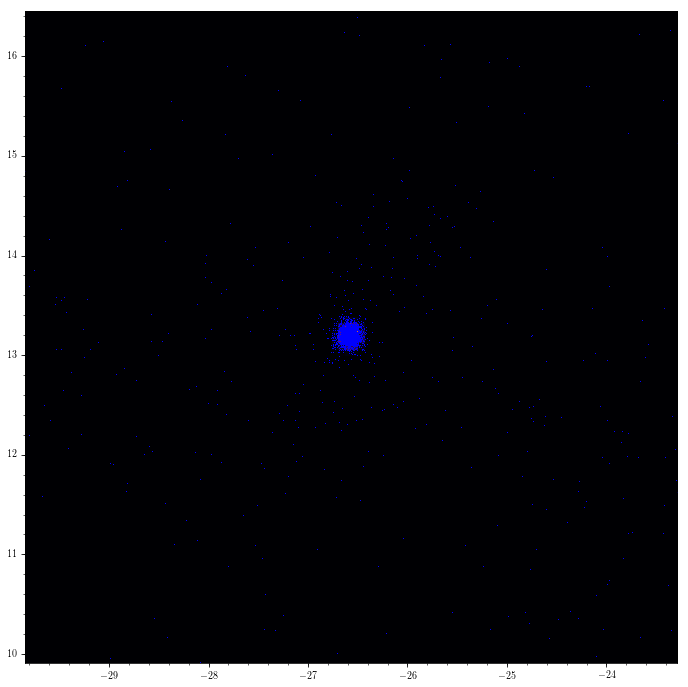

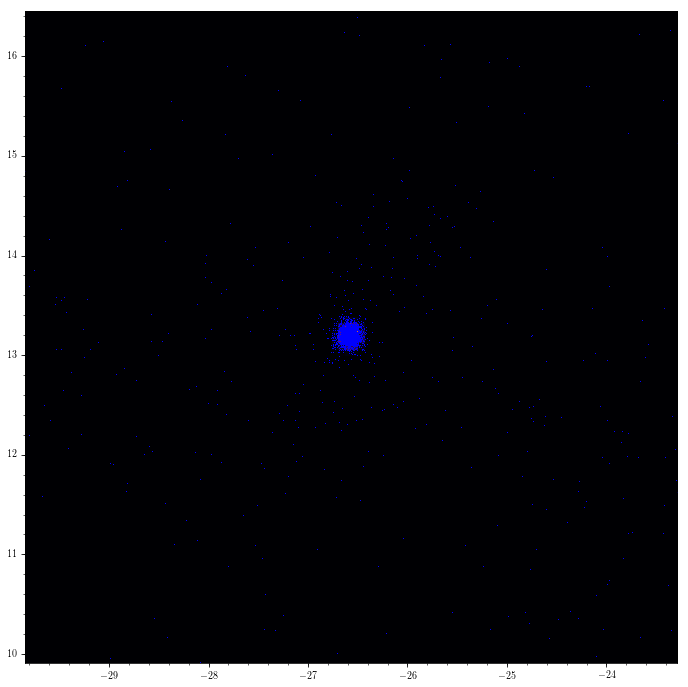

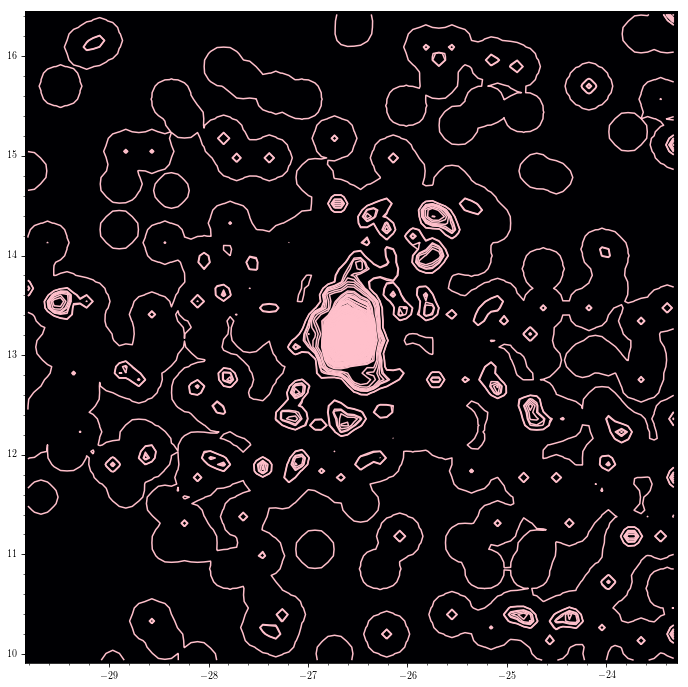

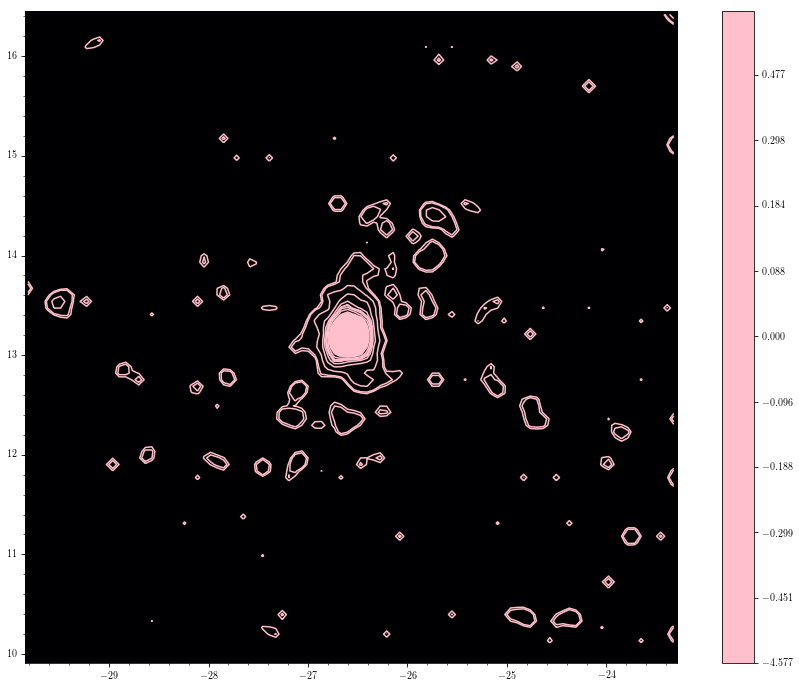

In [26]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

#df=pd.DataFrame(pmra_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmra=df.append(pmra_DB).append(df)

#df=pd.DataFrame(pmdec_DB.mean()).transpose()
#df=pd.concat([df]*992, ignore_index=True)
#df_pmdec=df.append(pmdec_DB).append(df)

#df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB.join(pmdec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB.join(dec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(59203, 4)
[-1 -1 -1 ..., -1 -1 -1]
(59203,)
Estimated number of Subgroups: 4


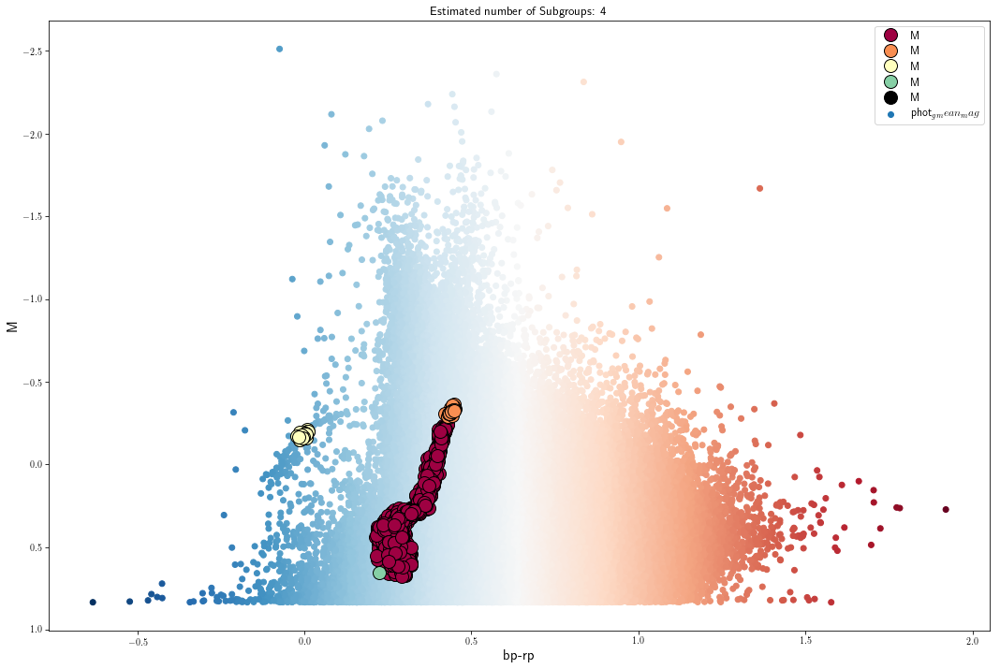

(2045, 1)
(0, 0)


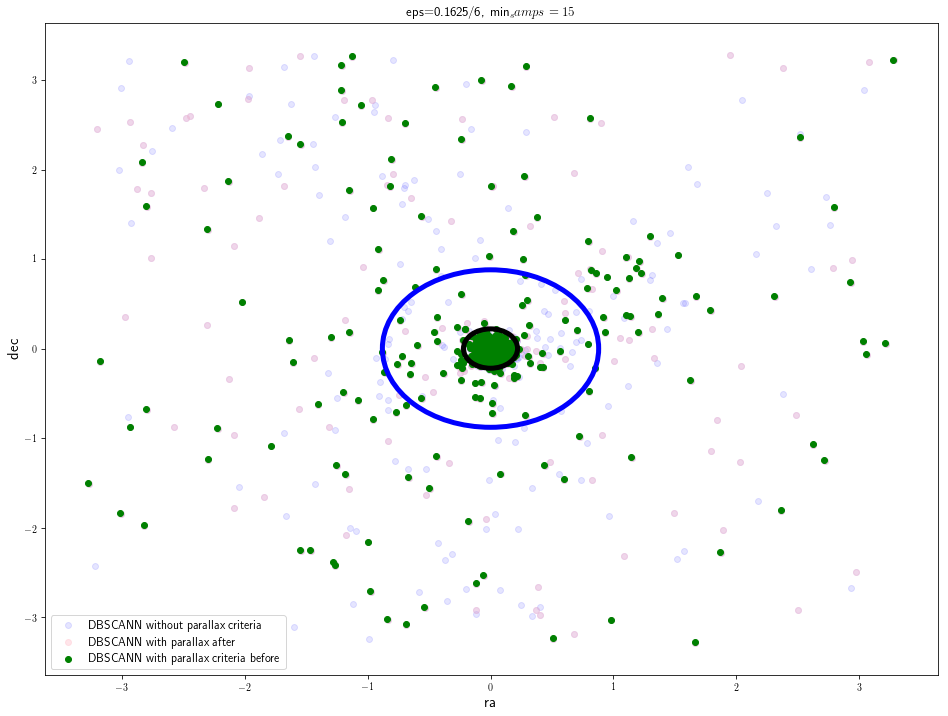

In [27]:
# DBSCANN - parallax before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx2=((1/GlobClust_Log_parallax_out<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx2=[not i for i in parallax_indx2]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M[parallax_indx2]/5, 'rpbp': GlobClust_Log_rpbp[parallax_indx2]/2.5,\
    'pmra': GlobClust_Log_pmra[parallax_indx2]/20, 'pmdec': GlobClust_Log_pmdec[parallax_indx2]/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/6, min_samples=15, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB2 = GC_ra.reindex(x_out3.index)
dec_DB2 = GC_dec.reindex(y_out3.index)
pmra_DB2 = GC_pmra.reindex(x_out3.index)
pmdec_DB2 = GC_pmdec.reindex(y_out3.index)

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='b', alpha=0.1, label='DBSCANN without parallax criteria')
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), c='pink', alpha=0.4, label='DBSCANN with parallax after')
plt.scatter(ra_DB2-ra_DB2.mean(), dec_DB2-dec_DB2.mean(),  c='g', label='DBSCANN with parallax criteria before')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/6, min_samps=15')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

In [111]:
shape(pmra_DB2)

(2045, 1)

[-2.95008144 -2.845647   -2.84325218 ...,  0.2178703   0.29829794
  0.49767496]
[-11.56512025 -11.3876283  -11.36895904 ...,  -4.62886962  -4.51235134
  -4.40700525]
[-1.71380214 -1.46767574 -1.46215267 ...,  1.46040436  1.51333562
  1.60345032]
[-4.76021565 -4.74525485 -4.69736274 ...,  5.15763701  5.35825389
  5.35896009]


ValueError: Contour levels must be increasing

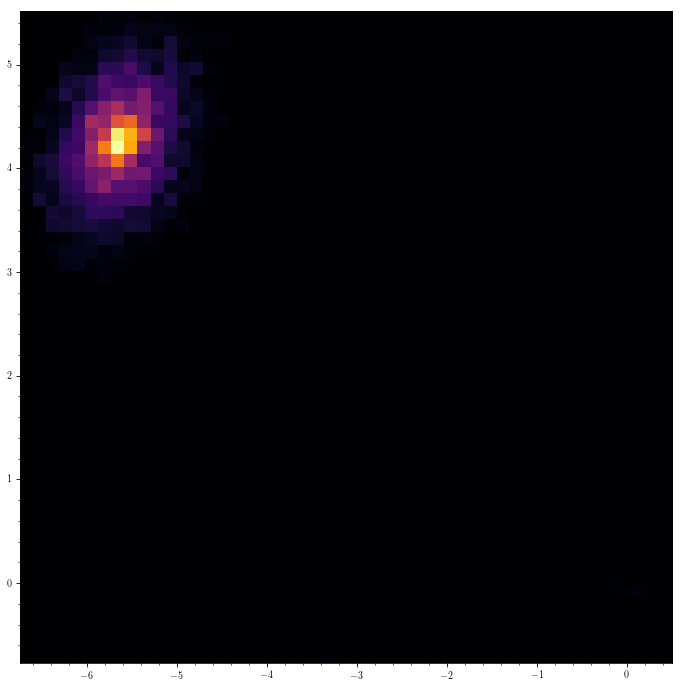

In [28]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

df=pd.DataFrame(pmra_DB.mean()).transpose()
df=pd.concat([df]*3, ignore_index=True)
df_pmra=df.append(pmra_DB).append(df)

df=pd.DataFrame(pmdec_DB.mean()).transpose()
df=pd.concat([df]*3, ignore_index=True)
df_pmdec=df.append(pmdec_DB).append(df)

df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

#pmra_DB2.append(pmra_DB2.mean(), ignore_index=True).append(pmra_DB2.mean(), ignore_index=True).append(pmra_DB2.mean(), ignore_index=True)
#pmdec_DB2.append(pmdec_DB2.mean(), ignore_index=True).append(pmdec_DB2.mean(), ignore_index=True).append(pmdec_DB2.mean(), ignore_index=True)

#pmradec=pmra_DB2.join(pmdec_DB2)

WT2 = pywt.swtn(df_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB2.join(dec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(94729, 4)
[-1 -1 -1 ..., -1 -1 -1]
(94729,)
Estimated number of Subgroups: 2


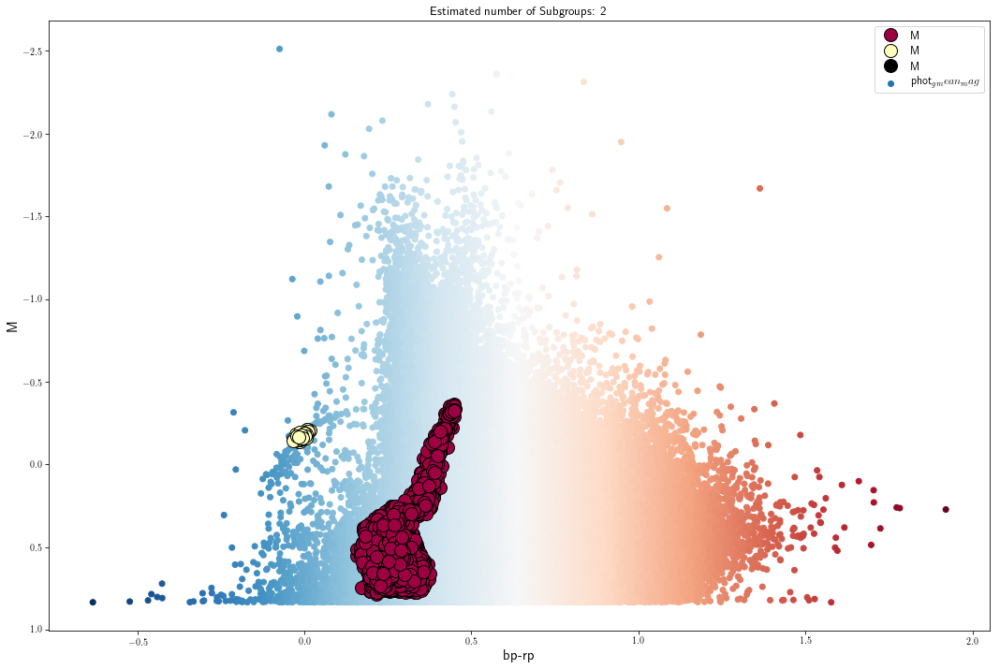

(7279, 1)
(0, 0)
/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



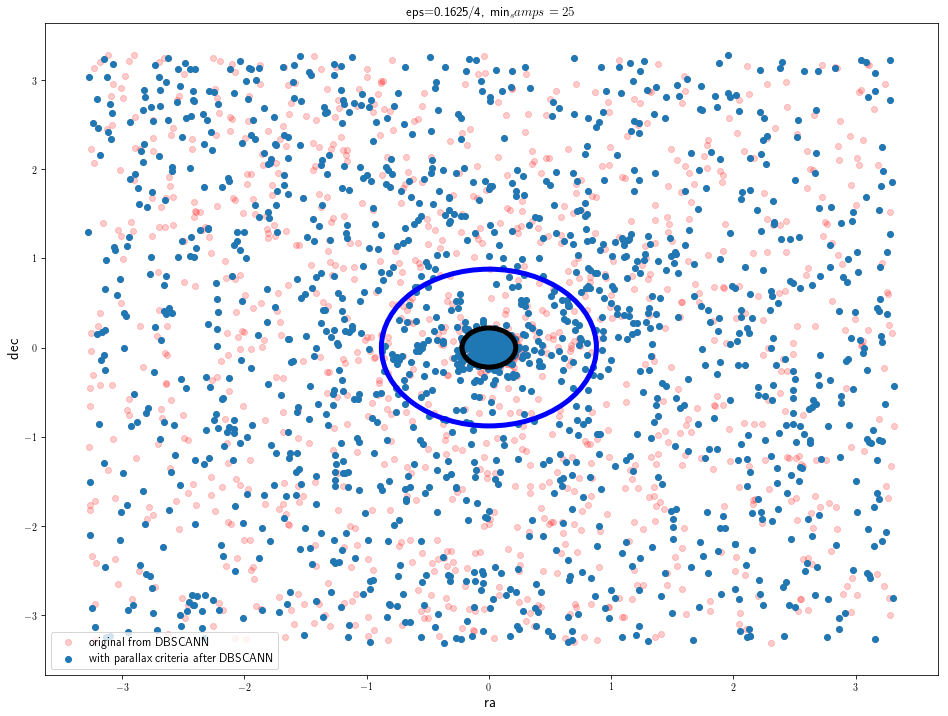

In [29]:
# DBSCANN - parallax after scan

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M/5, 'rpbp': GlobClust_Log_rpbp/2.5, 'pmra': GlobClust_Log_pmra/20, 'pmdec': GlobClust_Log_pmdec/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/4, min_samples=25, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)

GC_parallax = GlobClust_Log_parallax_out.reindex(y_out3.index)
GC_parallaxerror = GlobClust_Log_parallaxerror_out.reindex(y_out3.index)
GC_parallaxe = GlobClust_Log_parallaxe_out.reindex(y_out3.index)

GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out
GC_parallaxover = GlobClust_Log_parallaxover_out.reindex(y_out3.index)

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx=((1/GC_parallax<5.)*(GC_parallaxover<0.10))
parallax_indx=[not i for i in parallax_indx]

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='r', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), label='with parallax criteria after DBSCANN' )
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/4, min_samps=25')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-6.08121839 -5.91177808 -5.78349492 ...,  1.07400623  1.16452482
  1.42833021]
[-12.23046909 -12.2198274  -12.20514118 ...,   0.64143334   0.85856867
   1.23483367]
[-3.97774865 -3.66498587 -3.64424307 ...,  3.31383533  3.60539868
  3.80433546]
[-6.41943169 -6.40966854 -6.29042    ...,  6.82718559  6.91471418
  6.91877996]


ValueError: Contour levels must be increasing

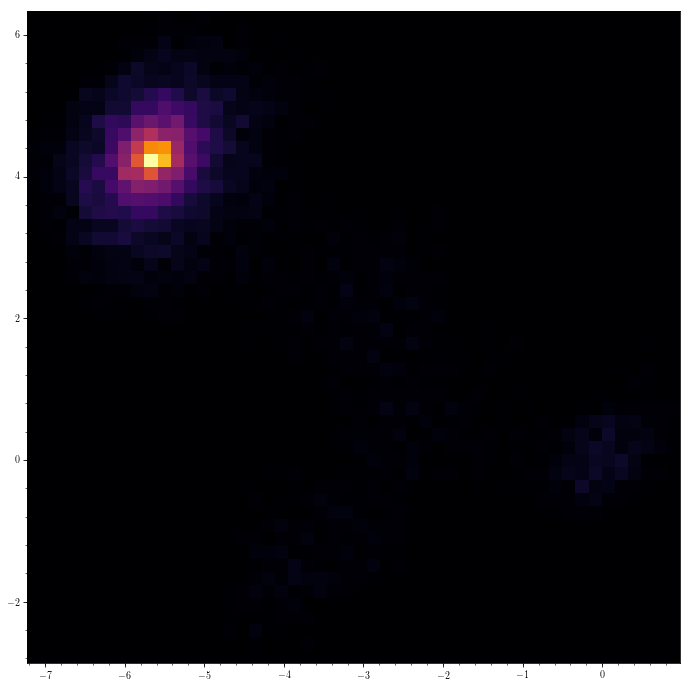

In [32]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

df=pd.DataFrame(pmra_DB.mean()).transpose()
df=pd.concat([df]*456, ignore_index=True)
df_pmra=df.append(pmra_DB).append(df).append(pmra_DB.mean(), ignore_index=True)

df=pd.DataFrame(pmdec_DB.mean()).transpose()
df=pd.concat([df]*456, ignore_index=True)
df_pmdec=df.append(pmdec_DB).append(df).append(pmdec_DB.mean(), ignore_index=True)

df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB.join(pmdec_DB)

WT2 = pywt.swtn(df_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB.join(dec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(59203, 4)
[-1 -1 -1 ...,  0 -1 -1]
(59203,)
Estimated number of Subgroups: 7


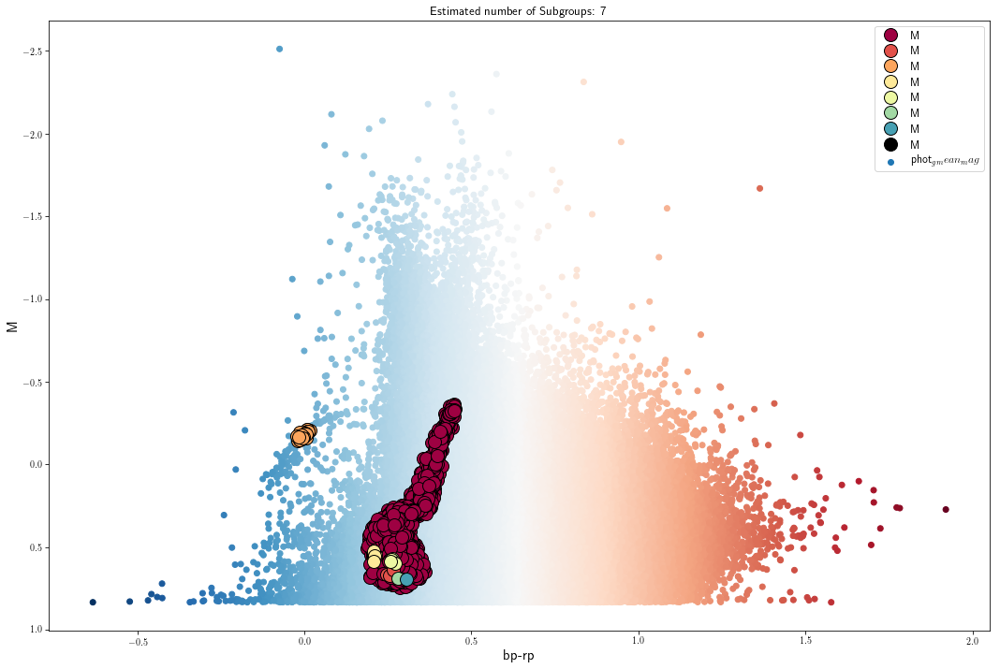

(3339, 1)
(0, 0)


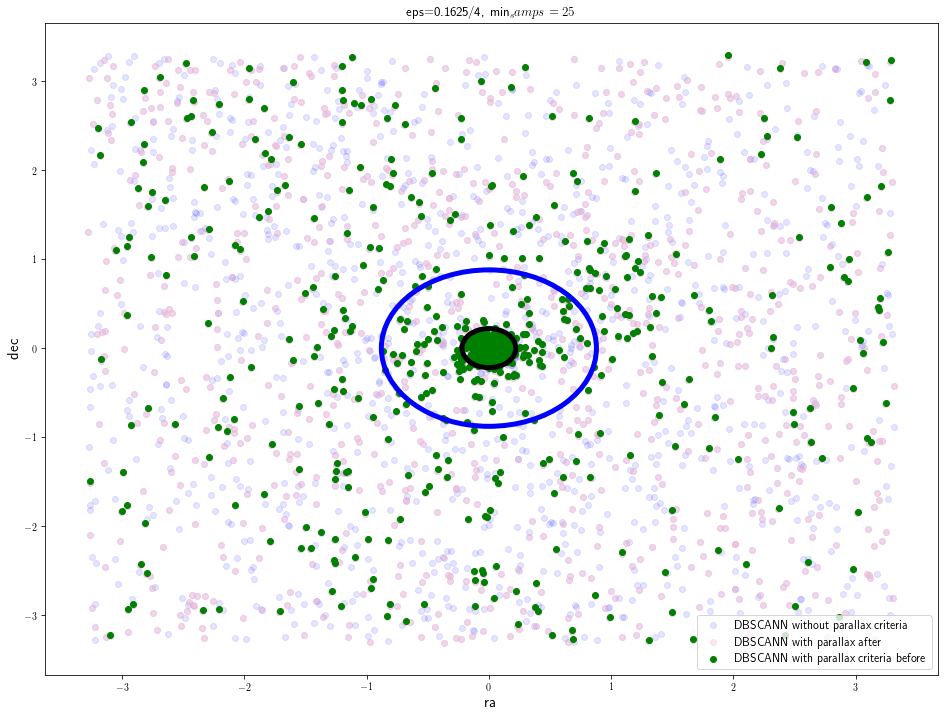

In [33]:
# DBSCANN - parallax before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx2=((1/GlobClust_Log_parallax_out<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx2=[not i for i in parallax_indx2]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M[parallax_indx2]/5, 'rpbp': GlobClust_Log_rpbp[parallax_indx2]/2.5,\
    'pmra': GlobClust_Log_pmra[parallax_indx2]/20, 'pmdec': GlobClust_Log_pmdec[parallax_indx2]/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/4, min_samples=25, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB2 = GC_ra.reindex(x_out3.index)
dec_DB2 = GC_dec.reindex(y_out3.index)
pmra_DB2 = GC_pmra.reindex(x_out3.index)
pmdec_DB2 = GC_pmdec.reindex(y_out3.index)

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='b', alpha=0.1, label='DBSCANN without parallax criteria')
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), c='pink', alpha=0.4, label='DBSCANN with parallax after')
plt.scatter(ra_DB2-ra_DB2.mean(), dec_DB2-dec_DB2.mean(),  c='g', label='DBSCANN with parallax criteria before')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/4, min_samps=25')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-6.08121839 -5.91177808 -5.78349492 ...,  1.07400623  1.16452482
  1.42833021]
[-12.23046909 -12.2198274  -12.20514118 ...,   0.64143334   0.85856867
   1.23483367]
[-3.97774865 -3.66498587 -3.64424307 ...,  3.31383533  3.60539868
  3.80433546]
[-6.41943169 -6.40966854 -6.29042    ...,  6.82718559  6.91471418
  6.91877996]


ValueError: Contour levels must be increasing

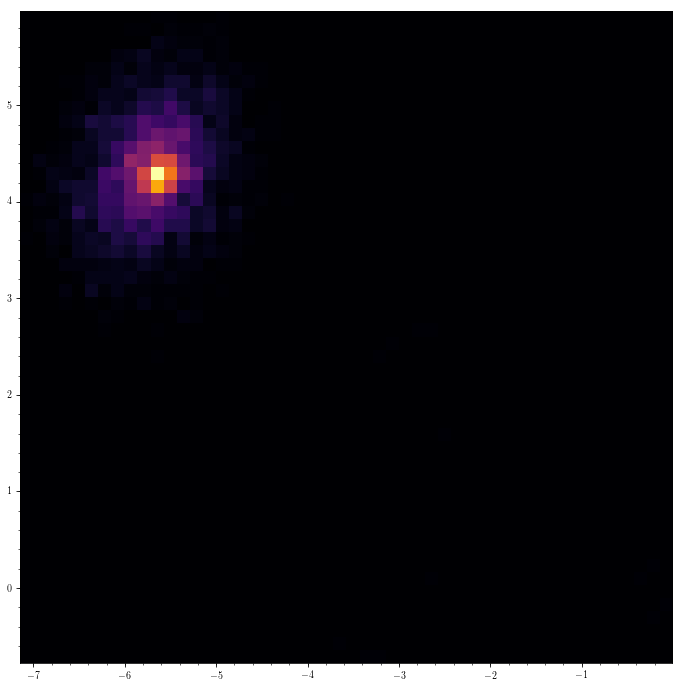

In [34]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

df=pd.DataFrame(pmra_DB.mean()).transpose()
df=pd.concat([df]*378, ignore_index=True)
df_pmra=df.append(pmra_DB).append(df).append(pmra_DB.mean(), ignore_index=True)

df=pd.DataFrame(pmdec_DB.mean()).transpose()
df=pd.concat([df]*378, ignore_index=True)
df_pmdec=df.append(pmdec_DB).append(df).append(pmdec_DB.mean(), ignore_index=True)

df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB2.join(pmdec_DB2)

WT2 = pywt.swtn(df_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB2.join(dec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(94729, 4)
[-1 -1 -1 ..., -1 -1 -1]
(94729,)
Estimated number of Subgroups: 24


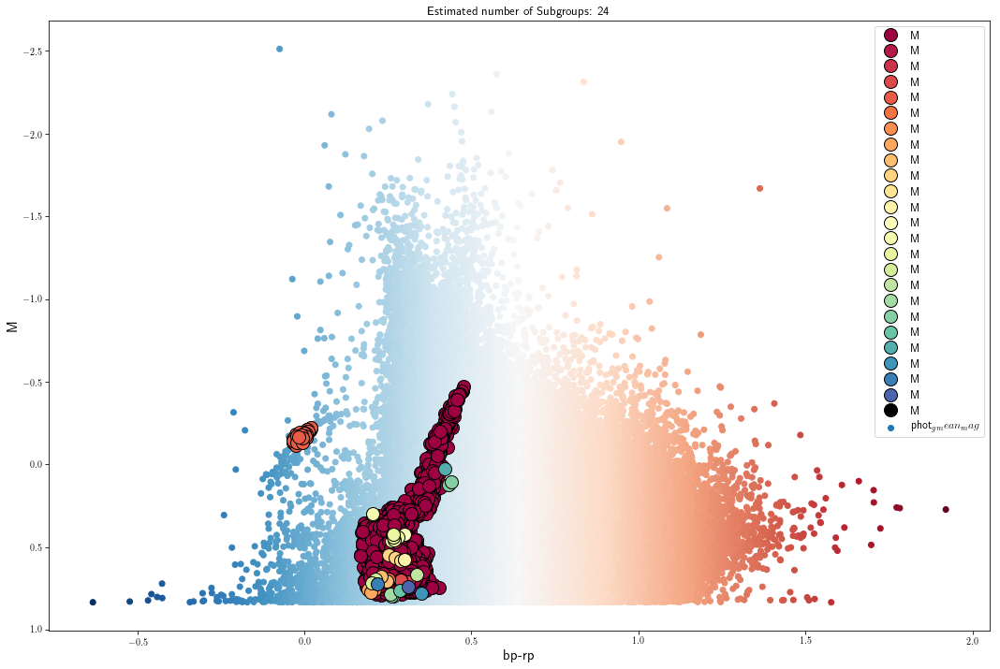

(6985, 1)
(0, 0)
/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



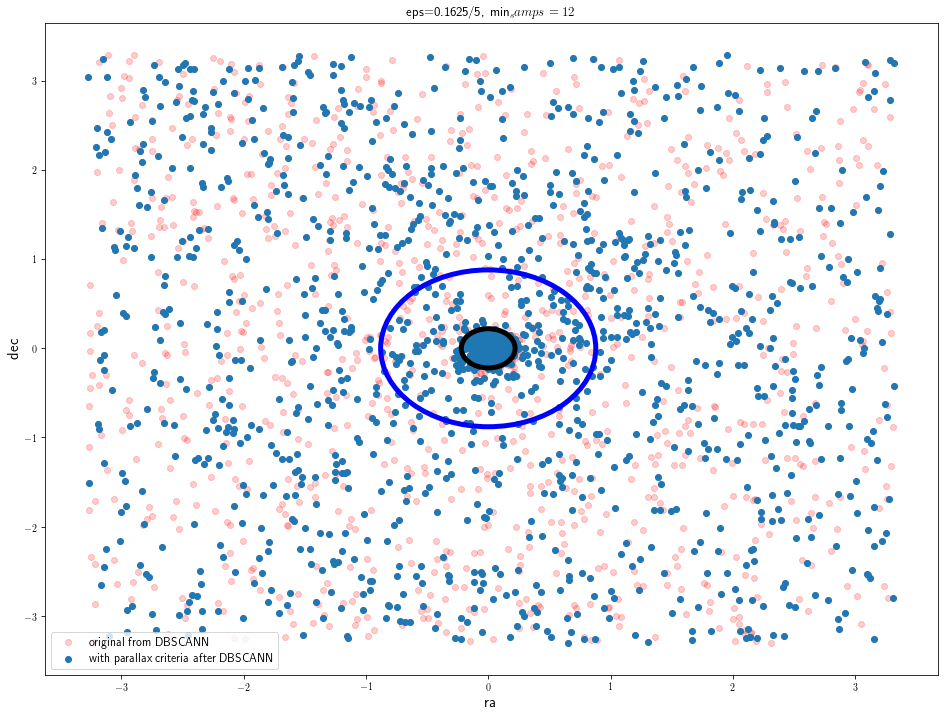

In [35]:
# DBSCANN - parallax after scan

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M/5, 'rpbp': GlobClust_Log_rpbp/2.5, 'pmra': GlobClust_Log_pmra/20, 'pmdec': GlobClust_Log_pmdec/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/5, min_samples=12, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)

GC_parallax = GlobClust_Log_parallax_out.reindex(y_out3.index)
GC_parallaxerror = GlobClust_Log_parallaxerror_out.reindex(y_out3.index)
GC_parallaxe = GlobClust_Log_parallaxe_out.reindex(y_out3.index)

GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out
GC_parallaxover = GlobClust_Log_parallaxover_out.reindex(y_out3.index)

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx=((1/GC_parallax<5.)*(GC_parallaxover<0.10))
parallax_indx=[not i for i in parallax_indx]

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='r', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), label='with parallax criteria after DBSCANN' )
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/5, min_samps=12')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-6.18134121 -6.08121839 -6.01852498 ...,  1.26532936  1.35165159
  1.47928141]
[-12.42068499 -12.2198274  -12.16574698 ...,   0.29758345   0.36279504
   0.42653622]
[-4.01853372 -3.97774865 -3.73486087 ...,  3.20113963  3.26816972
  3.42781855]
[-6.59942234 -6.34576682 -6.27935122 ...,  6.69929573  6.76375324
  6.79669247]


ValueError: Contour levels must be increasing

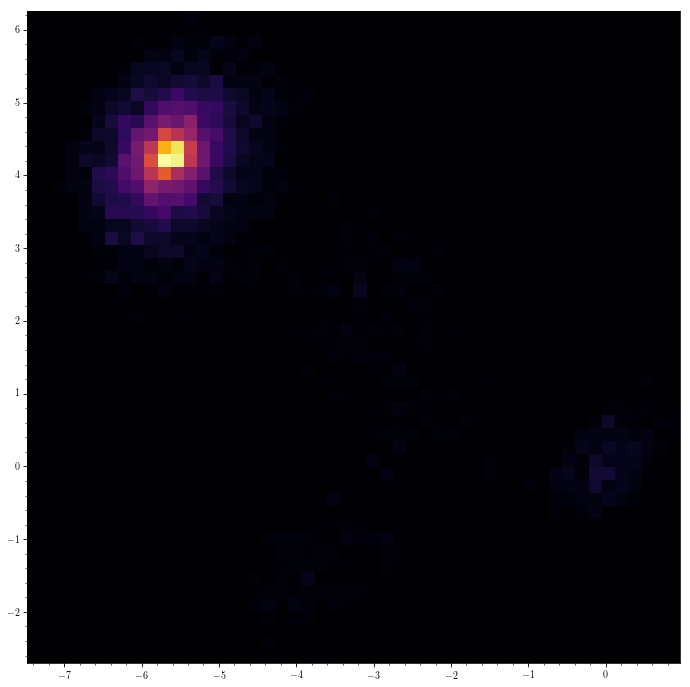

In [36]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

df=pd.DataFrame(pmra_DB.mean()).transpose()
df=pd.concat([df]*603, ignore_index=True)
df_pmra=df.append(pmra_DB).append(df).append(pmra_DB.mean(), ignore_index=True)

df=pd.DataFrame(pmdec_DB.mean()).transpose()
df=pd.concat([df]*603, ignore_index=True)
df_pmdec=df.append(pmdec_DB).append(df).append(pmdec_DB.mean(), ignore_index=True)

df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB.join(pmdec_DB)

WT2 = pywt.swtn(df_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB.join(dec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(59203, 4)
[-1 -1 -1 ...,  0 -1 -1]
(59203,)
Estimated number of Subgroups: 15


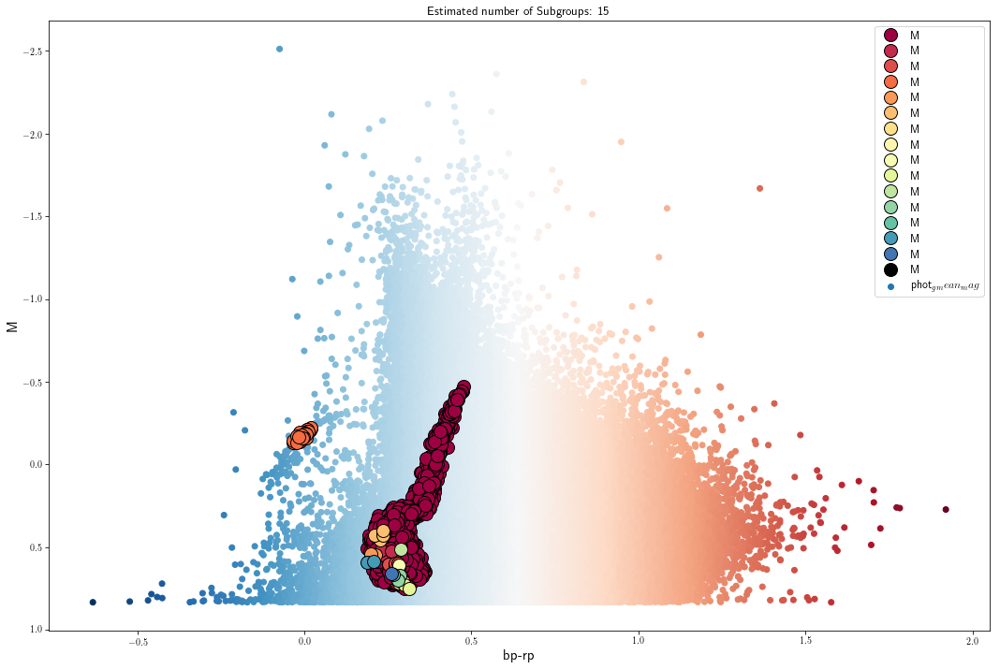

(3237, 1)
(0, 0)


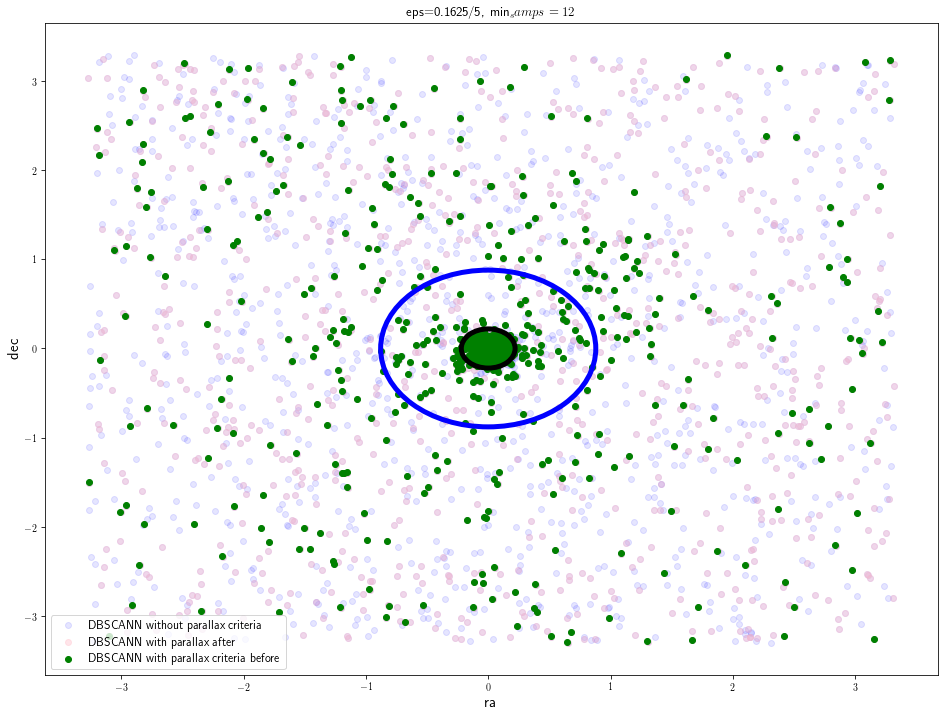

In [37]:
# DBSCANN - parallax before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx2=((1/GlobClust_Log_parallax_out<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx2=[not i for i in parallax_indx2]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M[parallax_indx2]/5, 'rpbp': GlobClust_Log_rpbp[parallax_indx2]/2.5,\
    'pmra': GlobClust_Log_pmra[parallax_indx2]/20, 'pmdec': GlobClust_Log_pmdec[parallax_indx2]/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/5, min_samples=12, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB2 = GC_ra.reindex(x_out3.index)
dec_DB2 = GC_dec.reindex(y_out3.index)
pmra_DB2 = GC_pmra.reindex(x_out3.index)
pmdec_DB2 = GC_pmdec.reindex(y_out3.index)

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='b', alpha=0.1, label='DBSCANN without parallax criteria')
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), c='pink', alpha=0.4, label='DBSCANN with parallax after')
plt.scatter(ra_DB2-ra_DB2.mean(), dec_DB2-dec_DB2.mean(),  c='g', label='DBSCANN with parallax criteria before')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/5, min_samps=12')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-6.18134121 -6.08121839 -6.01852498 ...,  1.26532936  1.35165159
  1.47928141]
[-12.42068499 -12.2198274  -12.16574698 ...,   0.29758345   0.36279504
   0.42653622]
[-4.01853372 -3.97774865 -3.73486087 ...,  3.20113963  3.26816972
  3.42781855]
[-6.59942234 -6.34576682 -6.27935122 ...,  6.69929573  6.76375324
  6.79669247]


ValueError: Contour levels must be increasing

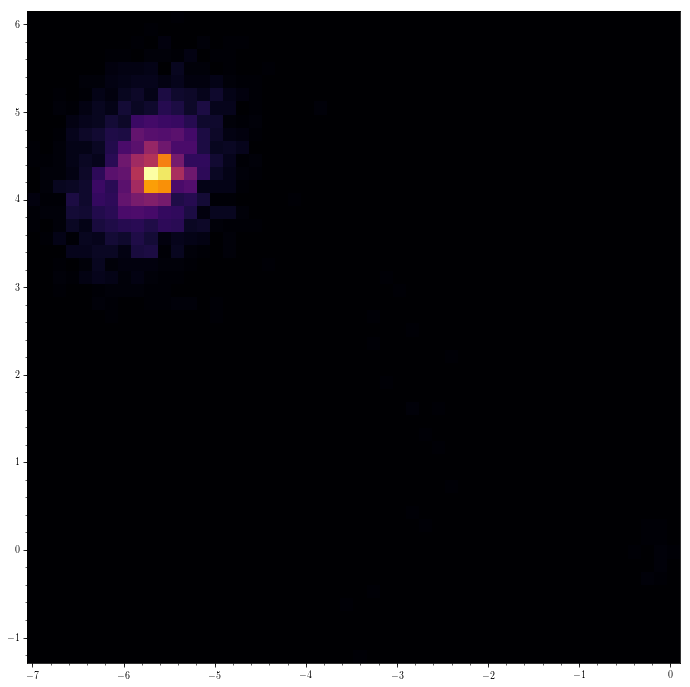

In [38]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

df=pd.DataFrame(pmra_DB.mean()).transpose()
df=pd.concat([df]*429, ignore_index=True)
df_pmra=df.append(pmra_DB).append(df).append(pmra_DB.mean(), ignore_index=True)

df=pd.DataFrame(pmdec_DB.mean()).transpose()
df=pd.concat([df]*429, ignore_index=True)
df_pmdec=df.append(pmdec_DB).append(df).append(pmdec_DB.mean(), ignore_index=True)

df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB2.join(pmdec_DB2)

WT2 = pywt.swtn(df_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB2.join(dec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(94729, 4)
[-1 -1 -1 ..., -1 -1 -1]
(94729,)
Estimated number of Subgroups: 6


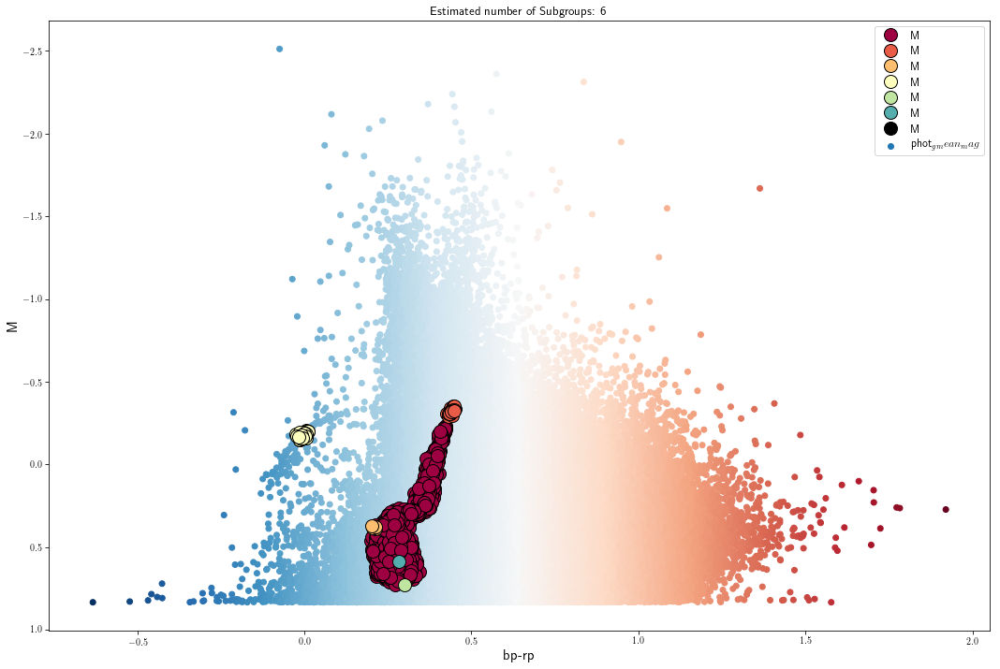

(4073, 1)
(0, 0)
/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



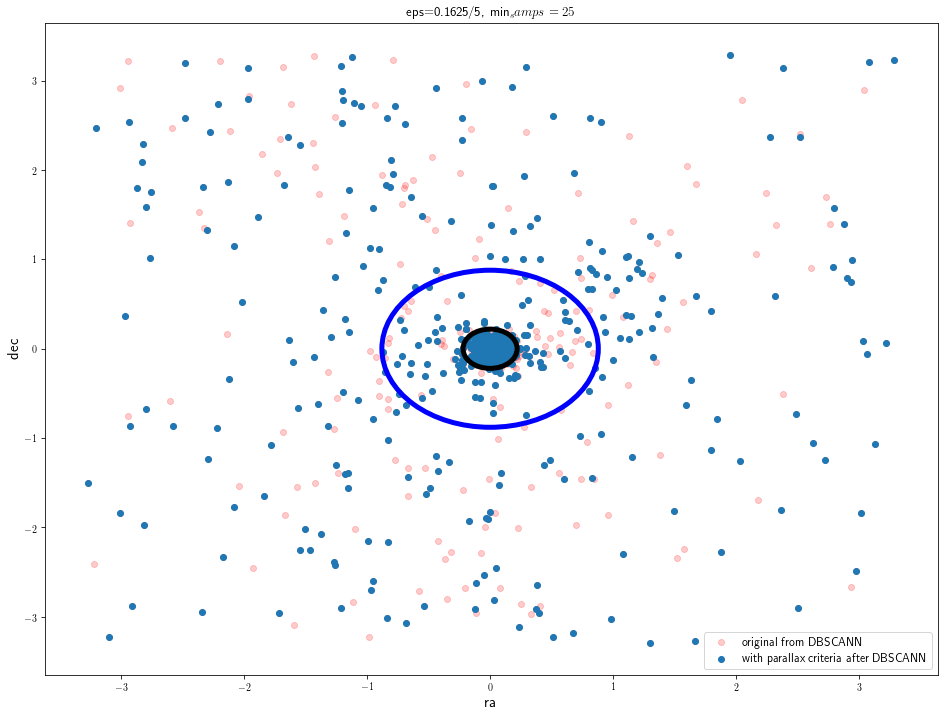

In [39]:
# DBSCANN - parallax after scan

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M/5, 'rpbp': GlobClust_Log_rpbp/2.5, 'pmra': GlobClust_Log_pmra/20, 'pmdec': GlobClust_Log_pmdec/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/5, min_samples=25, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)

GC_parallax = GlobClust_Log_parallax_out.reindex(y_out3.index)
GC_parallaxerror = GlobClust_Log_parallaxerror_out.reindex(y_out3.index)
GC_parallaxe = GlobClust_Log_parallaxe_out.reindex(y_out3.index)

GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out
GC_parallaxover = GlobClust_Log_parallaxover_out.reindex(y_out3.index)

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx=((1/GC_parallax<5.)*(GC_parallaxover<0.10))
parallax_indx=[not i for i in parallax_indx]

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='r', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), label='with parallax criteria after DBSCANN' )
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/5, min_samps=25')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-2.86440871 -2.84325218 -2.81040411 ...,  0.29959377  0.32731249
  0.41103734]
[-11.55071884 -11.42079952 -11.36895904 ...,  -4.95911151  -4.78430165
  -4.44183713]
[-1.71380214 -1.614554   -1.52033007 ...,  1.63635046  1.66308466
  1.72910192]
[-4.76021565 -4.6953202  -4.57704701 ...,  4.98286286  5.35825389
  5.36770158]


ValueError: Contour levels must be increasing

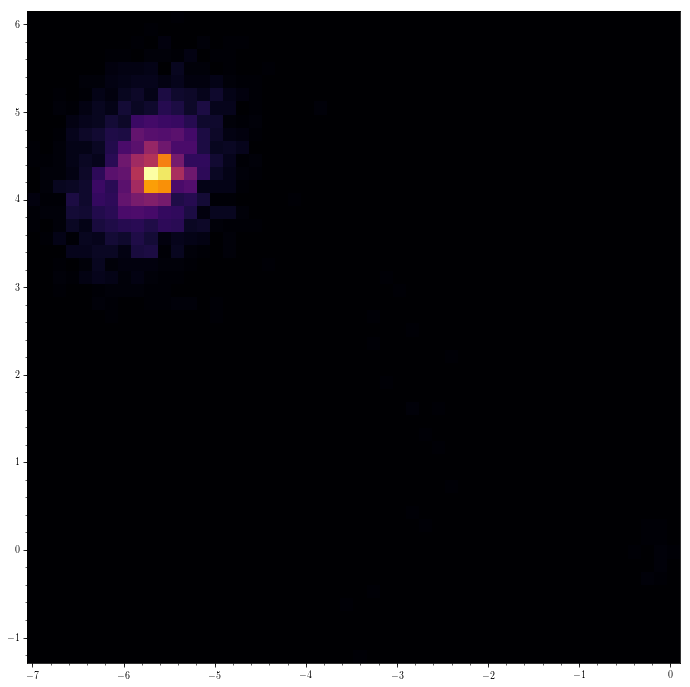

In [40]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

df=pd.DataFrame(pmra_DB.mean()).transpose()
df=pd.concat([df]*11, ignore_index=True)
df_pmra=df.append(pmra_DB).append(df).append(pmra_DB.mean(), ignore_index=True)

df=pd.DataFrame(pmdec_DB.mean()).transpose()
df=pd.concat([df]*11, ignore_index=True)
df_pmdec=df.append(pmdec_DB).append(df).append(pmdec_DB.mean(), ignore_index=True)

df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

#pmradec=pmra_DB.join(pmdec_DB)

WT2 = pywt.swtn(df_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB.join(dec_DB)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

<SkyCoord (ICRS): (ra, dec) in deg
    [( 13.1885, -26.58261111)]>
(59203, 4)
[-1 -1 -1 ..., -1 -1 -1]
(59203,)
Estimated number of Subgroups: 4


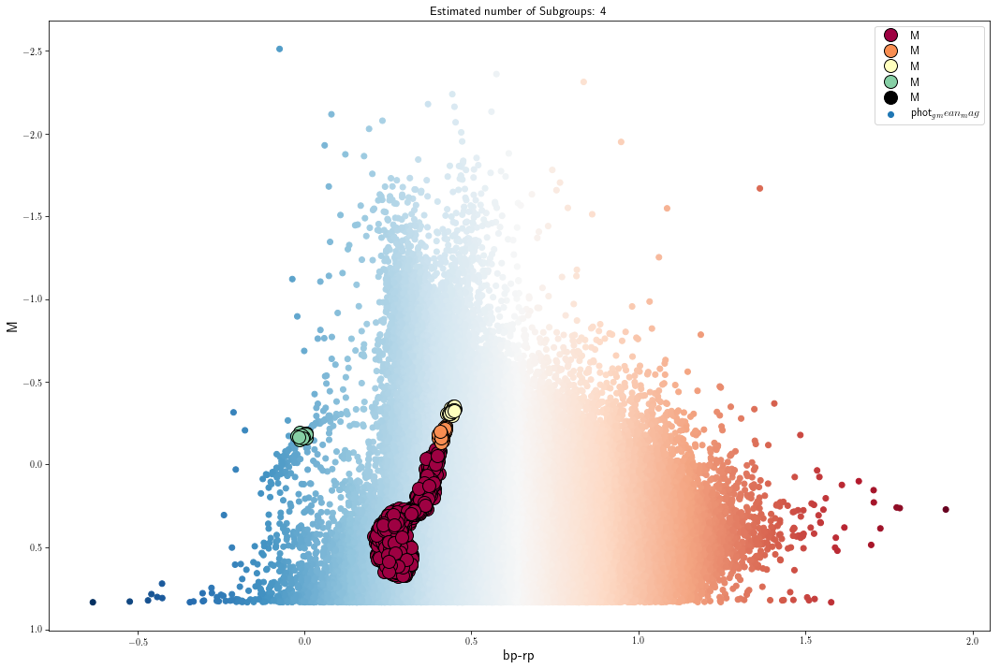

(2185, 1)
(0, 0)


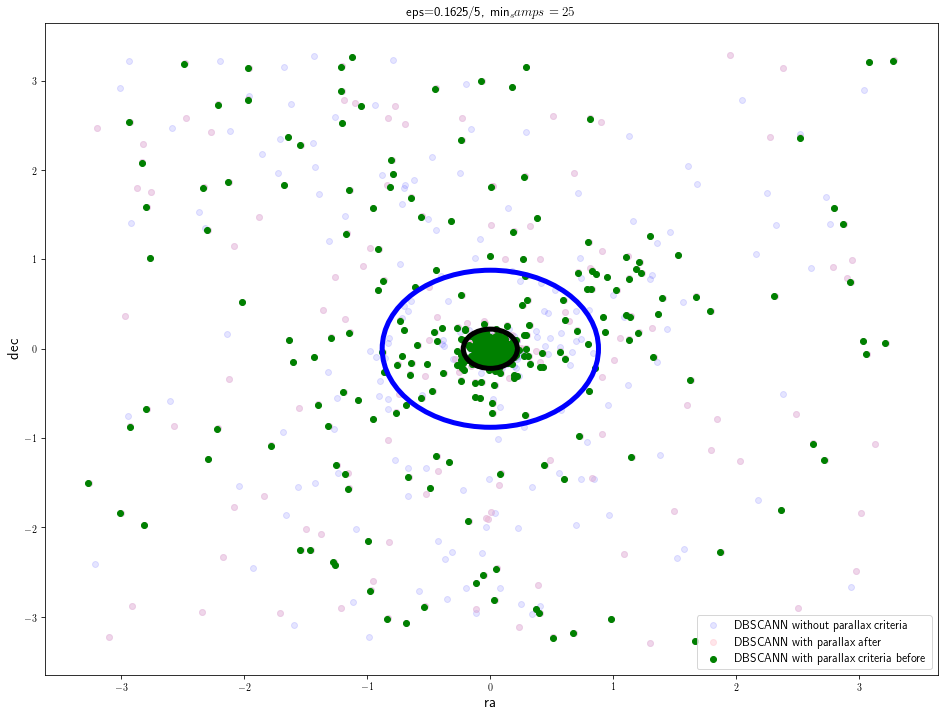

In [41]:
# DBSCANN - parallax before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx2=((1/GlobClust_Log_parallax_out<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx2=[not i for i in parallax_indx2]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

#DF={'M': GlobClust_Log_M[indx]/5, 'rpbp': GlobClust_Log_rpbp[indx]/2.5, 'pmra': GlobClust_Log_pmra[indx]/20, \
#    'pmdec': GlobClust_Log_pmdec[indx]/20}#, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DF={'M': GlobClust_Log_M[parallax_indx2]/5, 'rpbp': GlobClust_Log_rpbp[parallax_indx2]/2.5,\
    'pmra': GlobClust_Log_pmra[parallax_indx2]/20, 'pmdec': GlobClust_Log_pmdec[parallax_indx2]/20}
#\, 'ra': GlobClust_Log_ra[indx]/0.35, 'dec': GlobClust_Log_dec[indx]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625/5, min_samples=25, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"]*2.5)
    y_param3.append(xy.loc[:, "M"]*5)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
#x_out4 = x_out4["pmra"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
#y_out4 = y_out4["pmdec"].as_matrix()
print(shape(y_out4))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB2 = GC_ra.reindex(x_out3.index)
dec_DB2 = GC_dec.reindex(y_out3.index)
pmra_DB2 = GC_pmra.reindex(x_out3.index)
pmdec_DB2 = GC_pmdec.reindex(y_out3.index)

#for i in range(len(GlobClust_Log_M)):
#    for k in range(len(y_out3)):
#        if GlobClust_Log_M[i] == y_out3[k] and GlobClust_Log_rpbp[i] == x_out3[k] and \
#        GlobClust_Log_pmra[i] == x_out4[k] and GlobClust_Log_pmdec[i] == y_out4[k] :
#            ra_DB.append(GlobClust_Log_ra.as_matrix()[i])
#            dec_DB.append(GlobClust_Log_dec.as_matrix()[i])
            
#.as_matrix()
#.as_matrix()
#.as_matrix()
#.as_matrix()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-ra_DB.mean(), dec_DB-dec_DB.mean(), c='b', alpha=0.1, label='DBSCANN without parallax criteria')
plt.scatter(ra_DB[parallax_indx]-ra_DB.mean(), dec_DB[parallax_indx]-dec_DB.mean(), c='pink', alpha=0.4, label='DBSCANN with parallax after')
plt.scatter(ra_DB2-ra_DB2.mean(), dec_DB2-dec_DB2.mean(),  c='g', label='DBSCANN with parallax criteria before')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=5)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.1625/5, min_samps=25')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

[-2.86440871 -2.84325218 -2.81040411 ...,  0.29959377  0.32731249
  0.41103734]
[-11.55071884 -11.42079952 -11.36895904 ...,  -4.95911151  -4.78430165
  -4.44183713]
[-1.71380214 -1.614554   -1.52033007 ...,  1.63635046  1.66308466
  1.72910192]
[-4.76021565 -4.6953202  -4.57704701 ...,  4.98286286  5.35825389
  5.36770158]


ValueError: Contour levels must be increasing

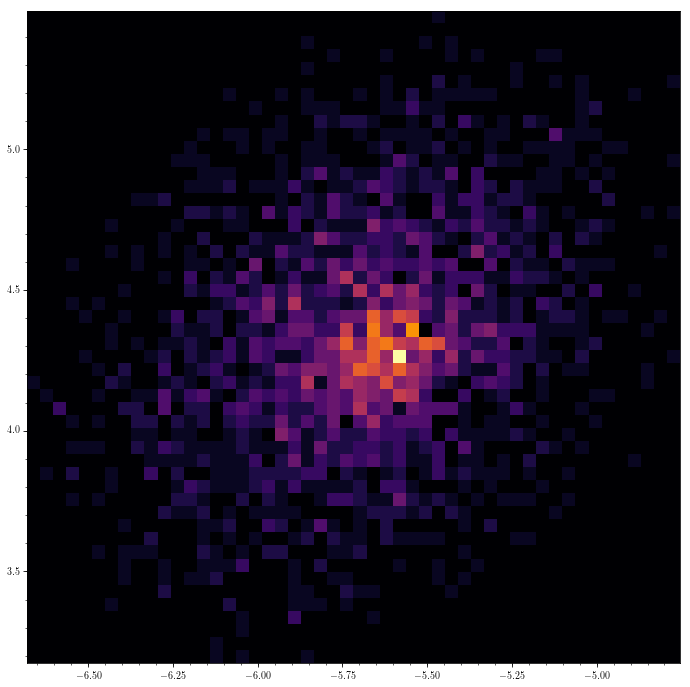

In [42]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

df=pd.DataFrame(pmra_DB.mean()).transpose()
df=pd.concat([df]*955, ignore_index=True)
df_pmra=df.append(pmra_DB).append(df).append(pmra_DB.mean(), ignore_index=True)

df=pd.DataFrame(pmdec_DB.mean()).transpose()
df=pd.concat([df]*955, ignore_index=True)
df_pmdec=df.append(pmdec_DB).append(df).append(pmdec_DB.mean(), ignore_index=True)

df_pmradec=df_pmra.join(df_pmdec)

#GC_pmra=pmra_DB.as_matrix()
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_DB.as_matrix()
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3000,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (992,), 'mean')
#GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

pmradec=pmra_DB2.join(pmdec_DB2)

WT2 = pywt.swtn(df_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=sorted(WT2_aa, key=abs)
#WT2_aa=pd.DataFrame({'WT2_aa': WT2_aa})
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(pmradec.loc[:,"pmdec"].dropna().as_matrix(), pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


#ra_DB.join(dec_DB, lsuffix='_left', rsuffix='_right')
#ra_DB.join(dec_DB)

# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

#GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
#GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

#GC_pmra=pmra_norm2
#GC_pmra=append(GC_pmra,GC_pmra.mean())
#GC_pmdec=pmdec_norm2
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
#GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
#GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
#GC_pmradec = {'pmra': [GC_pmra], 'pmdec': [GC_pmdec]}
#GC_pmradec = pd.DataFrame(GC_pmradec)
#GC_pmradec

radec=ra_DB2.join(dec_DB2)

WT2 = pywt.swtn(pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=100, cntrSmooth=True)

bovy_plot.scatterplot(radec.loc[:,"dec"].dropna().as_matrix(), radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=100, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

In [7]:
# Matching DBSCANN results to full CMD

import time

t0 = time.time()

#print(x_param)
#print(y_param)

#print(GlobClust_Log_M[x_param])
#x_out = x_param.transpose()
x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))


M_i3 = GlobClust_Log_M.as_matrix()
rpbp_i3 = GlobClust_Log_rpbp.as_matrix()

M_k3 = y_out3
rpbp_k3 = x_out3


Cluster3 = np.zeros(len(GlobClust_Log_M), dtype='bool')


M_final3 = []
rpbp_final3 =[]


for i3 in range(0,len(M_i3)):
    count = 0
    for k3 in range(0,len(M_k3)):
        dist3 = np.sqrt(np.abs((M_i3[i3]-M_k3[k3])**2+(rpbp_i3[i3]-rpbp_k3[k3])**2))
        if dist3 < 0.1:
            Cluster3[i3]=True
            M_final3.append(M_i3[i3])
            rpbp_final3.append(rpbp_i3[i3])
            count+=1
            if count != 0:
                break

t1 = time.time()
total = t1-t0
print(total)
print(Cluster3)
print(shape(Cluster3))
print(np.sum(Cluster3))

(418,)
153.49713253974915
[False False  True ..., False False False]
(117480,)
29187


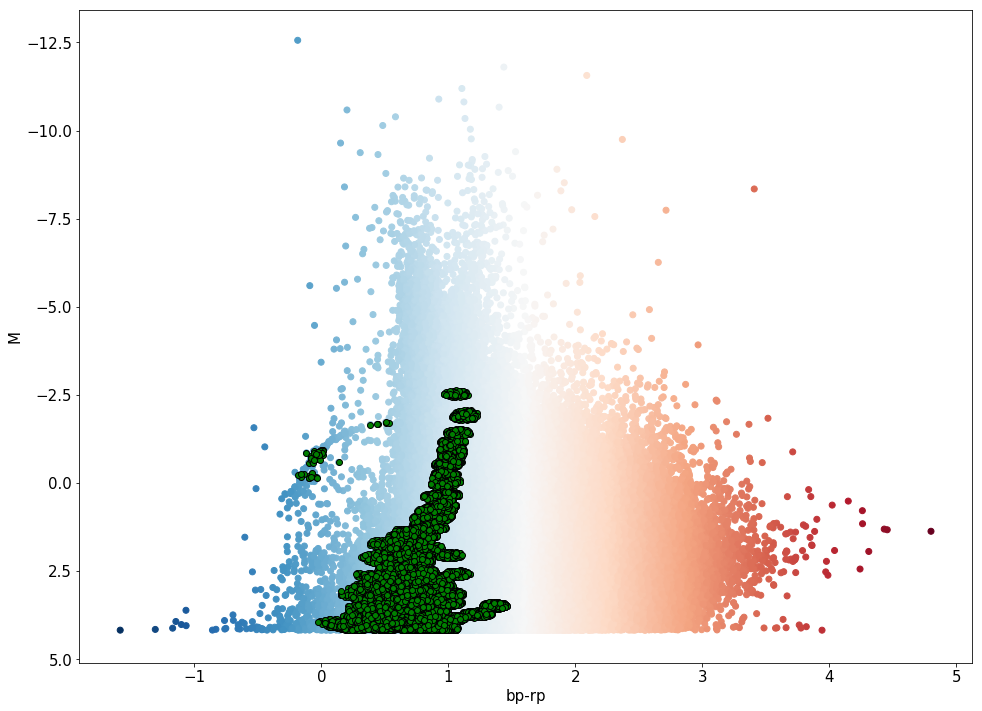

In [8]:
# PLOT OUTCOME OF CMD MATCHING - RUN AFTER PREVIOUS CELL

rpbp_ic3=rpbp_i3[Cluster3] #np.multiply(rpbp_i,Cluster)
M_ic3=M_i3[Cluster3] #multiply(M_i,Cluster)

fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=rpbp_ic3, y=M_ic3, c='g', edgecolors='k')#, alpha=0.2)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().invert_yaxis()
plt.show()

In [ ]:
shape(pmra_norm2)
shape(Survive2)
shape(pmra_norm2[Survive2])
shape(pmra_ic3)
shape(Survive)

In [ ]:
# PLOT RA-DEC FROM MATCHING CMD
# RUN AFTER PREVIOUS CELLS

GlobClust_Log_ra_dec = pd.read_csv('~/GlobClust_ra-dec.csv')
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[:,"r_t"]
Tidal_Edge = GlobClust_Log_r_t.loc[0]

ra_ic3=GlobClust_Log_ra[Cluster3] #np.multiply(rpbp_i,Cluster)
dec_ic3=GlobClust_Log_dec[Cluster3] #multiply(M_i,Cluster)
pmdec_ic3=GlobClust_Log_pmdec[Cluster3]
pmra_ic3=GlobClust_Log_pmra[Cluster3]

Survive = (sqrt((np.fabs(ra_ic3-ra_ic3.mean())**2+np.fabs(dec_ic3-dec_ic3.mean())**2))<Tidal_Edge/60)
Survive = [not i for i in Survive]
Survive2 = [not i for i in Survive]

#pmdec_norm2 = (pmdec_ic3 - np.nanmean(pmdec_ic3)) / (20*np.nanmean(pmdec_ic3))
#pmra_norm2 = (pmra_ic3 - np.nanmean(pmra_ic3)) / (16*np.nanmean(pmra_ic3))

#Scaling:
pmdec_norm2 = (pmdec_ic3 - np.nanmean(pmdec_ic3[Survive2])) / (4*np.nanmean(pmdec_ic3[Survive2]))
pmra_norm2 = (pmra_ic3 - np.nanmean(pmra_ic3[Survive2])) / (4*np.nanmean(pmra_ic3[Survive2]))

#caraay=[cm.magma_r((3.5-2.5)/2.5),cm.magma_r(0),cm.magma_r((2.8-2.5)/2.5),cm.magma_r((3-2.5)/2.5),cm.magma_r((3.2-2.5)/2.5),\
#        cm.magma_r((3.5-2.5)/2.5),cm.magma_r((3.8-2.5)/2.5),cm.magma_r((4-2.5)/2.5),cm.magma_r((5-2.5)/2.5)]


fig=plt.figure(figsize=(16,12))
#plt.scatter(x=GlobClust_Log_ra-coord_ra_dec.ra.deg, y=GlobClust_Log_dec-coord_ra_dec.dec.deg, c='k', alpha=0.4)
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_ic3-coord_ra_dec.ra.deg, y=dec_ic3-coord_ra_dec.dec.deg, c=pmdec_norm2, cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmdec')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
plt.gca().tick_params(labelsize=15)

fig=plt.figure(figsize=(16,12))
plt.scatter(x=ra_ic3-coord_ra_dec.ra.deg, y=dec_ic3-coord_ra_dec.dec.deg, c=pmra_norm2, cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmra')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
plt.gca().tick_params(labelsize=15)
plt.show()

In [ ]:
# Another attempt at colouring - using normalized colouring in matplotlib

import matplotlib.colors as colors

ra_ic3=GlobClust_Log_ra[Cluster3] #np.multiply(rpbp_i,Cluster)
dec_ic3=GlobClust_Log_dec[Cluster3] #multiply(M_i,Cluster)
pmdec_ic3=GlobClust_Log_pmdec[Cluster3]
pmra_ic3=GlobClust_Log_pmra[Cluster3]

pmdec_norm2 = (pmdec_ic3 - np.nanmean(pmdec_ic3[Survive2])) / (4*np.nanmean(pmdec_ic3[Survive2]))
pmra_norm2 = (pmra_ic3 - np.nanmean(pmra_ic3[Survive2])) / (4*np.nanmean(pmra_ic3[Survive2]))

#caraay=[cm.magma_r((3.5-2.5)/2.5),cm.magma_r(0),cm.magma_r((2.8-2.5)/2.5),cm.magma_r((3-2.5)/2.5),cm.magma_r((3.2-2.5)/2.5),\
#        cm.magma_r((3.5-2.5)/2.5),cm.magma_r((3.8-2.5)/2.5),cm.magma_r((4-2.5)/2.5),cm.magma_r((5-2.5)/2.5)]

fig=plt.figure(figsize=(16,12))
#plt.scatter(x=GlobClust_Log_ra-coord_ra_dec.ra.deg, y=GlobClust_Log_dec-coord_ra_dec.dec.deg, c='k', alpha=0.4)
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_ic3-coord_ra_dec.ra.deg, y=dec_ic3-coord_ra_dec.dec.deg, c=pmdec_ic3, cmap='inferno', 
            norm=colors.SymLogNorm(vmin=np.nanmin(pmdec_ic3), vmax=np.nanmax(pmdec_ic3), linthresh=0.03, ),)#edgecolors='k')
#           vmin=-1, vmax=1)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmdec')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
plt.gca().tick_params(labelsize=15)

bounds=[np.nanmin(pmra_ic3), np.nanmean(pmra_ic3), 0, np.nanmax(pmra_ic3)]
normbounds = [np.nanmin(pmra_norm2), 0, np.nanmax(pmra_norm2)]
fig=plt.figure(figsize=(16,12))
plt.scatter(x=ra_ic3-coord_ra_dec.ra.deg, y=dec_ic3-coord_ra_dec.dec.deg, c=pmra_ic3, cmap='viridis_r',
           norm=colors.BoundaryNorm(normbounds, ncolors=256))#edgecolors='k')
#           vmin=-1, vmax=1)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmra')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
plt.gca().tick_params(labelsize=15)
plt.show()

print(normbounds)

In [ ]:
print([np.nanmin(pmdec_norm2)/fabs(np.nanmean(pmdec_ic3)), 0, np.nanmax(pmdec_norm2)/fabs(np.nanmean(pmdec_ic3))])

In [ ]:
# PLOT RA-DEC FROM MATCHING CMD - USING BOVY PLOTS
# RUN AFTER PREVIOUS CELLS

from galpy.util import bovy_plot

ra_ic3=GlobClust_Log_ra[Cluster3] #np.multiply(rpbp_i,Cluster)
dec_ic3=GlobClust_Log_dec[Cluster3] #multiply(M_i,Cluster)
pmdec_ic3=GlobClust_Log_pmdec[Cluster3]
pmra_ic3=GlobClust_Log_pmra[Cluster3]

#bounds_pmra=[np.nanmin(pmra_ic3), np.nanmean(pmra_ic3), 0, np.nanmax(pmra_ic3)]
#normbounds_pmra = [np.nanmin(pmra_norm2), 0, np.nanmax(pmra_norm2)]
#bounds_pmdec=[np.nanmin(pmdec_ic3), np.nanmean(pmdec_ic3), 0, np.nanmax(pmdec_ic3)]
#normbounds_pmdec = [np.nanmin(pmdec_norm2), 0, np.nanmax(pmdec_norm2)]

#caraay=[cm.magma_r((3.5-2.5)/2.5),cm.magma_r(0),cm.magma_r((2.8-2.5)/2.5),cm.magma_r((3-2.5)/2.5),cm.magma_r((3.2-2.5)/2.5),\
#        cm.magma_r((3.5-2.5)/2.5),cm.magma_r((3.8-2.5)/2.5),cm.magma_r((4-2.5)/2.5),cm.magma_r((5-2.5)/2.5)]

#fig=plt.figure(figsize=(16,12))
#plt.scatter(x=GlobClust_Log_ra-coord_ra_dec.ra.deg, y=GlobClust_Log_dec-coord_ra_dec.dec.deg, c='k', alpha=0.4)
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(ra_ic3-coord_ra_dec.ra.deg,dec_ic3-coord_ra_dec.dec.deg,'w,', bins=100, 
                      #pmra_norm2[~numpy.isnan(pmra_norm2)]/np.nanmean(pmra_ic3), pmdec_norm2[~numpy.isnan(pmdec_norm2)]/np.nanmean(pmra_ic3), 
                    #'b,', bins=250,                  
                      #levels=[0,4.3,61.62,74.9],
                      #levels=[np.nanmin(pmra_ic3), 0, np.nanmax(pmra_ic3)],
                      levels=[np.nanmin(pmra_norm2)/np.nanmean(pmra_ic3[Survive2]), 0, np.nanmax(pmra_norm2)/np.nanmean(pmra_ic3[Survive2])],
        #levels=[GlobClust_Log_r_c[0]/60, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60*4],
        #levels=[GlobClust_Log_r_t[0]/60*4, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_c[0]/60],
                     cntrSmooth=True, 
                      #justcontours=True,
                     cmap='copper',
                        cntrcolors=['blue','red','purple'],#,'green'], 
                      cntrlw=2,
                     #onedhists=True,
                      #xrange=[-0.03,0.03],yrange=[-0.03,0.03],
                        )
                     #colorbar=True,
                     #xrange=[-0.5,0.5], yrange=[0.5,-0.5])#,
                      #bins=101)
                      #levels=[0.02,0.06,0.12,0.21,0.33,0.50,0.68,0.80,0.90,0.95],
                      #contours=False,
                     #xlabel=r'$X\,(\mathrm{kpc})$',
                     #ylabel=r'$X\,(\mathrm{kpc})$')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.title('Coloured by pmra')
                    
bovy_plot.scatterplot(ra_ic3-coord_ra_dec.ra.deg,dec_ic3-coord_ra_dec.dec.deg,'w,', bins=100, 
                      #pmra_norm2[~numpy.isnan(pmra_norm2)]/np.nanmean(pmra_ic3), pmdec_norm2[~numpy.isnan(pmdec_norm2)]/np.nanmean(pmra_ic3), 
                    #'b,', bins=250,                  
                      #levels=[0,4.3,61.62,74.9],
                      #levels=[np.nanmin(pmra_ic3), 0, np.nanmax(pmra_ic3)],
                      levels=[np.nanmin(pmdec_norm2)/fabs(np.nanmean(pmdec_ic3[Survive2])), 0, np.nanmax(pmdec_norm2)/fabs(np.nanmean(pmdec_ic3[Survive2]))],
        #levels=[GlobClust_Log_r_c[0]/60, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60*4],
        #levels=[GlobClust_Log_r_t[0]/60*4, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_c[0]/60],
                     cntrSmooth=True, 
                      #justcontours=True,
                     cmap='copper',
                        cntrcolors=['blue','red','purple'],#,'green'], 
                      cntrlw=2,
                     #onedhists=True,
                      #xrange=[-0.03,0.03],yrange=[-0.03,0.03],
                        )
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.title('Coloured by pmdec')

plt.xlabel('pmdec', fontsize=15)
plt.ylabel('pmra', fontsize=15)
#plt.legend()
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
plt.gca().tick_params(labelsize=15)
plt.show()

#print(normbounds/fabs(np.nanmean(pmdec_ic3)))
print([np.nanmin(pmdec_norm2)/np.nanmean(pmdec_ic3), 0, np.nanmax(pmdec_norm2)/np.nanmean(pmdec_ic3)])

In [ ]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

GC_pmra=pmra_norm2
GC_pmra=append(GC_pmra,GC_pmra.mean())
GC_pmdec=pmdec_norm2
GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
GC_pmradec = pd.DataFrame(GC_pmradec)
GC_pmradec

WT2 = pywt.swtn(GC_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

GC_radec = {'ra': ra_ic3-coord_ra_dec.ra.deg, 'dec': dec_ic3-coord_ra_dec.dec.deg}
GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

GC_pmra=pmra_norm2
GC_pmra=append(GC_pmra,GC_pmra.mean())
GC_pmdec=pmdec_norm2
GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
GC_pmra = np.pad(GC_pmra, (3765,), 'mean')
GC_pmdec = np.pad(GC_pmdec, (3765,), 'mean')
GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
GC_pmradec = pd.DataFrame(GC_pmradec)
GC_pmradec

WT2 = pywt.swtn(GC_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


### Cutting out the cluster for colouring the maps

In [ ]:
GlobClust_Log_ra_dec = pd.read_csv('~/GlobClust_ra-dec.csv')
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[:,"r_t"]
Tidal_Edge = GlobClust_Log_r_t.loc[0]

#Survive = (sqrt((np.fabs(ra_ic3-ra_ic3.mean())**2+np.fabs(dec_ic3-dec_ic3.mean())**2))<5/60)
#Survive = (sqrt((np.fabs(ra_ic3-ra_ic3.mean())**2+np.fabs(dec_ic3-dec_ic3.mean())**2))<Tidal_Edge/60)
#Survive = [not i for i in Survive]

ra_outer=ra_ic3[Survive] #np.multiply(rpbp_i,Cluster)
dec_outer=dec_ic3[Survive] #multiply(M_i,Cluster)
pmdec_outer=pmdec_ic3[Survive]
pmra_outer=pmra_ic3[Survive]
rpbp_outer=rpbp_ic3[Survive]
M_outer=M_ic3[Survive]

#pmdec_norm2 = (pmdec_ic3 - np.nanmean(pmdec_ic3)) / (4*np.nanmean(pmdec_ic3))
#pmra_norm2 = (pmra_ic3 - np.nanmean(pmra_ic3)) / (4*np.nanmean(pmra_ic3))

#CMD
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
plt.scatter(x=rpbp_ic3, y=M_ic3, c='purple', edgecolors='k')#, alpha=0.2)
plt.scatter(x=rpbp_outer, y=M_outer, c='g', edgecolors='w')#, alpha=0.2)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
plt.gca().invert_yaxis()

#Scatter pmra (ra-dec)
fig=plt.figure(figsize=(16,12))
plt.scatter(x=ra_outer-coord_ra_dec.ra.deg, y=dec_outer-coord_ra_dec.dec.deg, 
            c=np.fabs(pmra_norm2[Survive]/np.nanmean(pmra_ic3[Survive2])), cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmdec')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter pmdec (ra-dec)
fig=plt.figure(figsize=(16,12))
plt.scatter(x=ra_outer-coord_ra_dec.ra.deg, y=dec_outer-coord_ra_dec.dec.deg, 
            c=np.fabs(pmdec_norm2[Survive]/np.nanmean(pmdec_ic3[Survive2])), cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmra')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter by Symlog
fig=plt.figure(figsize=(16,12))
#plt.scatter(x=GlobClust_Log_ra-coord_ra_dec.ra.deg, y=GlobClust_Log_dec-coord_ra_dec.dec.deg, c='k', alpha=0.4)
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_outer-coord_ra_dec.ra.deg, y=dec_outer-coord_ra_dec.dec.deg, c=pmdec_outer, cmap='inferno', 
            norm=colors.SymLogNorm(vmin=np.nanmin(pmdec_outer), vmax=np.nanmax(pmdec_outer), linthresh=0.03, ),)#edgecolors='k')
#           vmin=-1, vmax=1)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmdec with SymLogNorm')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter by BoundNorm
bounds=[np.nanmin(pmra_outer), np.nanmean(pmra_outer), 0, np.nanmax(pmra_outer)]
normbounds = [np.nanmin(pmra_norm2), 0, np.nanmax(pmra_norm2)]
fig=plt.figure(figsize=(16,12))
plt.scatter(x=ra_outer-coord_ra_dec.ra.deg, y=dec_outer-coord_ra_dec.dec.deg, c=pmra_outer, cmap='viridis_r',
           norm=colors.BoundaryNorm(normbounds, ncolors=256)#edgecolors='k')
           ,vmin=-1, vmax=1)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmra with BoundNorm')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Bovy Plots
fig=figure(figsize=(16,12))
ax = plt.gca()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(ra_outer-coord_ra_dec.ra.deg,dec_outer-coord_ra_dec.dec.deg,'w,', bins=100, 
                      #pmra_norm2[~numpy.isnan(pmra_norm2)]/np.nanmean(pmra_ic3), pmdec_norm2[~numpy.isnan(pmdec_norm2)]/np.nanmean(pmra_ic3),'b,', bins=250,                  
                      #levels=[0,4.3,61.62,74.9],
                      #levels=[np.nanmin(pmra_ic3), 0, np.nanmax(pmra_ic3)],
                      levels=[np.nanmin(pmra_ic3)/20/np.nanmean(pmra_ic3/[Survive2]), 0, np.nanmax(pmra_ic3)/20/np.nanmean(pmra_ic3/[Survive2])],# GlobClust_Log_r_t[0]/60],
                      #levels=[np.nanmin(pmra_norm2)/np.nanmean(pmra_ic3), 0, np.nanmax(pmra_norm2)/np.nanmean(pmra_ic3)],# GlobClust_Log_r_t[0]/60],
        #levels=[GlobClust_Log_r_c[0]/60, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60*4],
        #levels=[GlobClust_Log_r_t[0]/60*4, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_c[0]/60],
                     cntrSmooth=True, 
                      #justcontours=True,
                      cmap='copper',
                        cntrcolors=['blue','red','purple'],#'green'], 
                      cntrlw=2,
                     #onedhists=True,
                      #xrange=[-0.03,0.03],yrange=[-0.03,0.03],
                        gcf=True)
                     #colorbar=True,
                     #xrange=[-0.5,0.5], yrange=[0.5,-0.5])#,
                      #bins=101)
                      #levels=[0.02,0.06,0.12,0.21,0.33,0.50,0.68,0.80,0.90,0.95],
                      #contours=False,
                     #xlabel=r'$X\,(\mathrm{kpc})$',
                     #ylabel=r'$X\,(\mathrm{kpc})$')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
#cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.title('Coloured by pmra')
                    
bovy_plot.scatterplot(ra_outer-coord_ra_dec.ra.deg,dec_outer-coord_ra_dec.dec.deg,'w,', bins=100, 
                      #pmra_norm2[~numpy.isnan(pmra_norm2)]/np.nanmean(pmra_ic3), pmdec_norm2[~numpy.isnan(pmdec_norm2)]/np.nanmean(pmra_ic3), 
                      #'b,', bins=250,                  
                      #levels=[0,4.3,61.62,74.9],
                      #levels=[np.nanmin(pmra_ic3), 0, np.nanmax(pmra_ic3)],
                      levels=[np.nanmin(pmdec_norm2)/(2*fabs(np.nanmean(pmdec_ic3[Survive2]))), 0, np.nanmax(pmdec_norm2)/(2*fabs(np.nanmean(pmdec_ic3[Survive2])))],
        #levels=[GlobClust_Log_r_c[0]/60, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60*4],
        #levels=[GlobClust_Log_r_t[0]/60*4, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_c[0]/60],
                     cntrSmooth=True, 
                      #justcontours=True,
                      cmap='copper',
                        cntrcolors=['blue','red','purple'],#,'green'], 
                      cntrlw=2,
                     #onedhists=True,
                      #xrange=[-0.03,0.03],yrange=[-0.03,0.03],
                        )
#cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.title('Coloured by pmdec')



plt.gca().tick_params(labelsize=15)
plt.show()

In [ ]:
shape(WT2)
pd.DataFrame(WT2_aa)
pywt.swt_max_level(len(pmra_outer))
shape(GC_pmradec)

In [ ]:
## import pywt
# Trying other types of WTs

GC_pmra=pmra_outer
#GC_pmra=append(GC_pmra,GC_pmra.mean())
GC_pmdec=pmdec_outer
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
GC_pmra = np.pad(GC_pmra, (309,), 'mean')
GC_pmdec = np.pad(GC_pmdec, (309,), 'mean')
GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
GC_pmradec = pd.DataFrame(GC_pmradec)
GC_pmradec

WT2 = pywt.swt(GC_pmradec.as_matrix(), 'db2', level=1, start_level=0)
WT2

#WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2[0]#.get("aa")[:,0]
#WT2_aa = WT2
WT2_aa=np.array(WT2_aa)
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa = WT2_aa[::-1]
print(WT2_aa)

#WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2[0][0]
WT2_ad=np.array(WT2_ad)
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

#WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2[0][1]
WT2_da=np.array(WT2_da)
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

#WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2[0][0][1]
WT2_dd=np.array(WT2_dd)
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'])#, levels=WT2_aa, bins=25, cntrSmooth=True)#, xrange=[-12, 12], yrange=[-12,12])

bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=25, cntrSmooth=True)#, xrange=[-12, 12], yrange=[-12,12])

bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=25, cntrSmooth=True)#, xrange=[-12, 12], yrange=[-12,12])

bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=25, cntrSmooth=True)#, xrange=[-12, 12], yrange=[-12,12])

cb=plt.colorbar()
plt.show()


In [ ]:
# install did not work
import mlpy.wavelet as wave

In [ ]:
shape(pmra_outer)

In [ ]:
pmra_ic3.mean()
Clust_Edge[5]
np.sum(Survive2)
shape(pmra_outer)
pmdec_ic3[Survive2]
pd.DataFrame(WT2_aa)

In [ ]:
import pywt

#Survive2 = (sqrt((np.fabs(pmra_ic3-pmra_ic3.mean())**2+np.fabs(pmdec_ic3-pmdec_ic3.mean())**2))<Tidal_Edge[5]/60)
#Survive2 = [not i for i in Survive]

GC_pmra=pmra_outer
#GC_pmra=append(GC_pmra,GC_pmra.mean())
GC_pmdec=pmdec_outer
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
GC_pmra = np.pad(GC_pmra, (322,), 'mean')
GC_pmdec = np.pad(GC_pmdec, (322,), 'mean')
GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
GC_pmradec = pd.DataFrame(GC_pmradec)
GC_pmradec

WT2 = pywt.swtn(GC_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#WT2_aa=WT2_aa/20
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure(figsize=(16,12))
ax = plt.gca()
bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b.',
                     cmap='copper', cntrcolors=['pink'], levels=WT2_aa, bins=75, cntrSmooth=True, gcf=True)#, xrange=[-12, 12], yrange=[-12,12])
plt.scatter(np.nanmean(pmra_ic3[Survive2]), np.nanmean(pmdec_ic3[Survive2]), c='g')

fig=figure(figsize=(16,12))
bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=75, cntrSmooth=True, gcf=True)#, xrange=[-12, 12], yrange=[-12,12])
plt.scatter(np.nanmean(pmra_ic3[Survive2]), np.nanmean(pmdec_ic3[Survive2]), c='g')

fig=figure(figsize=(16,12))
bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=75, cntrSmooth=True, gcf=True)#, xrange=[-12, 12], yrange=[-12,12])
plt.scatter(np.nanmean(pmra_ic3[Survive2]), np.nanmean(pmdec_ic3[Survive2]), c='g')

fig=figure(figsize=(16,12))
bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=75, cntrSmooth=True, gcf=True)#, xrange=[-12, 12], yrange=[-12,12])
plt.scatter(np.nanmean(pmra_ic3[Survive2]), np.nanmean(pmdec_ic3[Survive2]), c='g')


#bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix()/20, GC_pmradec.loc[:,"pmra"].dropna().as_matrix()/20, 'b,',
#                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=25, cntrSmooth=True)#, xrange=[-12, 12], yrange=[-12,12])

#bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix()/20, GC_pmradec.loc[:,"pmra"].dropna().as_matrix()/20, 'b,',
#                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=25, cntrSmooth=True, xrange=[-12, 12], yrange=[-12,12])

#bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix()/20, GC_pmradec.loc[:,"pmra"].dropna().as_matrix()/20, 'b,',
#                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=25, cntrSmooth=True, xrange=[-12, 12], yrange=[-12,12])

#bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix()/20, GC_pmradec.loc[:,"pmra"].dropna().as_matrix()/20, 'b,',
#                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=25, cntrSmooth=True, xrange=[-12, 12], yrange=[-12,12])


#cb=plt.colorbar()
plt.show()


In [ ]:
shape(pmra_outer)
#shape(GC_pmradec)

In [ ]:
# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

GC_radec = {'ra': ra_outer-coord_ra_dec.ra.deg, 'dec': dec_outer-coord_ra_dec.dec.deg}
GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

import pywt

GC_pmra=pmra_outer
#GC_pmra=append(GC_pmra,GC_pmra.mean())
GC_pmdec=pmdec_outer
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
GC_pmra = np.pad(GC_pmra, (322,), 'mean')
GC_pmdec = np.pad(GC_pmdec, (322,), 'mean')
GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
GC_pmradec = pd.DataFrame(GC_pmradec)
GC_pmradec

WT2 = pywt.swtn(GC_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

#e = np.e
#X, Y = np.meshgrid(np.linspace(0, 5, 100), np.linspace(0, 5, 100))
#F = X ** Y
#G = Y ** X



fig=figure(figsize=(16,12))
#ax=fig.add_subplot(1,1,1)
ax = plt.gca()
#ax2 = bovy_plot.bovy_print( fig_size =  [16,12])
bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True, gcf=True)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
#ax2.add_axes(bovy1)
ax.add_artist(circle)

fig=figure(figsize=(16,12))
ax = plt.gca()
bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True, gcf=True)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)

fig=figure(figsize=(16,12))
ax = plt.gca()
bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True, gcf=True)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
            
fig=figure(figsize=(16,12))
ax = plt.gca()
bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True, gcf=True)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)

cb=plt.colorbar()

#plt.plot([GlobClust_Log_r_t/60, GlobClust_Log_r_t/60], [-GlobClust_Log_r_t/60, GlobClust_Log_r_t/60], 'b-', lw=2)
#plt.plot([-GlobClust_Log_r_t/60, GlobClust_Log_r_t/60], [GlobClust_Log_r_t/60, GlobClust_Log_r_t/60], 'b-', lw=2)
#plt.plot([-GlobClust_Log_r_t/60, -GlobClust_Log_r_t/60], [-GlobClust_Log_r_t/60, GlobClust_Log_r_t/60], 'b-', lw=2)
#plt.plot([-GlobClust_Log_r_t/60, GlobClust_Log_r_t/60], [-GlobClust_Log_r_t/60, -GlobClust_Log_r_t/60], 'b-', lw=2)


#ax = fig.add_plot()
#circ=plt.Circle((0, 0), radius=GlobClust_Log_r_t[0]/60, color='g')#, NoFill=True)
#plt.contour(X, Y, (F - G), [0])
#ax.add_patch(circ)
#plt.show()

plt.show()


In [ ]:
plt.figure()
ax=plt.gca()
plt.contour(GC_pmradec, levels=WT2_ad)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False)
ax.add_artist(circle)
plt.show()

#### Adding parallax and taking stars away that are close with good errors

In [ ]:
# Set up
GlobClust_Log_parallax_out = GlobClust_Log_CMD.loc[:,"parallax"]
GlobClust_Log_parallaxerror_out = GlobClust_Log_CMD.loc[:,"parallax_error"]

GlobClust_Log_parallaxe_out = GlobClust_Log_CMD.loc[:,"parallax":"parallax_error"]
GlobClust_Log_parallaxe_out

GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

parallax_indx = (GlobClust_Log_parallaxover_out>0.20) | ((1/GlobClust_Log_parallax_out>5.)*(GlobClust_Log_parallaxover_out<0.20))

GlobClust_Log_parallaxover_out[parallax_indx]
GlobClust_Log_parallaxerror_out[parallax_indx]
GlobClust_Log_parallaxe_out[indx][parallax_indx]
#GlobClust_Log_parallaxover_out[indx_parallax]

In [ ]:
plt.scatter(GlobClust_Log_parallax_out, GlobClust_Log_parallaxover_out)

In [ ]:
# Apply parallax_indx to current set w/ & w/out cluster w/in r_t

#first shorten parallax_indx
parallax_indx_3 = parallax_indx[Cluster3]

#apply data
ra_ic3_p = ra_ic3[parallax_indx_3]
#ra_ic3_p
dec_ic3_p = dec_ic3[parallax_indx_3]
#dec_ic3_p
pmra_ic3_p = pmra_ic3[parallax_indx_3]
#pmra_ic3_p
pmdec_ic3_p = pmdec_ic3[parallax_indx_3]
#pmdec_ic3_p
M_ic3_p = M_ic3[parallax_indx_3]
#M_ic3_p
rpbp_ic3_p = rpbp_ic3[parallax_indx_3]
#rpbp_ic3_p


#apply to plots
fig=plt.figure(figsize=(16,12))

#CMD
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
plt.scatter(x=rpbp_ic3_p, y=M_ic3_p, c='purple', edgecolors='k')#, alpha=0.2)
#plt.scatter(x=rpbp_outer, y=M_outer, c='g', edgecolors='w')#, alpha=0.2)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
plt.gca().invert_yaxis()

#Scatter pmra (ra-dec)
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=ra_ic3_p-coord_ra_dec.ra.deg, y=dec_ic3_p-coord_ra_dec.dec.deg, 
            c=np.fabs(pmra_norm2[parallax_indx_3]/np.nanmean(pmra_ic3_p)), 
            cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmdec')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter pmdec (ra-dec)
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=ra_ic3_p-coord_ra_dec.ra.deg, y=dec_ic3_p-coord_ra_dec.dec.deg, 
            c=np.fabs(pmdec_norm2[parallax_indx_3]/np.nanmean(pmdec_ic3_p)), cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmra')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter by Symlog
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(x=GlobClust_Log_ra-coord_ra_dec.ra.deg, y=GlobClust_Log_dec-coord_ra_dec.dec.deg, c='k', alpha=0.4)
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_ic3_p-coord_ra_dec.ra.deg, y=dec_ic3_p-coord_ra_dec.dec.deg, c=pmdec_ic3_p, cmap='inferno', 
            norm=colors.SymLogNorm(vmin=np.nanmin(pmdec_ic3_p), vmax=np.nanmax(pmdec_ic3_p), linthresh=0.03, ),)#edgecolors='k')
#           vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmdec with SymLogNorm')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter by BoundNorm
bounds=[np.nanmin(pmra_ic3_p), np.nanmean(pmra_ic3_p), 0, np.nanmax(pmra_ic3_p)]
normbounds = [np.nanmin(pmra_norm2[parallax_indx_3]), 0, np.nanmax(pmra_norm2[parallax_indx_3])]
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=ra_ic3_p-coord_ra_dec.ra.deg, y=dec_ic3_p-coord_ra_dec.dec.deg, c=pmra_ic3_p, cmap='viridis_r',
           norm=colors.BoundaryNorm(normbounds, ncolors=256)#edgecolors='k')
           ,vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmra with BoundNorm')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Bovy Plots
fig=figure(figsize=(16,12))
ax = plt.gca()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(ra_ic3_p-coord_ra_dec.ra.deg,dec_ic3_p-coord_ra_dec.dec.deg,'w,', bins=100, 
                      #pmra_norm2[~numpy.isnan(pmra_norm2)]/np.nanmean(pmra_ic3), pmdec_norm2[~numpy.isnan(pmdec_norm2)]/np.nanmean(pmra_ic3),'b,', bins=250,                  
                      #levels=[0,4.3,61.62,74.9],
                      #levels=[np.nanmin(pmra_ic3), 0, np.nanmax(pmra_ic3)],
                      levels=[np.nanmin(pmra_norm2[parallax_indx_3])/20/np.nanmean(pmra_ic3_p), 0, np.nanmax(pmra_norm2[parallax_indx_3])/20/np.nanmean(pmra_ic3_p)],# GlobClust_Log_r_t[0]/60],
                      #levels=[np.nanmin(pmra_norm2)/np.nanmean(pmra_ic3), 0, np.nanmax(pmra_norm2)/np.nanmean(pmra_ic3)],# GlobClust_Log_r_t[0]/60],
        #levels=[GlobClust_Log_r_c[0]/60, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60*4],
        #levels=[GlobClust_Log_r_t[0]/60*4, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_c[0]/60],
                     cntrSmooth=True, 
                      #justcontours=True,
                      cmap='copper',
                        cntrcolors=['blue','red','purple'],#'green'], 
                      cntrlw=2,
                     #onedhists=True,
                      #xrange=[-0.03,0.03],yrange=[-0.03,0.03],
                        gcf=True)
                     #colorbar=True,
                     #xrange=[-0.5,0.5], yrange=[0.5,-0.5])#,
                      #bins=101)
                      #levels=[0.02,0.06,0.12,0.21,0.33,0.50,0.68,0.80,0.90,0.95],
                      #contours=False,
                     #xlabel=r'$X\,(\mathrm{kpc})$',
                     #ylabel=r'$X\,(\mathrm{kpc})$')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.title('Coloured by pmra')
                    
bovy_plot.scatterplot(ra_ic3_p-coord_ra_dec.ra.deg,dec_ic3_p-coord_ra_dec.dec.deg,'w,', bins=100, 
                      #pmra_norm2[~numpy.isnan(pmra_norm2)]/np.nanmean(pmra_ic3), pmdec_norm2[~numpy.isnan(pmdec_norm2)]/np.nanmean(pmra_ic3), 
                      #'b,', bins=250,                  
                      #levels=[0,4.3,61.62,74.9],
                      #levels=[np.nanmin(pmra_ic3), 0, np.nanmax(pmra_ic3)],
                      levels=[np.nanmin(pmdec_norm2[parallax_indx_3])/fabs(np.nanmean(pmdec_ic3_p)), 0, np.nanmax(pmdec_norm2[parallax_indx_3])/fabs(np.nanmean(pmdec_ic3_p))],
        #levels=[GlobClust_Log_r_c[0]/60, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60*4],
        #levels=[GlobClust_Log_r_t[0]/60*4, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_c[0]/60],
                     cntrSmooth=True, 
                      #justcontours=True,
                      cmap='copper',
                        cntrcolors=['blue','red','purple'],#,'green'], 
                      cntrlw=2,
                     #onedhists=True,
                      #xrange=[-0.03,0.03],yrange=[-0.03,0.03],
                        )
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.title('Coloured by pmdec')



plt.gca().tick_params(labelsize=15)
plt.show()

In [ ]:
GlobClust_Log_r_t[0]/60

In [ ]:
# Apply parallax_indx to current set w/ & w/out cluster w/in r_t

#first shorten parallax_indx
parallax_indx_S = parallax_indx[Cluster3][Survive]


#apply data
ra_outer_p = ra_outer[parallax_indx_S]
#ra_ic3_p
dec_outer_p = dec_outer[parallax_indx_S]
#dec_ic3_p
pmra_outer_p = pmra_outer[parallax_indx_S]
#pmra_ic3_p
pmdec_outer_p = pmdec_outer[parallax_indx_S]
#pmdec_ic3_p
M_outer_p = M_outer[parallax_indx_S]
#M_ic3_p
rpbp_outer_p = rpbp_outer[parallax_indx_S]
#rpbp_ic3_p


#apply to plots
fig=plt.figure(figsize=(16,12))

#CMD
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
plt.scatter(x=rpbp_ic3_p, y=M_ic3_p, c='purple', edgecolors='k')#, alpha=0.2)
plt.scatter(x=rpbp_outer_p, y=M_outer_p, c='g', edgecolors='w')#, alpha=0.2)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
plt.gca().invert_yaxis()

#Scatter pmra (ra-dec)
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=ra_outer_p-coord_ra_dec.ra.deg, y=dec_outer_p-coord_ra_dec.dec.deg, 
            c=np.fabs(pmra_norm2[Survive][parallax_indx_S]/np.nanmean(pmra_ic3_p)), 
            cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmdec')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter pmdec (ra-dec)
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=ra_outer_p-coord_ra_dec.ra.deg, y=dec_outer_p-coord_ra_dec.dec.deg, 
            c=np.fabs(pmdec_norm2[Survive][parallax_indx_S]/np.nanmean(pmdec_ic3_p)), cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmra')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter by Symlog
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(x=GlobClust_Log_ra-coord_ra_dec.ra.deg, y=GlobClust_Log_dec-coord_ra_dec.dec.deg, c='k', alpha=0.4)
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_outer_p-coord_ra_dec.ra.deg, y=dec_outer_p-coord_ra_dec.dec.deg, c=pmdec_outer_p, cmap='inferno', 
            norm=colors.SymLogNorm(vmin=np.nanmin(pmdec_outer_p), vmax=np.nanmax(pmdec_outer_p), linthresh=0.03, ),)#edgecolors='k')
#           vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmdec with SymLogNorm')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter by BoundNorm
bounds=[np.nanmin(pmra_ic3_p), np.nanmean(pmra_ic3_p), 0, np.nanmax(pmra_ic3_p)]
normbounds = [np.nanmin(pmra_norm2[Survive][parallax_indx_S]), 0, np.nanmax(pmra_norm2[Survive][parallax_indx_S])]
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=ra_outer_p-coord_ra_dec.ra.deg, y=dec_outer_p-coord_ra_dec.dec.deg, c=pmra_outer_p, cmap='viridis_r',
           norm=colors.BoundaryNorm(normbounds, ncolors=256)#edgecolors='k')
           ,vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmra with BoundNorm')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Bovy Plots
fig=figure(figsize=(16,12))
ax = plt.gca()
bovy_plot.bovy_print(fig_width=16,fig_height=12)
bovy_plot.scatterplot(ra_outer_p-coord_ra_dec.ra.deg,dec_outer_p-coord_ra_dec.dec.deg,'w,', bins=100, 
                      #pmra_norm2[~numpy.isnan(pmra_norm2)]/np.nanmean(pmra_ic3), pmdec_norm2[~numpy.isnan(pmdec_norm2)]/np.nanmean(pmra_ic3),'b,', bins=250,                  
                      #levels=[0,4.3,61.62,74.9],
                      #levels=[np.nanmin(pmra_ic3), 0, np.nanmax(pmra_ic3)],
                      levels=[np.nanmin(pmra_norm2[Survive][parallax_indx_S])/20/np.nanmean(pmra_ic3_p), 0, np.nanmax(pmra_norm2[Survive][parallax_indx_S])/20/np.nanmean(pmra_ic3_p)],# GlobClust_Log_r_t[0]/60],
                      #levels=[np.nanmin(pmra_norm2)/np.nanmean(pmra_ic3), 0, np.nanmax(pmra_norm2)/np.nanmean(pmra_ic3)],# GlobClust_Log_r_t[0]/60],
        #levels=[GlobClust_Log_r_c[0]/60, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60*4],
        #levels=[GlobClust_Log_r_t[0]/60*4, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_c[0]/60],
                     cntrSmooth=True, 
                      #justcontours=True,
                      cmap='copper',
                        cntrcolors=['blue','red','purple'],#'green'], 
                      cntrlw=2,
                     #onedhists=True,
                      #xrange=[-0.03,0.03],yrange=[-0.03,0.03],
                        gcf=True)
                     #colorbar=True,
                     #xrange=[-0.5,0.5], yrange=[0.5,-0.5])#,
                      #bins=101)
                      #levels=[0.02,0.06,0.12,0.21,0.33,0.50,0.68,0.80,0.90,0.95],
                      #contours=False,
                     #xlabel=r'$X\,(\mathrm{kpc})$',
                     #ylabel=r'$X\,(\mathrm{kpc})$')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.title('Coloured by pmra')
                    
bovy_plot.scatterplot(ra_outer_p-coord_ra_dec.ra.deg,dec_outer_p-coord_ra_dec.dec.deg,'w,', bins=100, 
                      #pmra_norm2[~numpy.isnan(pmra_norm2)]/np.nanmean(pmra_ic3), pmdec_norm2[~numpy.isnan(pmdec_norm2)]/np.nanmean(pmra_ic3), 
                      #'b,', bins=250,                  
                      #levels=[0,4.3,61.62,74.9],
                      #levels=[np.nanmin(pmra_ic3), 0, np.nanmax(pmra_ic3)],
                      levels=[np.nanmin(pmdec_norm2[Survive][parallax_indx_S])/fabs(np.nanmean(pmdec_ic3_p)), 0, np.nanmax(pmdec_norm2[Survive][parallax_indx_S])/fabs(np.nanmean(pmdec_ic3_p))],
        #levels=[GlobClust_Log_r_c[0]/60, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60*4],
        #levels=[GlobClust_Log_r_t[0]/60*4, GlobClust_Log_r_t[0]/60*3.5, GlobClust_Log_r_t[0]/60, GlobClust_Log_r_c[0]/60],
                     cntrSmooth=True, 
                      #justcontours=True,
                      cmap='copper',
                        cntrcolors=['blue','red','purple'],#,'green'], 
                      cntrlw=2,
                     #onedhists=True,
                      #xrange=[-0.03,0.03],yrange=[-0.03,0.03],
                        )
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.title('Coloured by pmdec')



plt.gca().tick_params(labelsize=15)
plt.show()

In [ ]:
shape(GC_pmra) == shape(WT2_aa)
shape(GC_pmra)
#pywt.swt_max_level(len(GC_pmradec))
#shape(squeeze(WT2_aa))
#pd.DataFrame(WT2_aa)


In [ ]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

GC_pmra=pmra_norm2[parallax_indx_3]
#GC_pmra=append(GC_pmra,GC_pmra.mean())
GC_pmdec=pmdec_norm2[parallax_indx_3]
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
GC_pmra = np.pad(GC_pmra, (27,), 'mean')
GC_pmdec = np.pad(GC_pmdec, (27,), 'mean')
GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
GC_pmradec = pd.DataFrame(GC_pmradec)
GC_pmradec

WT2 = pywt.swtn(GC_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
#WT2_aa = squeeze(WT2_aa)
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_pmradec.loc[:,"pmdec"].dropna().as_matrix(), GC_pmradec.loc[:,"pmra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()


In [ ]:
# Wavelet transform plotting all 4 coefficients
# plots in radec

import pywt

GC_radec = {'ra': ra_ic3[parallax_indx_3]-coord_ra_dec.ra.deg, 'dec': dec_ic3[parallax_indx_3]-coord_ra_dec.dec.deg}
GC_radec = pd.DataFrame(GC_radec)
#GC_radec.as_matrix()

GC_pmra=pmra_norm2[parallax_indx_3]
#GC_pmra=append(GC_pmra,GC_pmra.mean())
GC_pmdec=pmdec_norm2[parallax_indx_3]
#GC_pmdec=append(GC_pmdec,GC_pmdec.mean())
GC_pmra = np.pad(GC_pmra, (1392,), 'mean')
GC_pmdec = np.pad(GC_pmdec, (1392,), 'mean')
GC_pmradec = {'pmra': GC_pmra, 'pmdec': GC_pmdec}
GC_pmradec = pd.DataFrame(GC_pmradec)
GC_pmradec

WT2 = pywt.swtn(GC_pmradec.as_matrix(), 'db4', level=1, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
print(WT2_dd)

fig=figure()
bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=50, cntrSmooth=True)

bovy_plot.scatterplot(GC_radec.loc[:,"dec"].dropna().as_matrix(), GC_radec.loc[:,"ra"].dropna().as_matrix(), 'b,',
                     cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=50, cntrSmooth=True)

cb=plt.colorbar()
plt.show()

## Density plot from NGC 288 Paper

In [ ]:
starc1 = ()

In [ ]:
# Blue circle = 5 arcmin (0.083 deg) -> limit for Ngc 288 paper
# Green circle = tidal radius ~13 arcmin (~0.22 deg)

#Scatter pmra (ra-dec)
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=ra_ic3-coord_ra_dec.ra.deg, y=dec_ic3-coord_ra_dec.dec.deg, 
            c=np.fabs(pmra_norm2/np.nanmean(pmra_ic3)), 
            cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
circle2 = plt.Circle((0, 0), 5/60, color='b', fill=False, lw=5)
ax.add_artist(circle2)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmdec')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

#Scatter pmdec (ra-dec)
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=ra_ic3-coord_ra_dec.ra.deg, y=dec_ic3-coord_ra_dec.dec.deg, 
            c=np.fabs(pmdec_norm2/np.nanmean(pmdec_ic3)), cmap='inferno',#)#edgecolors='k')
           vmin=-1, vmax=1)
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=5)
ax.add_artist(circle)
circle2 = plt.Circle((0, 0), 5/60, color='b', fill=False, lw=5)
ax.add_artist(circle2)
plt.xlabel('dec', fontsize=15)
plt.ylabel('ra', fontsize=15)
plt.title('Coloured by pmra')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
#plt.gca().set_ylim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([GlobClust_Log_r_t.as_matrix()/60, -GlobClust_Log_r_t.as_matrix()/60])

## Contamination check from Fig 1 of paper

In [ ]:
M_uplim=20.7-5*((log10(d_pc[6])) - 1)
M_dlim=18.7-5*((log10(d_pc[6])) - 1)

In [ ]:
d_pc[6]

In [ ]:
#CMD
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
plt.scatter(x=rpbp_ic3, y=M_ic3, c='purple', edgecolors='k')#, alpha=0.2)
#plt.scatter(x=rpbp_ic3, y=GlobClust_Log_g[Cluster3], c='purple', edgecolors='k')#, alpha=0.2)
#plt.scatter(x=rpbp_outer_p, y=M_outer_p, c='g', edgecolors='w')#, alpha=0.2)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
plt.gca().invert_yaxis()

#Box in same place as paper
plt.plot([0.15,0.15], [M_dlim, M_uplim], 'b-', lw=2)
plt.plot([0.52,0.52], [M_dlim, M_uplim], 'b-', lw=2)
plt.plot([0.15,0.52], [M_uplim, M_uplim], 'b-', lw=2)
plt.plot([0.15,0.52], [M_dlim, M_dlim], 'b-', lw=2)

#Chosen box?:
plt.plot([0.5,0.5], [1.5, 3.5], 'r-', lw=2)
plt.plot([0.8,0.8], [1.5, 3.5], 'r-', lw=2)
plt.plot([0.5,0.8], [3.5, 3.5], 'r-', lw=2)
plt.plot([0.5,0.8], [1.5, 1.5], 'r-', lw=2)
plt.show()

In [ ]:
CMD_indx = (rpbp_ic3>0.5)*(rpbp_ic3<0.8)*(M_ic3>1.5)*(M_ic3<3.5)

#CMD
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
plt.scatter(x=rpbp_ic3[CMD_indx], y=M_ic3[CMD_indx], c='purple', edgecolors='k')#, alpha=0.2)
#plt.scatter(x=rpbp_ic3, y=GlobClust_Log_g[Cluster3], c='purple', edgecolors='k')#, alpha=0.2)
#plt.scatter(x=rpbp_outer_p, y=M_outer_p, c='g', edgecolors='w')#, alpha=0.2)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
plt.gca().invert_yaxis()

#Scatter in ra-dec
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_ra, y=GlobClust_Log_dec, c='k', alpha=0.2)
plt.scatter(x=ra_ic3[CMD_indx], y=dec_ic3[CMD_indx], c='b')
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)

In [ ]:
ra_ic3-1.5*ra_ic3.mean()

In [ ]:
#in5 = (ra_ic3-ra_ic3.mean()<5/60)*(dec_ic3-dec_ic3.mean()<5/60)

in5 = (sqrt((np.fabs(ra_ic3-ra_ic3.mean())**2+np.fabs(dec_ic3-dec_ic3.mean())**2))<5/60)

#Scatter in ra-dec
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=GlobClust_Log_ra-coord_ra_dec.ra.deg, y=GlobClust_Log_dec-coord_ra_dec.dec.deg, c='g', alpha=0.2)
plt.scatter(x=ra_ic3-coord_ra_dec.ra.deg, y=dec_ic3-coord_ra_dec.dec.deg, c='purple', alpha=0.4)
plt.scatter(x=ra_ic3[in5]-coord_ra_dec.ra.deg, y=dec_ic3[in5]-coord_ra_dec.dec.deg, c='pink')
#circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
#circle = plt.Circle((0,0), 5/60, color='k', fill=False, lw=5)
#ax.add_artist(circle)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)

#CMD
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
plt.scatter(x=rpbp_ic3, y=M_ic3, c='purple', edgecolors='k')#, alpha=0.2)
plt.scatter(x=rpbp_ic3[in5], y=M_ic3[in5], c='pink', edgecolors='w')#, alpha=0.2)
#plt.scatter(x=GlobClust_Log_rpbp[indx], y=GlobClust_Log_M[indx], c='b', edgecolors='w')#, alpha=0.2)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
plt.gca().invert_yaxis()

In [ ]:
#in5 = (ra_ic3-ra_ic3.mean()<5/60)*(dec_ic3-dec_ic3.mean()<5/60)

in6 = (sqrt((np.fabs(ra_ic3-ra_ic3.mean()-1)**2+np.fabs(dec_ic3-dec_ic3.mean()-1)**2))<5/60)

#Scatter in ra-dec
fig=plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(x=GlobClust_Log_ra-coord_ra_dec.ra.deg, y=GlobClust_Log_dec-coord_ra_dec.dec.deg, c='g', alpha=0.2)
plt.scatter(x=ra_ic3-coord_ra_dec.ra.deg, y=dec_ic3-coord_ra_dec.dec.deg, c='purple', alpha=0.4)
plt.scatter(x=ra_ic3[in6]-coord_ra_dec.ra.deg, y=dec_ic3[in6]-coord_ra_dec.dec.deg, c='pink')
#circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=5)
#circle = plt.Circle((1,1), 5/60, color='k', fill=False, lw=5)
#ax.add_artist(circle)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)

#CMD
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
plt.scatter(x=rpbp_ic3, y=M_ic3, c='purple', edgecolors='k')#, alpha=0.2)
plt.scatter(x=rpbp_ic3[in6], y=M_ic3[in6], c='pink', edgecolors='w')#, alpha=0.2)
#plt.scatter(x=GlobClust_Log_rpbp[indx], y=GlobClust_Log_M[indx], c='b', edgecolors='w')#, alpha=0.2)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
plt.gca().invert_yaxis()

In [ ]:
# Just curious
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_g-GlobClust_Log_rp, y=GlobClust_Log_g, c=GlobClust_Log_rpbp, cmap='RdBu_r')
plt.scatter(x=GlobClust_Log_g[Cluster3]-GlobClust_Log_rp[Cluster3], y=GlobClust_Log_g[Cluster3], c='purple', edgecolors='k')#, alpha=0.2)
#plt.scatter(x=rpbp_ic3, y=GlobClust_Log_g[Cluster3], c='purple', edgecolors='k')#, alpha=0.2)
#plt.scatter(x=rpbp_outer_p, y=M_outer_p, c='g', edgecolors='w')#, alpha=0.2)
plt.xlabel('rp', fontsize=15)
plt.ylabel('g', fontsize=15)
plt.gca().invert_yaxis()

#Box in same place as paper
plt.plot([0.15,0.15], [18.7, 20.7], 'b-', lw=2)
plt.plot([0.52,0.52], [18.7, 20.7], 'b-', lw=2)
plt.plot([0.15,0.52], [20.7, 20.7], 'b-', lw=2)
plt.plot([0.15,0.52], [18.7, 18.7], 'b-', lw=2)

## Same analysis but including parallax from the start

#### Don't run!!

In [ ]:
# CMD of core stars on full CMD for only stars with above 0 parallax
# RUN FOR DBSCAN !

#from gaia_tools import query
#import matplotlib
#matplotlib.use("AGG")
#import matplotlib.pyplot as plt
#import numpy as np
#import pandas as pd
#from astropy.table import Table
#import pyexcel
#from astropy import units as u
#from astropy.coordinates import SkyCoord

GlobClust_Log_ra_dec = pd.read_csv('~/GlobClust_ra-dec.csv')
#GlobClust_Log_r_h = GlobClust_Log_ra_dec.loc[:,"r_h"]
#Clust_Edge = GlobClust_Log_r_h
GlobClust_Log_r_c = GlobClust_Log_ra_dec.loc[:,"r_c"]
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[:,"r_t"]

out_logs = ['out_NGC 104_full_4-rt_ra_dec.csv','out_NGC 5694_full_4-rt_ra_dec.csv',\
            'out_NGC 1851_full_4-rt_ra_dec.csv','out_NGC 7492_full_4-rt_ra_dec.csv','out_Pal 5_full_4-rt_ra_dec.csv',\
            'out_NGC 288_full_12-rt_ra_dec.csv'] #new file for NG288
GC_IDs = ['NGC 104', 'NGC 5694', 'NGC 1851', 'NGC 7492', 'Pal 5', 'NGC 288']
Clust_Edge = [GlobClust_Log_r_c[2], GlobClust_Log_r_c[6], GlobClust_Log_r_c[7], GlobClust_Log_r_c[5], GlobClust_Log_r_c[1], GlobClust_Log_r_c[0]] #[0.4, 0.03, 0.1, 0.05, 0.13, 0.2]

d_kpc = [4500, 35000, 45100, 12100, 26300, 23200, 8900, 76500]
d_pc = d_kpc

for i in range(5,6):#len(GC_IDs)): #Should be better
    print([i], ": ", GC_IDs[i], Clust_Edge[i], Clust_Edge[i]/60)
    GlobClust_Log_CMD = pd.read_csv(out_logs[i]) 
    GlobClust_Log_g = GlobClust_Log_CMD.loc[:,"phot_g_mean_mag"]
    GlobClust_Log_rp = GlobClust_Log_CMD.loc[:,"phot_rp_mean_mag"]
    GlobClust_Log_bp = GlobClust_Log_CMD.loc[:,"phot_bp_mean_mag"]
    GlobClust_Log_rpbp = GlobClust_Log_bp - GlobClust_Log_rp
    GlobClust_Log_ra_out = GlobClust_Log_CMD.loc[:,"ra"]
    GlobClust_Log_dec_out = GlobClust_Log_CMD.loc[:,"dec"]
    GlobClust_Log_pmdec_out = GlobClust_Log_CMD.loc[:,"pmdec"]
    GlobClust_Log_pmra_out = GlobClust_Log_CMD.loc[:,"pmra"]
    GlobClust_Log_parallax_out = GlobClust_Log_CMD.loc[:,"parallax"]
    
    
    #M=m-5(log(d)-1)
    GlobClust_Log_M = GlobClust_Log_g-5*((log10(1/(GlobClust_Log_parallax_out/3600000))) - 1)
    
    indx_parallax = (np.fabs(GlobClust_Log_ra_out-GlobClust_Log_ra_out.mean())<Clust_Edge[i]/60)*\
    (np.fabs(GlobClust_Log_dec_out-GlobClust_Log_dec_out.mean())<Clust_Edge[i]/60)*\
    ((GlobClust_Log_parallaxover_out>0.20) | ((1/GlobClust_Log_parallax_out>5.)*(GlobClust_Log_parallaxover_out<0.20)))
    #(GlobClust_Log_parallaxover_out<0.2)
    
    fig=plt.figure(figsize=(16,12))
    plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
    plt.scatter(x=GlobClust_Log_rpbp[indx_parallax], y=GlobClust_Log_M[indx_parallax], c='purple', alpha=0.7)
    plt.xlabel('bp-rp', fontsize=15)
    plt.ylabel('M', fontsize=15)
    plt.title('CMD of ' + GC_IDs[i], fontsize=15)
    #cb=plt.colorbar()
    #cb.ax.tick_params(labelsize=15)
    #cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
    plt.gca().tick_params(labelsize=15)
    plt.show()

    #CMD_raw = {'bprp': GlobClust_Log_rpbp, 'M': GlobClust_Log_M, 'ra': GlobClust_Log_ra_out, 'dec': GlobClust_Log_dec_out}
    #CMD_plot = pd.DataFrame(data=CMD_raw)
    #CMD_plot.to_csv('out_CMD_'+ GC_IDs[i] +'_rawplot.csv', index=True, header=True)
    
    #GC_StarsPlot = {'bprp indx': GlobClust_Log_rpbp[indx], 'M indx': GlobClust_Log_M[indx], 'ra': GlobClust_Log_ra_out,\
    #                'dec': GlobClust_Log_dec_out}
    #GC_StarscutPlot = pd.DataFrame(data=GC_StarsPlot)
    #GC_StarscutPlot.to_csv('out_GCStars_'+ GC_IDs[i] +'_cutplot_r_c.csv', index=True, header=True)
    


In [ ]:
GlobClust_Log_pmra = GlobClust_Log_pmra_out.as_matrix()
GlobClust_Log_pmdec = GlobClust_Log_pmdec_out.as_matrix()
GlobClust_Log_ra = GlobClust_Log_ra_out.as_matrix()
GlobClust_Log_dec = GlobClust_Log_dec_out.as_matrix()

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')
print(coord_ra_dec)

DB_Params =[]
DB_Params=np.transpose(DB_Params)

DF={'M': GlobClust_Log_M[indx_parallax]/5, 'rpbp': GlobClust_Log_rpbp[indx_parallax]/2.5, 'pmra': GlobClust_Log_pmra[indx_parallax]/20, \
    'pmdec': GlobClust_Log_pmdec[indx_parallax]/20, 'ra': GlobClust_Log_ra[indx_parallax]/0.35, 'dec': GlobClust_Log_dec[indx_parallax]/0.3}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.1625, min_samples=10, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params)

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp/2.5,GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    xy = DB_Params[class_member_mask & ~core_samples_mask]
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    
    x_param4.append(xy.loc[:, "rpbp"]*2.5)
    y_param4.append(xy.loc[:, "M"]*5)


plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

In [ ]:
import time

t0 = time.time()

#print(x_param)
#print(y_param)

#print(GlobClust_Log_M[x_param])
#x_out = x_param.transpose()
x_out4 = pd.DataFrame(x_param4)#, index=None)#, mangle_dupe_cols=True)
x_out4.reset_index()
x_out4 = x_out4.transpose() 
x_out4 = x_out4.loc[:,~x_out4.columns.duplicated()]
x_out4 = x_out4["rpbp"].as_matrix()
x_out4

y_out4 = pd.DataFrame(y_param4)#, index=None)#, mangle_dupe_cols=True)
y_out4.reset_index()
y_out4 = y_out4.transpose() 
y_out4 = y_out4.loc[:,~y_out4.columns.duplicated()]
y_out4 = y_out4["M"].as_matrix()
print(shape(y_out4))


M_i4 = GlobClust_Log_M.as_matrix()
rpbp_i4 = GlobClust_Log_rpbp.as_matrix()

M_k4 = y_out4
rpbp_k4 = x_out4


Cluster4 = np.zeros(len(GlobClust_Log_M), dtype='bool')


M_final4 = []
rpbp_final4 =[]


for i3 in range(0,len(M_i4)):
    count = 0
    for k3 in range(0,len(M_k4)):
        dist4 = np.sqrt(np.abs((M_i4[i3]-M_k4[k3])**2+(rpbp_i4[i3]-rpbp_k4[k3])**2))
        if dist4 < 0.1:
            Cluster4[i3]=True
            M_final4.append(M_i4[i3])
            rpbp_final4.append(rpbp_i4[i3])
            count+=1
            if count != 0:
                break

t1 = time.time()
total = t1-t0
print(total)
print(Cluster4)
print(shape(Cluster4))
print(np.sum(Cluster4))

In [ ]:
# PLOT OUTCOME OF CMD - RUN AFTER PREVIOUS CELL
rpbp_ic4=rpbp_i4[Cluster4] #np.multiply(rpbp_i,Cluster)
M_ic4=M_i4[Cluster4] #multiply(M_i,Cluster)

fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=rpbp_ic4, y=M_ic4, c='g', edgecolors='k')#, alpha=0.2)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().invert_yaxis()
plt.show()

In [ ]:
import pandas as pd
GlobClust_Log_ra_dec = pd.read_csv('~/GlobClust_cat.csv')
GlobClust_Log_ra_dec.loc[150:150, :]

In [ ]:
# New Query

GlobClust_New = pd.read_csv('~/out_NGC 288_full_12-rt_ra_dec.csv')

GlobClust_New